In [ ]:
# ================================================================
# 0) IMPORT & SEED
# ================================================================

import math, random, time, numpy as np, torch, torch.nn as nn, torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from pathlib import Path
import mne
from mne.datasets import eegbci
import matplotlib.pyplot as plt
from datetime import datetime


mne.set_log_level("ERROR")
# ---------- reproducibility ----------
RANDOM_STATE = 60
def set_seeds(seed=RANDOM_STATE):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
set_seeds()

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device in uso:", DEVICE)

# ================================================================
# 1) COSTANTI GLOBALI
# ================================================================
# Dati / protocollo
N_CHANNELS          = 64
SAMPLING_FREQ       = 160
EVENT_DURATION_SEC  = 4.0          # durata epoch “macro”
ALL_SUBJECTS        = [s for s in range(1, 110)
                       if s not in (89, 92, 100, 104)]

# Architettura
N_BRANCHES           = 4
DEPTH_PER_BRANCH     = 2
START_KERNEL_SIZE    = 15
KERNEL_INCREMENT     = 2
LSTM_HIDDEN_SIZE     = 768
CLASSIFIER_HIDDEN_DIM= 384

# Training
MAX_EPOCHS   = 40
PATIENCE     = 10
BATCH_SIZE   = 16
LEARNING_RATE= 2.89e-4
WEIGHT_DECAY = 5.82e-4

# Pre-processing
L_FREQ, H_FREQ  = 0.0, 79.0
NOTCH_FREQS     = (60,)
APPLY_ICA       = False   # ⇦ attiva se vuoi ICA

# Mapping run ↔ task
RUNS_LR_REAL = [3, 7, 11]
RUNS_LR_IMAG = [4, 8, 12]
RUNS_BF_REAL = [5, 9, 13]
RUNS_BF_IMAG = [6, 10, 14]

EVENT_ID   = {"T0": 1, "T1": 2, "T2": 3}
LABELS_LR  = {1:"L", 2:"R", 0:"0"}
LABELS_BF  = {1:"B", 2:"F", 0:"0"}

# ================================================================
# 2) FUNZIONI UTILI
# ================================================================
def preprocess_raw(raw: mne.io.BaseRaw, target_sfreq: int = SAMPLING_FREQ):
    """
    Pre-processing pipeline:
    1.  Notch (60 Hz)                 – rimuove rumore di rete
    2.  Resample a 160 Hz             – unifica tutti i run (alcuni sono a 128 Hz)
    3.  Band-pass 0-79 Hz
    4.  (opt.) ICA                    ? reproducible with RANDOM_STATE
    """
    r = raw.copy()

    # notch first: robust to any sampling frequency
    if NOTCH_FREQS:
        r.notch_filter(list(NOTCH_FREQS), verbose=False)

    # resample BEFORE filtering, if needed
    if r.info["sfreq"] != target_sfreq:
        r.resample(target_sfreq, verbose=False)

    # band-pass 0-79 Hz
    r.filter(L_FREQ, H_FREQ, verbose=False)

    # optional ICA
    if APPLY_ICA:
        ica = mne.preprocessing.ICA(
            n_components=0.99,
            random_state=RANDOM_STATE,
            max_iter="auto",
        )
        ica.fit(r, verbose=False)
        r = ica.apply(r.copy(), verbose=False)

    return r


def select_runs(desired_labels, mode):
    mode = mode.upper()
    inc_r, inc_i = mode in {"R","B"}, mode in {"I","B"}
    runs = []
    if any(l in ("L","R") for l in desired_labels):
        runs += RUNS_LR_REAL if inc_r else []
        runs += RUNS_LR_IMAG if inc_i else []
    if any(l in ("B","F") for l in desired_labels):
        runs += RUNS_BF_REAL if inc_r else []
        runs += RUNS_BF_IMAG if inc_i else []
    return sorted(set(runs))

def label_from_event(run, trig):
    if trig == 1: return "0"
    mapping = LABELS_LR if run in RUNS_LR_REAL + RUNS_LR_IMAG else LABELS_BF
    return mapping[trig-1]

# ================================================================
# 3) DATASET
# ================================================================
class EEGMMIDBDataset(Dataset):
    """
    Restituisce tensor (Macro, C, L) → poi (B, T, C, L) nel DataLoader.
    DEBUG: count macro and sub-windows.
    """
    def __init__(self, subjects, labels, mode, window_sec, sfreq):
        super().__init__()
        self.label_list   = [l.upper() for l in labels]
        self.label_to_idx = {l:i for i,l in enumerate(self.label_list)}
        self.seq_len      = int(EVENT_DURATION_SEC / window_sec)    # T
        self.win_samples  = int(window_sec * sfreq)                 # L
        self.exp_samples  = self.seq_len * self.win_samples

        self.debug = {"subjects": list(subjects)}

        self.X, self.y = self._build(subjects, mode, sfreq)
        self._collect_debug()

    def _build(self, subjects, mode, sfreq):
        wins, lbls = [], []
        runs = select_runs(self.label_list, mode)
        self.debug["runs"] = runs
        for sid in subjects:
            for run in runs:
                try:
                    paths = eegbci.load_data(sid, [run], verbose=False)
                except Exception:
                    continue
                raw = mne.io.read_raw_edf(paths[0], preload=True,
                                          stim_channel="auto", verbose=False)
                raw.pick_types(eeg=True).set_montage("standard_1005",
                                                     on_missing="ignore")
                raw = preprocess_raw(raw, sfreq)
                events, _ = mne.events_from_annotations(raw, event_id=EVENT_ID, verbose=False)
                if events.size == 0: continue

                epochs = mne.Epochs(raw, events, tmin=0.0, tmax=EVENT_DURATION_SEC,
                                    baseline=None, preload=True, verbose=False)
                data = epochs.get_data(units="uV")               # (E,C,T)

                for ep, ev in zip(data, epochs.events):
                    lbl = label_from_event(run, ev[-1])
                    if lbl not in self.label_to_idx: continue
                    if ep.shape[-1] < self.exp_samples: continue

                    ep = ep[..., :self.exp_samples]
                    ep = ep.reshape(N_CHANNELS, self.seq_len, self.win_samples)
                    wins.append(ep.transpose(1,0,2))             # (T,C,L)
                    lbls.append(self.label_to_idx[lbl])

        X = torch.tensor(np.stack(wins), dtype=torch.float32)
        y = torch.tensor(lbls,         dtype=torch.long)
        return X, y

    def _collect_debug(self):
        macro = len(self.y)
        sub   = macro * self.seq_len
        counts = {l:int((self.y==idx).sum()) for l,idx in self.label_to_idx.items()}
        self.debug.update({"n_macro_windows": macro,
                           "n_sub_windows"  : sub,
                           "label_counts"   : counts})
        print(f"[DEBUG] Runs {self.debug['runs']} | Macro {macro} | Sub {sub} | per class {counts}")

    def __len__(self):  return self.X.shape[0]
    def __getitem__(self, idx): return self.X[idx], self.y[idx]
    def channel_stats(self):
        d = self.X.numpy().reshape(-1, N_CHANNELS, self.win_samples)
        return torch.tensor(d.mean((0,2))), torch.tensor(d.std((0,2)))

# ================================================================
# 4) MODELLO
# ================================================================
class ConvBlock(nn.Module):
    def __init__(self, k):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv1d(N_CHANNELS, N_CHANNELS, k, padding="same"),
            nn.GroupNorm(8, N_CHANNELS), nn.ReLU(),
            nn.Conv1d(N_CHANNELS, N_CHANNELS, k, padding="same"),
            nn.GroupNorm(8, N_CHANNELS), nn.ReLU(),
            nn.MaxPool1d(2),
        )
    def forward(self, x): return self.block(x)

class MultiBranchCNNLSTM(nn.Module):
    def __init__(self, n_classes, win_samples):
        super().__init__()
        self.branches, self.lstms = nn.ModuleList(), nn.ModuleList()
        for b in range(N_BRANCHES):
            k   = START_KERNEL_SIZE + b*KERNEL_INCREMENT
            cnn = nn.Sequential(*[ConvBlock(k) for _ in range(DEPTH_PER_BRANCH)])
            self.branches.append(cnn)
            flat = cnn(torch.randn(1, N_CHANNELS, win_samples)).numel()
            self.lstms.append(nn.LSTM(flat, LSTM_HIDDEN_SIZE, batch_first=True))

        self.classifier = nn.Sequential(
            nn.Linear(N_BRANCHES*LSTM_HIDDEN_SIZE, CLASSIFIER_HIDDEN_DIM),
            nn.BatchNorm1d(CLASSIFIER_HIDDEN_DIM), nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(CLASSIFIER_HIDDEN_DIM, n_classes),
        )

    def forward(self, x):                       # x: (B,T,C,L)
        B, T, _, L = x.shape
        branch_seq = []
        for cnn, lstm in zip(self.branches, self.lstms):
            feat = cnn(x.reshape(B*T, N_CHANNELS, L)).reshape(B, T, -1)
            hseq,_ = lstm(feat)                 # (B,T,H)
            branch_seq.append(hseq)
        h = torch.cat(branch_seq, dim=2)        # (B,T,4*H)
        return self.classifier(h.reshape(B*T, -1)).view(B, T, -1)

# ================================================================
# 5) TRAIN / VAL
# ================================================================
def run_epoch(model, loader, optim_, criterion, train=True):
    model.train() if train else model.eval()
    loss_sum, correct, total = 0.0, 0, 0
    with torch.set_grad_enabled(train):
        for xb, yb in loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            if train: optim_.zero_grad()
            out = model(xb)                     # (B,T,n_cls)
            B, T = out.shape[:2]
            loss = criterion(out.reshape(B*T,-1), yb.repeat_interleave(T))
            if train:
                loss.backward(); optim_.step()
            loss_sum += loss.item() * (B*T)
            correct  += (out.argmax(-1) == yb[:,None]).sum().item()
            total    += B*T
    return loss_sum/total, correct/total

# ================================================================
# 6) EXPERIMENT CLASS
# ================================================================
class Experiment:
    def __init__(self, name, labels, mode, window_sec, n_folds):
        self.name, self.labels, self.mode = name, labels, mode.upper()
        self.win_sec, self.n_folds = float(window_sec), int(n_folds)
        self.seq_len = int(EVENT_DURATION_SEC / self.win_sec)
        self.results = []

    def run(self, subjects):
        print("\n" + "="*60)
        print(f" {self.name} | LABELS={self.labels} | MODE={self.mode} | "
              f"WIN={self.win_sec}s | FOLDS={self.n_folds}")
        print("="*60)
        subs = subjects.copy(); random.shuffle(subs)
        fold_size = math.ceil(len(subs)/self.n_folds)
        folds = [subs[i:i+fold_size] for i in range(0,len(subs),fold_size)]

        for k, test_ids in enumerate(folds, 1):
            train_ids = [s for i,f in enumerate(folds) if i!=k-1 for s in f]
            print(f"\n→ Fold {k}/{self.n_folds} | Train {train_ids} | Test {test_ids}")

            train_ds = EEGMMIDBDataset(train_ids, self.labels, self.mode,
                                       self.win_sec, SAMPLING_FREQ)
            test_ds  = EEGMMIDBDataset(test_ids,  self.labels, self.mode,
                                       self.win_sec, SAMPLING_FREQ)

            mu,sigma = train_ds.channel_stats()
            train_ds.X = (train_ds.X - mu[None,:,None]) / sigma[None,:,None]
            test_ds.X  = (test_ds.X  - mu[None,:,None]) / sigma[None,:,None]

            train_ld = DataLoader(train_ds, BATCH_SIZE, shuffle=True,  drop_last=True)
            test_ld  = DataLoader(test_ds,  BATCH_SIZE, shuffle=False, drop_last=False)

            model = MultiBranchCNNLSTM(len(self.labels),
                                       int(self.win_sec*SAMPLING_FREQ)).to(DEVICE)
            crit = nn.CrossEntropyLoss()
            optim_ = optim.AdamW(model.parameters(), lr=LEARNING_RATE,
                                 weight_decay=WEIGHT_DECAY)

            best_acc, patience = 0.0, 0
            tr_acc, vl_acc = [], []
            tr_loss, vl_loss = [], []          # <-- for optional plot

            for ep in range(1, MAX_EPOCHS+1):
                tl, ta = run_epoch(model, train_ld, optim_, crit, True)   # train-loss / acc
                vl, va = run_epoch(model, test_ld,  optim_, crit, False)  # val-loss / acc

                tr_loss.append(tl); tr_acc.append(ta)
                vl_loss.append(vl); vl_acc.append(va)

                improved = va > best_acc + 1e-4
                best_acc = max(best_acc, va)
                patience  = 0 if improved else patience + 1

                print(f"Ep {ep:02d}/{MAX_EPOCHS} | "
                      f"TrainL {tl:.4f} | TrainA {ta:.3f} | "
                      f"ValL {vl:.4f} | ValA {va:.3f} | "
                      f"BestA {best_acc:.3f} | "
                      f"{'↑' if improved else ' '} patience {patience}/{PATIENCE}")

                if patience >= PATIENCE:
                    print("Early-stop."); break


            self.results.append(best_acc)

                # Fold accuracy curve
            plt.figure(figsize=(10,3))
            plt.subplot(1,2,1)
            plt.plot(tr_loss, label="TrainL"); plt.plot(vl_loss, label="ValL")
            plt.title("Loss"); plt.xlabel("Epoche"); plt.legend()
            plt.subplot(1,2,2)
            plt.plot(tr_acc, label="TrainA"); plt.plot(vl_acc, label="ValA")
            plt.title("Accuracy"); plt.xlabel("Epoche"); plt.legend()
            plt.tight_layout(); plt.show()


        mean, std = np.mean(self.results), np.std(self.results)
        print("\n" + "-"*60)
        print(f"{self.name} done | Best per fold {self.results}")
        print(f"Media {mean:.3f} ± {std:.3f}")
        print("-"*60)



Device in uso: cuda


In [ ]:
# ================================================================
# 7) EXPERIMENT LIST
# ================================================================
EXPERIMENTS = [
    # ---------- Sub-Window = 4 s (seq_len = 1) ----------------------------
    ("exp_LR_4s",     ["L","R"],                      "I", 4, 5),
    ("exp_LR0_4s",    ["L","R","0"],                  "I", 4, 5),
    ("exp_LR0F_4s",   ["L","R","0","F"],              "I", 4, 5),
    ("exp_LR0FB_4s",  ["L","R","0","F","B"],          "I", 4, 5),

    # ---------- Sub-Window = 2 s (seq_len = 2) ----------------------------
    ("exp_LR_2s",     ["L","R"],                      "I", 2, 5),
    ("exp_LR0_2s",    ["L","R","0"],                  "I", 2, 5),
    ("exp_LR0F_2s",   ["L","R","0","F"],              "I", 2, 5),
    ("exp_LR0FB_2s",  ["L","R","0","F","B"],          "I", 2, 5),

    # ---------- Sub-Window = 1 s (seq_len = 4) – mode I --------------
    ("exp_LR_1s_I",    ["L","R"],                     "I", 1, 5),
    ("exp_LR0_1s_I",   ["L","R","0"],                 "I", 1, 5),
    ("exp_LR0F_1s_I",  ["L","R","0","F"],             "I", 1, 5),
    ("exp_LR0FB_1s_I", ["L","R","0","F","B"],         "I", 1, 5),
    ("exp_BF_1s_I",    ["B","F"],                     "I", 1, 5),
    ("exp_BF0_1s_I",   ["B","F","0"],                 "I", 1, 5),

    # ---------- Sub-Window = 1 s – mode B (Both) ---------------------
    ("exp_LR_1s_B",    ["L","R"],                     "B", 1, 5),
    ("exp_LR0_1s_B",   ["L","R","0"],                 "B", 1, 5),
    ("exp_LR0F_1s_B",  ["L","R","0","F"],             "B", 1, 5),
    ("exp_LR0FB_1s_B", ["L","R","0","F","B"],         "B", 1, 5),

    # ---------- Sub-Window = 1 s – mode R (Real) ---------------------
    ("exp_LR_1s_R",    ["L","R"],                     "R", 1, 5),
    ("exp_LR0_1s_R",   ["L","R","0"],                 "R", 1, 5),
    ("exp_LR0F_1s_R",  ["L","R","0","F"],             "R", 1, 5),
    ("exp_LR0FB_1s_R", ["L","R","0","F","B"],         "R", 1, 5),

    # ---------- Sub-Window = 1 s – LOSO (leave-one-subject-out) ----------
    ("exp_LR0_1s_LOSO", ["L","R","0"],                "I", 1, 105),

    # ---------- Sub-Window = 0.5 s (seq_len = 8) -------------------------
    ("exp_LR_05s",     ["L","R"],                     "I", 0.5, 5),
    ("exp_LR0_05s",    ["L","R","0"],                 "I", 0.5, 5),
    ("exp_LR0F_05s",   ["L","R","0","F"],             "I", 0.5, 5),
    ("exp_LR0FB_1s_R", ["L","R","0","F","B"],         "R", 0.5, 5),
]



 exp_LR_4s | LABELS=['L', 'R'] | MODE=I | WIN=4.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 8, 12] | Macro 3774 | Sub 3774 | per class {'L': 1906, 'R': 1868}
[DEBUG] Runs [4, 8, 12] | Macro 944 | Sub 944 | per class {'L': 474, 'R': 470}
Ep 01/40 | TrainL 0.4958 | TrainA 0.765 | ValL 0.4201 | ValA 0.800 | BestA 0.800 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4197 | TrainA 0.803 | ValL 0.4193 | ValA 0.793 | BestA 0.800 |   patience 1/10
Ep 03/40 | TrainL 0.3950 | TrainA 0.823 | ValL 0.4213 | ValA 0.804 | BestA 0.804 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3768 | Trai

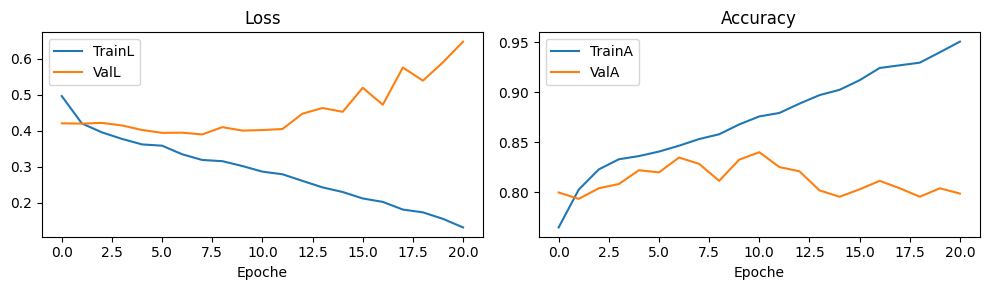


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 8, 12] | Macro 3777 | Sub 3777 | per class {'L': 1908, 'R': 1869}
[DEBUG] Runs [4, 8, 12] | Macro 941 | Sub 941 | per class {'L': 472, 'R': 469}
Ep 01/40 | TrainL 0.5000 | TrainA 0.761 | ValL 0.4728 | ValA 0.763 | BestA 0.763 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4292 | TrainA 0.802 | ValL 0.4443 | ValA 0.784 | BestA 0.784 | ↑ patience 0/10
Ep 03/40 | TrainL 0.4075 | TrainA 0.807 | ValL 0.3976 | ValA 0.812 | BestA 0.812 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3785 | TrainA 0.818 | ValL 0.4086 | ValA 0.812 | BestA 0.812 |   patience

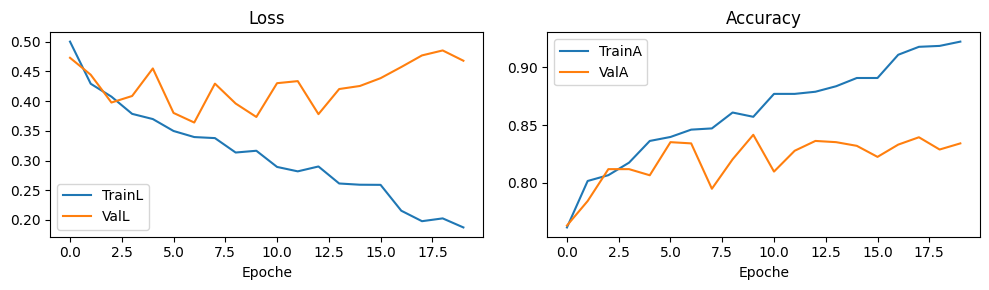


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 8, 12] | Macro 3773 | Sub 3773 | per class {'L': 1898, 'R': 1875}
[DEBUG] Runs [4, 8, 12] | Macro 945 | Sub 945 | per class {'L': 482, 'R': 463}
Ep 01/40 | TrainL 0.4926 | TrainA 0.761 | ValL 0.4401 | ValA 0.792 | BestA 0.792 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4258 | TrainA 0.801 | ValL 0.3962 | ValA 0.804 | BestA 0.804 | ↑ patience 0/10
Ep 03/40 | TrainL 0.3890 | TrainA 0.822 | ValL 0.4126 | ValA 0.813 | BestA 0.813 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3694 | TrainA 0.840 | ValL 0.4076 | ValA 0.812 | BestA 0.813 |   patience

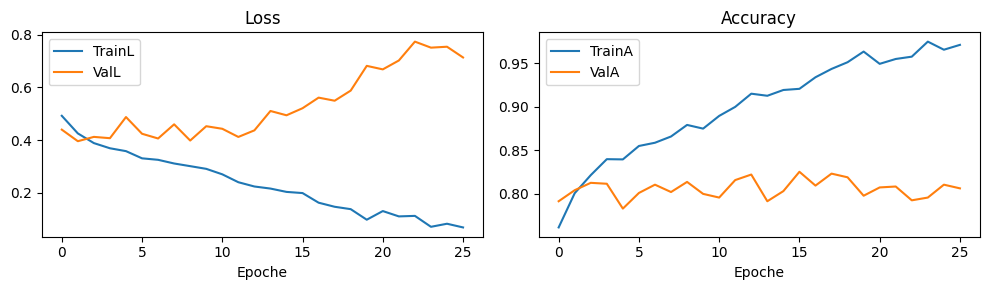


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 8, 12] | Macro 3769 | Sub 3769 | per class {'L': 1901, 'R': 1868}
[DEBUG] Runs [4, 8, 12] | Macro 949 | Sub 949 | per class {'L': 479, 'R': 470}
Ep 01/40 | TrainL 0.4871 | TrainA 0.772 | ValL 0.4574 | ValA 0.784 | BestA 0.784 | ↑ patience 0/10
Ep 02/40 | TrainL 0.3913 | TrainA 0.815 | ValL 0.4883 | ValA 0.757 | BestA 0.784 |   patience 1/10
Ep 03/40 | TrainL 0.3829 | TrainA 0.828 | ValL 0.4667 | ValA 0.765 | BestA 0.784 |   patience 2/10
Ep 04/40 | TrainL 0.3681 | TrainA 0.830 | ValL 0.4675 | ValA 0.800 | BestA 0.800 | ↑ patience

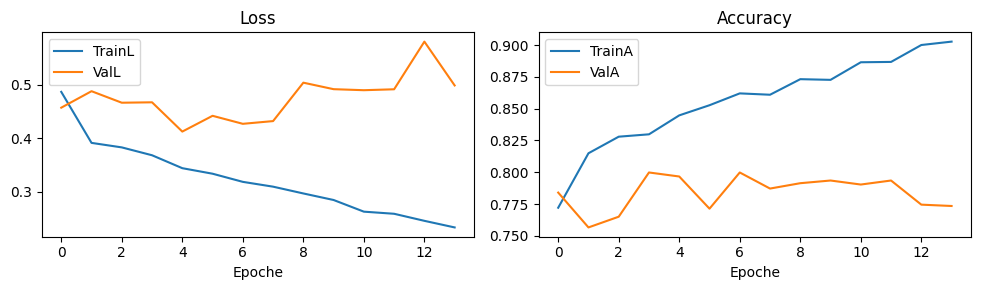


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 8, 12] | Macro 3779 | Sub 3779 | per class {'L': 1907, 'R': 1872}
[DEBUG] Runs [4, 8, 12] | Macro 939 | Sub 939 | per class {'L': 473, 'R': 466}
Ep 01/40 | TrainL 0.5183 | TrainA 0.749 | ValL 0.3366 | ValA 0.856 | BestA 0.856 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4351 | TrainA 0.790 | ValL 0.3269 | ValA 0.855 | BestA 0.856 |   patience 1/10
Ep 03/40 | TrainL 0.4006 | TrainA 0.808 | ValL 0.3675 | ValA 0.827 | BestA 0.856 |   patience 2/10
Ep 04/40 | TrainL 0.3892 | TrainA 0.814 | ValL 0.3263 | ValA 0.845 | BestA 0.856 |   patience

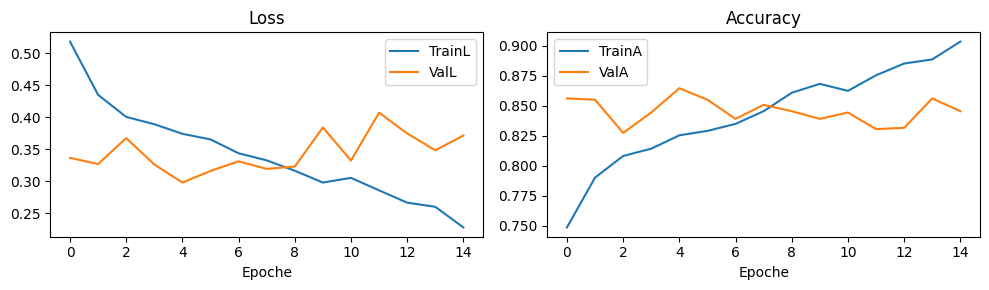


------------------------------------------------------------
exp_LR_4s done | Best per fold [0.840042372881356, 0.8416578108395324, 0.8253968253968254, 0.7997892518440464, 0.8647497337593184]
Media 0.834 ± 0.021
------------------------------------------------------------

 exp_LR0_4s | LABELS=['L', 'R', '0'] | MODE=I | WIN=4.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 8, 12] | Macro 7566 | Sub 7566 | per class {'L': 1906, 'R': 1868, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1889 | Sub 1889 | per class {'L': 474, 'R': 470, '0': 945}
Ep 01/40 | TrainL 0.8310 

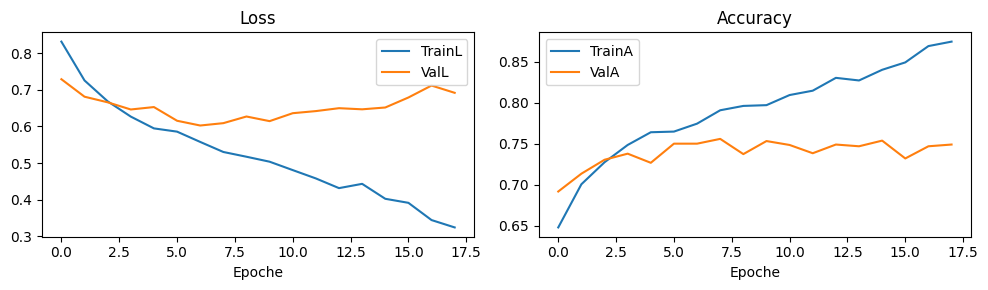


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 8, 12] | Macro 7569 | Sub 7569 | per class {'L': 1908, 'R': 1869, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1886 | Sub 1886 | per class {'L': 472, 'R': 469, '0': 945}
Ep 01/40 | TrainL 0.8209 | TrainA 0.642 | ValL 0.7986 | ValA 0.668 | BestA 0.668 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6966 | TrainA 0.707 | ValL 0.6484 | ValA 0.734 | BestA 0.734 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6536 | TrainA 0.730 | ValL 0.6784 | ValA 0.726 | BestA 0.734 |   patience 1/10
Ep 04/40 | TrainL 0.6116 | TrainA 0.747 | ValL 0.6389 | ValA 0.740 | B

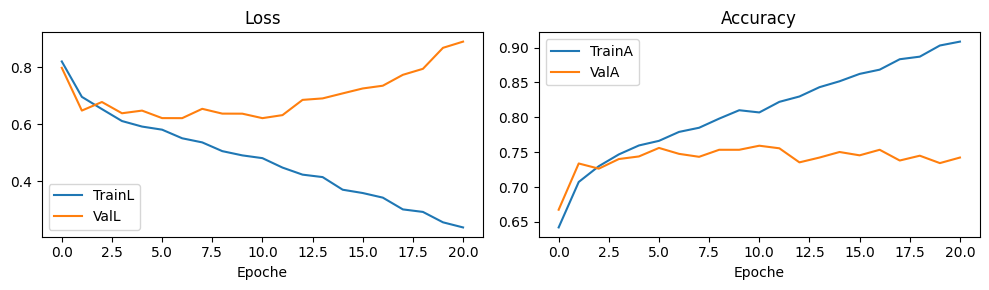


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 8, 12] | Macro 7565 | Sub 7565 | per class {'L': 1898, 'R': 1875, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1890 | Sub 1890 | per class {'L': 482, 'R': 463, '0': 945}
Ep 01/40 | TrainL 0.8147 | TrainA 0.645 | ValL 0.7233 | ValA 0.678 | BestA 0.678 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6882 | TrainA 0.713 | ValL 0.6441 | ValA 0.729 | BestA 0.729 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6229 | TrainA 0.745 | ValL 0.6414 | ValA 0.726 | BestA 0.729 |   patience 1/10
Ep 04/40 | TrainL 0.6005 | TrainA 0.762 | ValL 0.6359 | ValA 0.730 | B

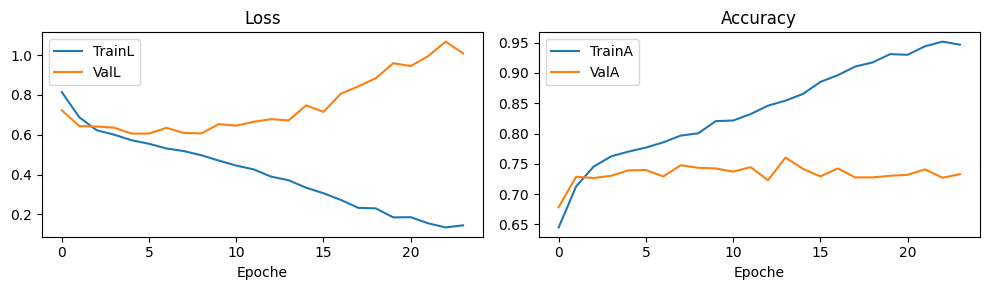


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 8, 12] | Macro 7549 | Sub 7549 | per class {'L': 1901, 'R': 1868, '0': 3780}
[DEBUG] Runs [4, 8, 12] | Macro 1906 | Sub 1906 | per class {'L': 479, 'R': 470, '0': 957}
Ep 01/40 | TrainL 0.8133 | TrainA 0.647 | ValL 0.7624 | ValA 0.670 | BestA 0.670 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6802 | TrainA 0.715 | ValL 0.7533 | ValA 0.685 | BestA 0.685 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6331 | TrainA 0.738 | ValL 0.7222 | ValA 0.696 | BestA 0.696 | ↑ patience 0/10
Ep 04/40 | TrainL 0.5907 | TrainA 0.761 | ValL 0.7120 | ValA 0.712 | B

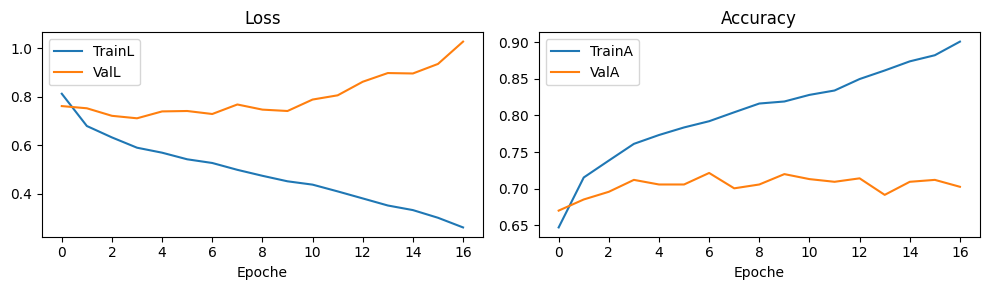


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 8, 12] | Macro 7571 | Sub 7571 | per class {'L': 1907, 'R': 1872, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1884 | Sub 1884 | per class {'L': 473, 'R': 466, '0': 945}
Ep 01/40 | TrainL 0.8182 | TrainA 0.647 | ValL 0.7279 | ValA 0.705 | BestA 0.705 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7011 | TrainA 0.712 | ValL 0.5868 | ValA 0.754 | BestA 0.754 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6543 | TrainA 0.732 | ValL 0.5706 | ValA 0.769 | BestA 0.769 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6322 | TrainA 0.745 | ValL 0.5377 | ValA 0.774 | B

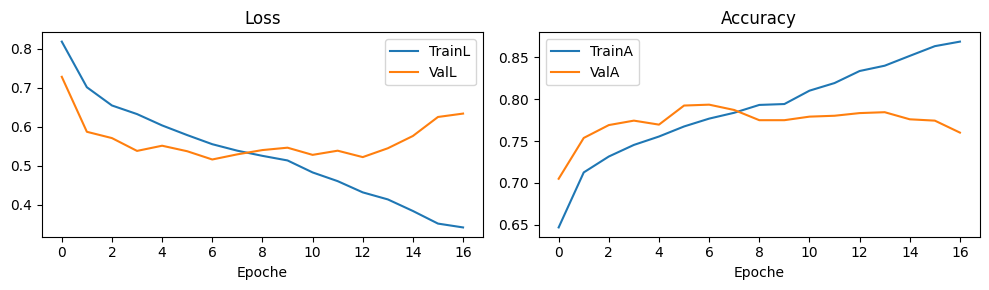


------------------------------------------------------------
exp_LR0_4s done | Best per fold [0.7559555320275277, 0.7592788971367974, 0.7603174603174603, 0.7214060860440713, 0.7935244161358811]
Media 0.758 ± 0.023
------------------------------------------------------------

 exp_LR0F_4s | LABELS=['L', 'R', '0', 'F'] | MODE=I | WIN=4.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]


[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13243 | Sub 13243 | per class {'L': 1906, 'R': 1868, '0': 7584, 'F': 1885}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3305 | Sub 3305 | per class {'L': 474, 'R': 470, '0': 1890, 'F': 471}
Ep 01/40 | TrainL 0.9416 | TrainA 0.643 | ValL 0.8274 | ValA 0.687 | BestA 0.687 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8233 | TrainA 0.692 | ValL 0.7568 | ValA 0.724 | BestA 0.724 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7827 | TrainA 0.713 | ValL 0.7459 | ValA 0.727 | BestA 0.727 | ↑ patience 0/10
Ep 04/40 | TrainL 0.7508 | TrainA 0.727 | ValL 0.7507 | ValA 0.724 | BestA 0.727 |   patience 1/10
Ep 05/40 | TrainL 0.7196 | TrainA 0.736 | ValL 0.7304 | ValA 0.730 | BestA 0.730 | ↑ patience 0/10
Ep 06/40 | TrainL 0.7091 | TrainA 0.738 | ValL 0.7130 | ValA 0.742 | BestA 0.742 | ↑ patience 0/10
Ep 07/40 | TrainL 0.6836 | TrainA 0.746 | ValL 0.6865 | ValA 0.759 | BestA 0.759 | ↑ patience 0/10
Ep 08/40 | TrainL 0.6633 | TrainA 0.759 | ValL 0.6979 | ValA 0.753 | BestA 0

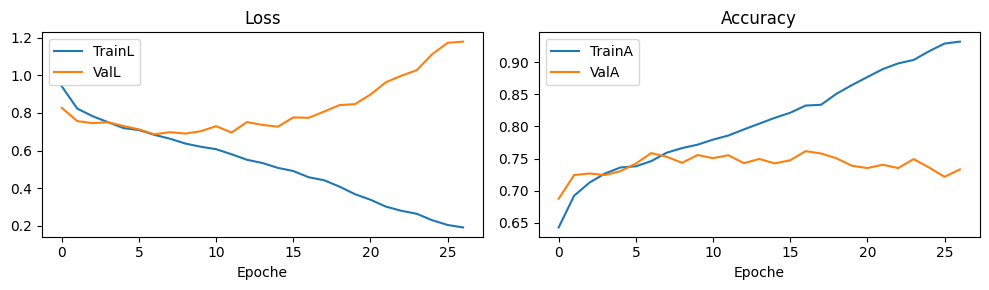


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13241 | Sub 13241 | per class {'L': 1908, 'R': 1869, '0': 7584, 'F': 1880}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3307 | Sub 3307 | per class {'L': 472, 'R': 469, '0': 1890, 'F': 476}
Ep 01/40 | TrainL 0.9289 | TrainA 0.647 | ValL 0.8256 | ValA 0.701 | BestA 0.701 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8015 | TrainA 0.699 | ValL 0.7913 | ValA 0.703 | BestA 0.703 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7545 | TrainA 0.720 | ValL 0.7776 | ValA 0.713 | BestA 0.713 | ↑ patience 0/10
Ep 04/40 | TrainL 0.7261

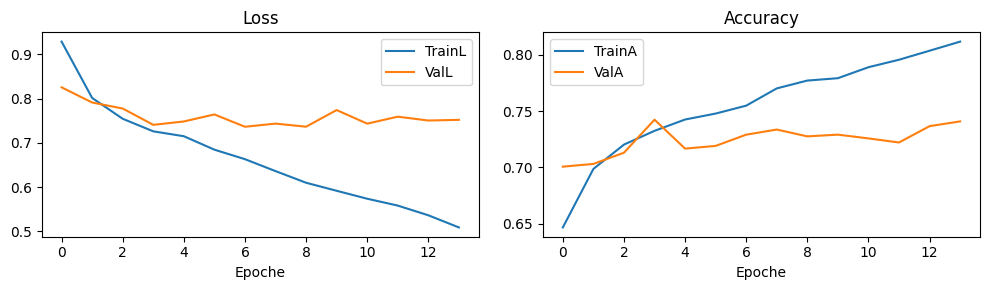


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13244 | Sub 13244 | per class {'L': 1898, 'R': 1875, '0': 7584, 'F': 1887}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3304 | Sub 3304 | per class {'L': 482, 'R': 463, '0': 1890, 'F': 469}
Ep 01/40 | TrainL 0.9372 | TrainA 0.640 | ValL 0.8460 | ValA 0.683 | BestA 0.683 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8151 | TrainA 0.696 | ValL 0.7898 | ValA 0.702 | BestA 0.702 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7735 | TrainA 0.710 | ValL 0.8058 | ValA 0.695 | BestA 0.702 |   patience 1/10
Ep 04/40 | TrainL 0.7480

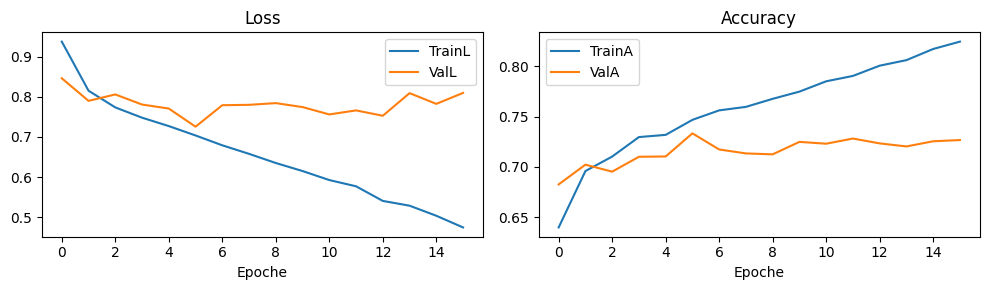


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13212 | Sub 13212 | per class {'L': 1901, 'R': 1868, '0': 7560, 'F': 1883}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3336 | Sub 3336 | per class {'L': 479, 'R': 470, '0': 1914, 'F': 473}
Ep 01/40 | TrainL 0.9148 | TrainA 0.650 | ValL 0.9246 | ValA 0.656 | BestA 0.656 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7991 | TrainA 0.704 | ValL 0.8731 | ValA 0.684 | BestA 0.684 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7593 | TrainA 0.722 | ValL 0.8358 | ValA 0.688 | BestA 0.688 | ↑ patience 0/10
Ep 04/40 | TrainL 0.7236

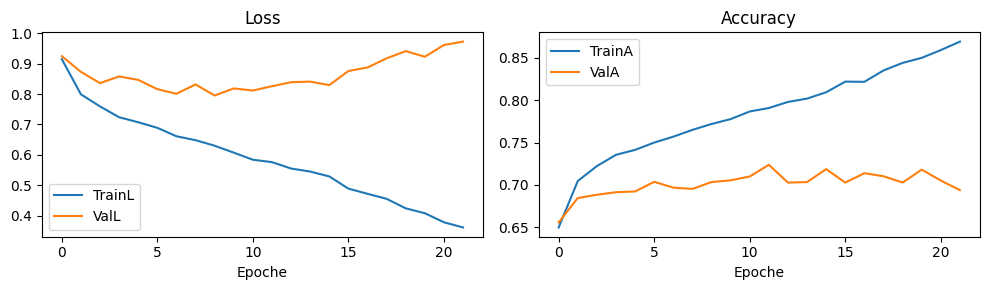


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13252 | Sub 13252 | per class {'L': 1907, 'R': 1872, '0': 7584, 'F': 1889}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3296 | Sub 3296 | per class {'L': 473, 'R': 466, '0': 1890, 'F': 467}
Ep 01/40 | TrainL 0.9479 | TrainA 0.636 | ValL 0.7725 | ValA 0.709 | BestA 0.709 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8251 | TrainA 0.696 | ValL 0.7050 | ValA 0.737 | BestA 0.737 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7851 | TrainA 0.710 | ValL 0.6953 | ValA 0.750 | BestA 0.750 | ↑ patience 0/10
Ep 04/40 | TrainL 0.7493

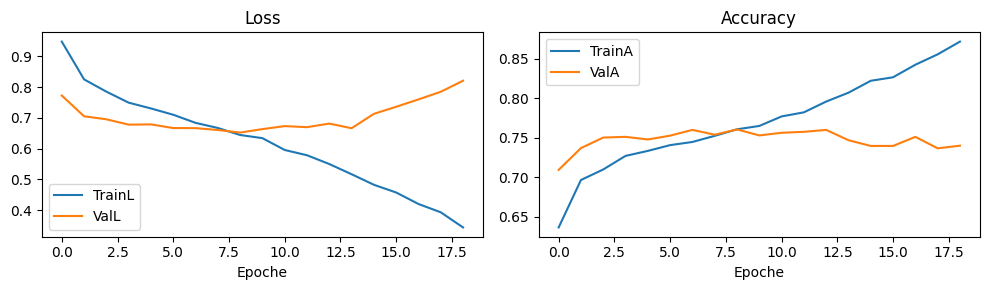


------------------------------------------------------------
exp_LR0F_4s done | Best per fold [0.7615733736762481, 0.74236468097974, 0.7333535108958837, 0.723621103117506, 0.7606189320388349]
Media 0.744 ± 0.015
------------------------------------------------------------

 exp_LR0FB_4s | LABELS=['L', 'R', '0', 'F', 'B'] | MODE=I | WIN=4.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15129 | Sub 15129 | per class {'L': 1906, 'R': 1868, '0': 7584, 'F': 1885, 'B': 1886}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3777 | Sub 3777 | per clas

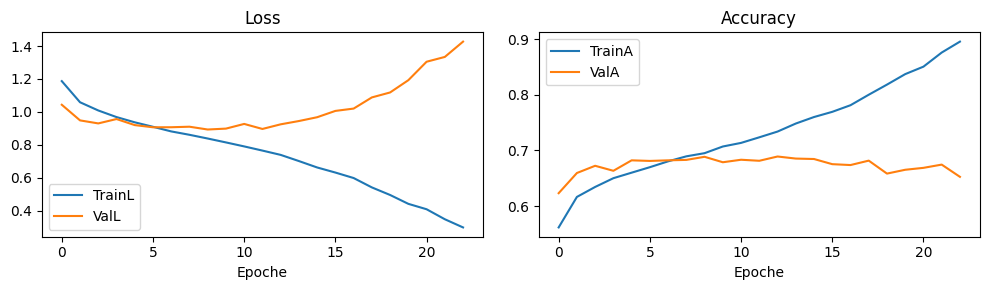


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15133 | Sub 15133 | per class {'L': 1908, 'R': 1869, '0': 7584, 'F': 1880, 'B': 1892}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3773 | Sub 3773 | per class {'L': 472, 'R': 469, '0': 1890, 'F': 476, 'B': 466}
Ep 01/40 | TrainL 1.1725 | TrainA 0.570 | ValL 1.0677 | ValA 0.622 | BestA 0.622 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0413 | TrainA 0.621 | ValL 1.0057 | ValA 0.640 | BestA 0.640 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9946 | TrainA 0.635 | ValL 1.0118 | ValA 0.635 | BestA 0.640 |   patience 1/10
Ep 

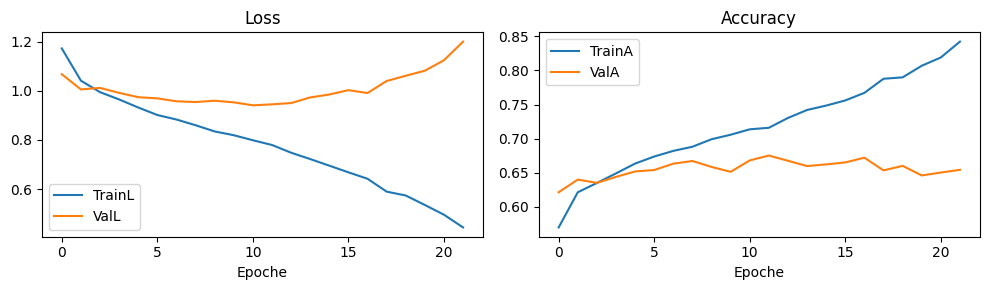


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15126 | Sub 15126 | per class {'L': 1898, 'R': 1875, '0': 7584, 'F': 1887, 'B': 1882}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3780 | Sub 3780 | per class {'L': 482, 'R': 463, '0': 1890, 'F': 469, 'B': 476}
Ep 01/40 | TrainL 1.1834 | TrainA 0.561 | ValL 1.0769 | ValA 0.605 | BestA 0.605 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0425 | TrainA 0.624 | ValL 1.0382 | ValA 0.622 | BestA 0.622 | ↑ patience 0/10
Ep 03/40 | TrainL 1.0017 | TrainA 0.638 | ValL 0.9934 | ValA 0.628 | BestA 0.628 | ↑ patience 0/10
Ep 

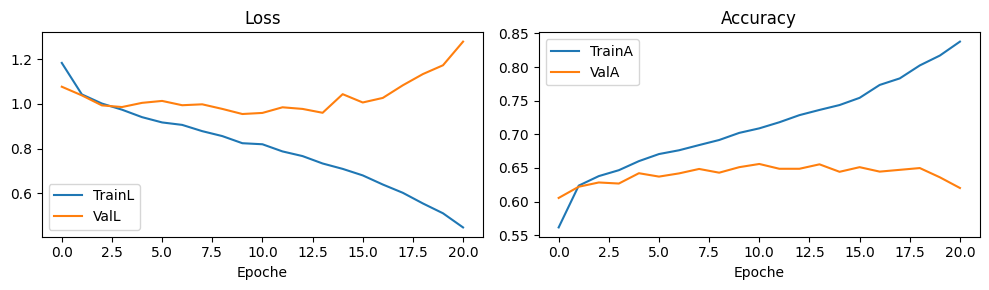


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15095 | Sub 15095 | per class {'L': 1901, 'R': 1868, '0': 7560, 'F': 1883, 'B': 1883}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3811 | Sub 3811 | per class {'L': 479, 'R': 470, '0': 1914, 'F': 473, 'B': 475}
Ep 01/40 | TrainL 1.1689 | TrainA 0.568 | ValL 1.1539 | ValA 0.587 | BestA 0.587 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0237 | TrainA 0.630 | ValL 1.1184 | ValA 0.601 | BestA 0.601 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9741 | TrainA 0.648 | ValL 1.1008 | ValA 0.612 | BestA 0.612 | ↑ patience 0/10
Ep 

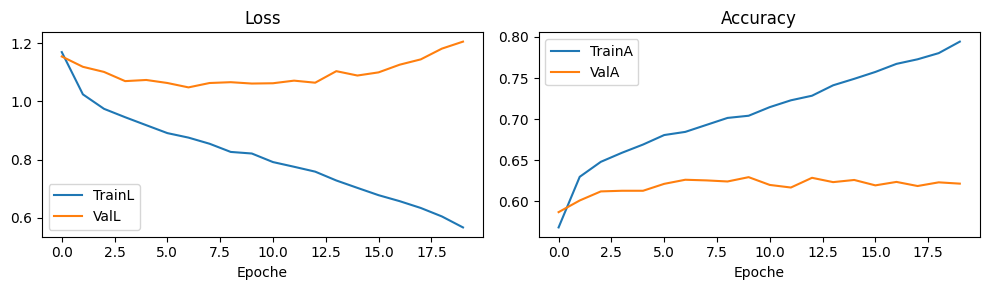


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15141 | Sub 15141 | per class {'L': 1907, 'R': 1872, '0': 7584, 'F': 1889, 'B': 1889}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3765 | Sub 3765 | per class {'L': 473, 'R': 466, '0': 1890, 'F': 467, 'B': 469}
Ep 01/40 | TrainL 1.1986 | TrainA 0.558 | ValL 0.9634 | ValA 0.650 | BestA 0.650 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0553 | TrainA 0.616 | ValL 0.9489 | ValA 0.652 | BestA 0.652 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9987 | TrainA 0.636 | ValL 0.8827 | ValA 0.687 | BestA 0.687 | ↑ patience 0/10
Ep 

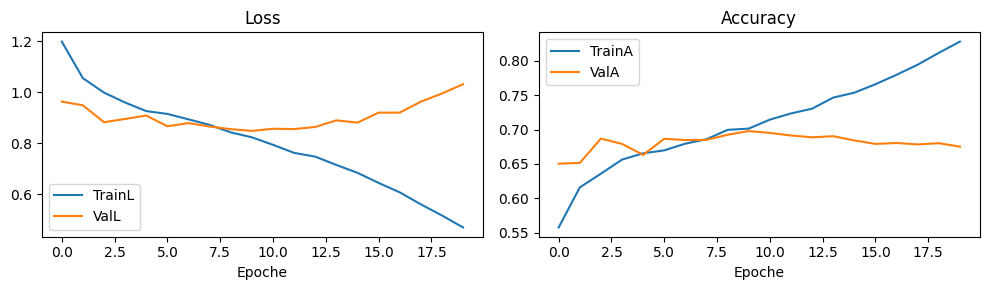


------------------------------------------------------------
exp_LR0FB_4s done | Best per fold [0.689171299973524, 0.6753246753246753, 0.6558201058201059, 0.629493571241144, 0.6977423638778221]
Media 0.670 ± 0.025
------------------------------------------------------------

 exp_LR_2s | LABELS=['L', 'R'] | MODE=I | WIN=2.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 8, 12] | Macro 3774 | Sub 7548 | per class {'L': 1906, 'R': 1868}
[DEBUG] Runs [4, 8, 12] | Macro 944 | Sub 1888 | per class {'L': 474, 'R': 470}
Ep 01/40 | TrainL 0.4986 | TrainA 0.766 | ValL 0.45

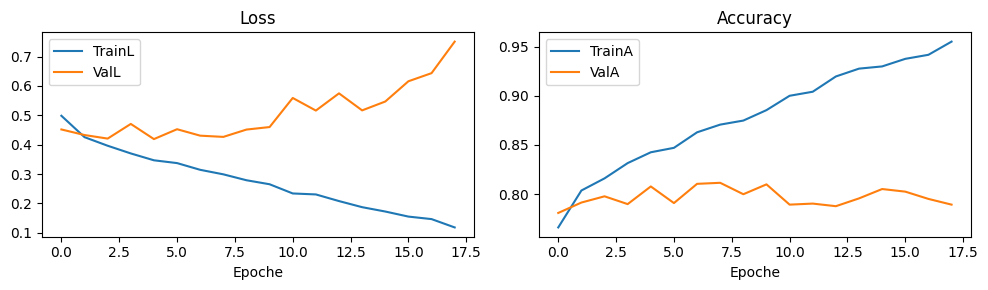


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 8, 12] | Macro 3777 | Sub 7554 | per class {'L': 1908, 'R': 1869}
[DEBUG] Runs [4, 8, 12] | Macro 941 | Sub 1882 | per class {'L': 472, 'R': 469}
Ep 01/40 | TrainL 0.4927 | TrainA 0.758 | ValL 0.4159 | ValA 0.803 | BestA 0.803 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4169 | TrainA 0.801 | ValL 0.3959 | ValA 0.825 | BestA 0.825 | ↑ patience 0/10
Ep 03/40 | TrainL 0.3815 | TrainA 0.818 | ValL 0.3860 | ValA 0.824 | BestA 0.825 |   patience 1/10
Ep 04/40 | TrainL 0.3673 | TrainA 0.827 | ValL 0.4049 | ValA 0.811 | BestA 0.825 |   patienc

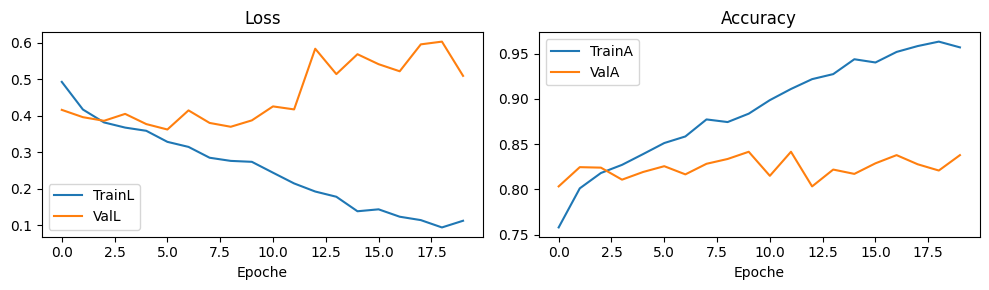


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 8, 12] | Macro 3773 | Sub 7546 | per class {'L': 1898, 'R': 1875}
[DEBUG] Runs [4, 8, 12] | Macro 945 | Sub 1890 | per class {'L': 482, 'R': 463}
Ep 01/40 | TrainL 0.4868 | TrainA 0.761 | ValL 0.4660 | ValA 0.776 | BestA 0.776 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4267 | TrainA 0.804 | ValL 0.4176 | ValA 0.805 | BestA 0.805 | ↑ patience 0/10
Ep 03/40 | TrainL 0.3982 | TrainA 0.816 | ValL 0.4013 | ValA 0.817 | BestA 0.817 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3821 | TrainA 0.825 | ValL 0.3646 | ValA 0.831 | BestA 0.831 | ↑ patienc

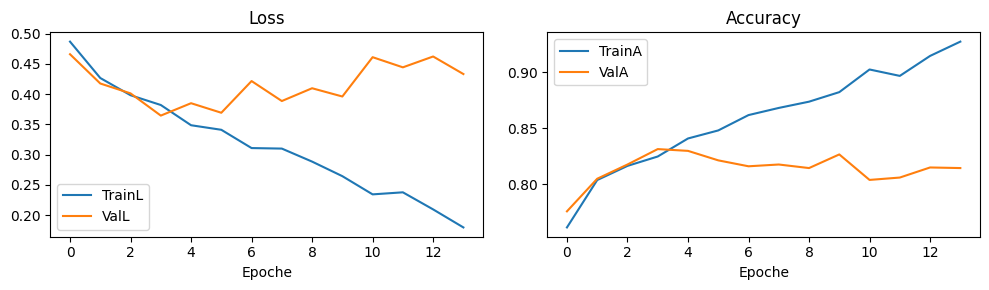


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 8, 12] | Macro 3769 | Sub 7538 | per class {'L': 1901, 'R': 1868}
[DEBUG] Runs [4, 8, 12] | Macro 949 | Sub 1898 | per class {'L': 479, 'R': 470}
Ep 01/40 | TrainL 0.4898 | TrainA 0.757 | ValL 0.4734 | ValA 0.754 | BestA 0.754 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4030 | TrainA 0.814 | ValL 0.4825 | ValA 0.750 | BestA 0.754 |   patience 1/10
Ep 03/40 | TrainL 0.3800 | TrainA 0.824 | ValL 0.4862 | ValA 0.769 | BestA 0.769 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3624 | TrainA 0.830 | ValL 0.4543 | ValA 0.781 | BestA 0.781 | ↑ patienc

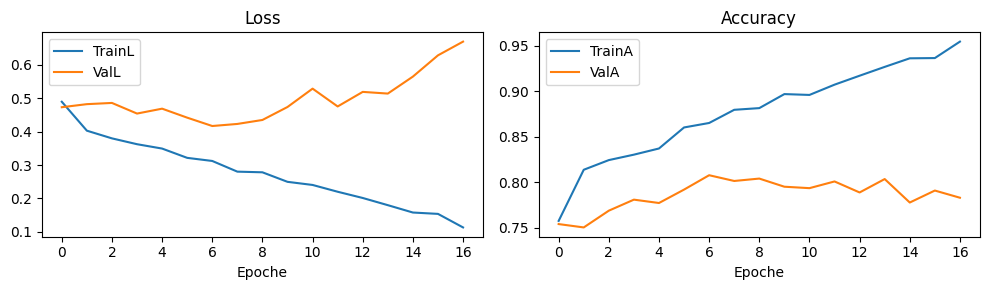


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 8, 12] | Macro 3779 | Sub 7558 | per class {'L': 1907, 'R': 1872}
[DEBUG] Runs [4, 8, 12] | Macro 939 | Sub 1878 | per class {'L': 473, 'R': 466}
Ep 01/40 | TrainL 0.5130 | TrainA 0.757 | ValL 0.3944 | ValA 0.807 | BestA 0.807 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4553 | TrainA 0.786 | ValL 0.3949 | ValA 0.801 | BestA 0.807 |   patience 1/10
Ep 03/40 | TrainL 0.4254 | TrainA 0.796 | ValL 0.3565 | ValA 0.841 | BestA 0.841 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3841 | TrainA 0.817 | ValL 0.3201 | ValA 0.855 | BestA 0.855 | ↑ patienc

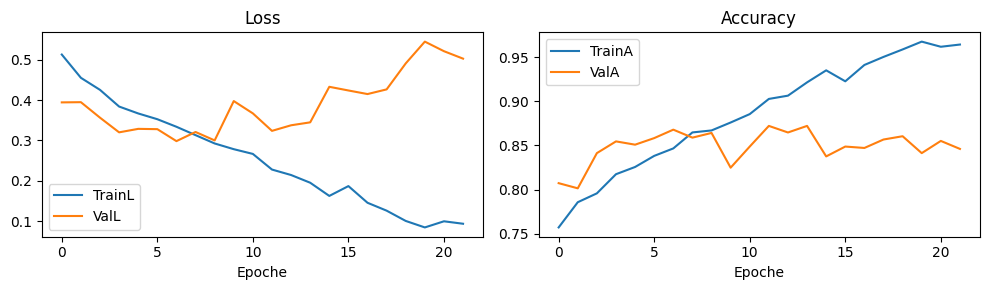


------------------------------------------------------------
exp_LR_2s done | Best per fold [0.8114406779661016, 0.8416578108395324, 0.8312169312169312, 0.8076923076923077, 0.8722044728434505]
Media 0.833 ± 0.023
------------------------------------------------------------

 exp_LR0_2s | LABELS=['L', 'R', '0'] | MODE=I | WIN=2.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 8, 12] | Macro 7566 | Sub 15132 | per class {'L': 1906, 'R': 1868, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1889 | Sub 3778 | per class {'L': 474, 'R': 470, '0': 945}
Ep 01/40 | TrainL 0.798

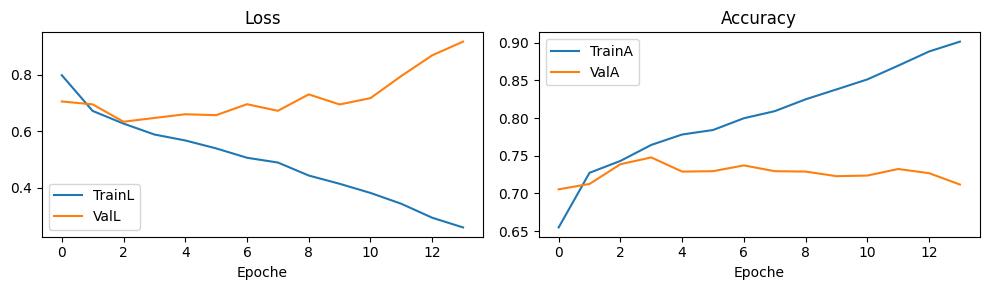


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 8, 12] | Macro 7569 | Sub 15138 | per class {'L': 1908, 'R': 1869, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1886 | Sub 3772 | per class {'L': 472, 'R': 469, '0': 945}
Ep 01/40 | TrainL 0.8040 | TrainA 0.652 | ValL 0.7446 | ValA 0.686 | BestA 0.686 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6730 | TrainA 0.725 | ValL 0.6323 | ValA 0.743 | BestA 0.743 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6255 | TrainA 0.740 | ValL 0.6342 | ValA 0.750 | BestA 0.750 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6020 | TrainA 0.754 | ValL 0.6644 | ValA 0.733 | 

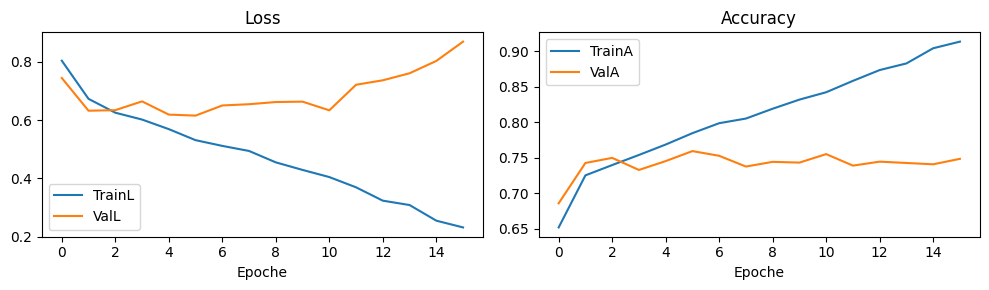


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 8, 12] | Macro 7565 | Sub 15130 | per class {'L': 1898, 'R': 1875, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1890 | Sub 3780 | per class {'L': 482, 'R': 463, '0': 945}
Ep 01/40 | TrainL 0.8108 | TrainA 0.652 | ValL 0.7547 | ValA 0.684 | BestA 0.684 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6738 | TrainA 0.723 | ValL 0.6797 | ValA 0.718 | BestA 0.718 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6311 | TrainA 0.745 | ValL 0.6497 | ValA 0.732 | BestA 0.732 | ↑ patience 0/10
Ep 04/40 | TrainL 0.5958 | TrainA 0.761 | ValL 0.6868 | ValA 0.716 | 

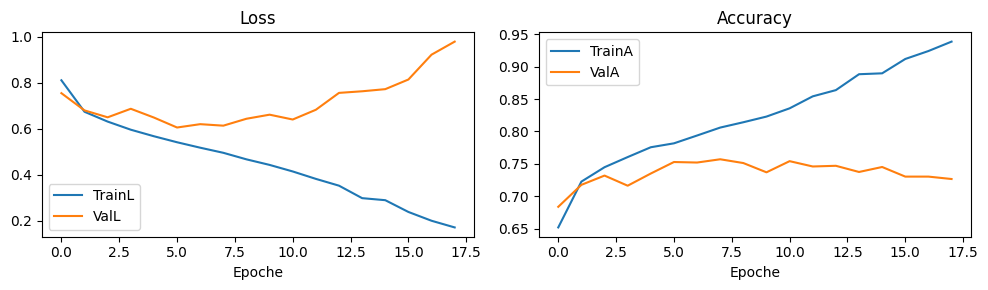


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 8, 12] | Macro 7549 | Sub 15098 | per class {'L': 1901, 'R': 1868, '0': 3780}
[DEBUG] Runs [4, 8, 12] | Macro 1906 | Sub 3812 | per class {'L': 479, 'R': 470, '0': 957}
Ep 01/40 | TrainL 0.7759 | TrainA 0.665 | ValL 0.7670 | ValA 0.683 | BestA 0.683 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6558 | TrainA 0.731 | ValL 0.7280 | ValA 0.692 | BestA 0.692 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6112 | TrainA 0.754 | ValL 0.6837 | ValA 0.720 | BestA 0.720 | ↑ patience 0/10
Ep 04/40 | TrainL 0.5764 | TrainA 0.771 | ValL 0.7223 | ValA 0.718 | 

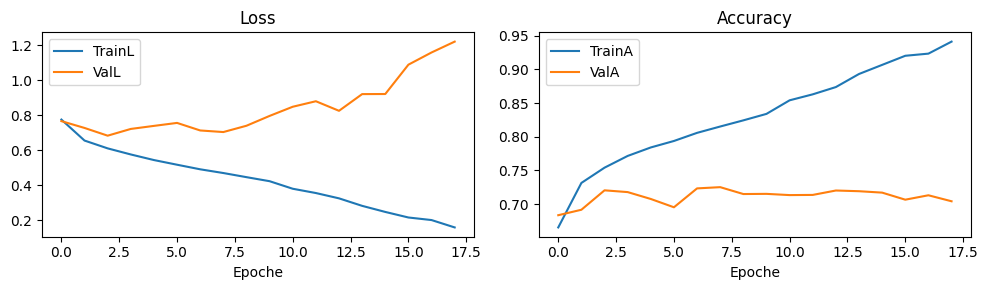


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 8, 12] | Macro 7571 | Sub 15142 | per class {'L': 1907, 'R': 1872, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1884 | Sub 3768 | per class {'L': 473, 'R': 466, '0': 945}
Ep 01/40 | TrainL 0.8119 | TrainA 0.650 | ValL 0.6556 | ValA 0.733 | BestA 0.733 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6963 | TrainA 0.713 | ValL 0.6015 | ValA 0.757 | BestA 0.757 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6464 | TrainA 0.738 | ValL 0.5776 | ValA 0.764 | BestA 0.764 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6195 | TrainA 0.745 | ValL 0.5981 | ValA 0.762 | 

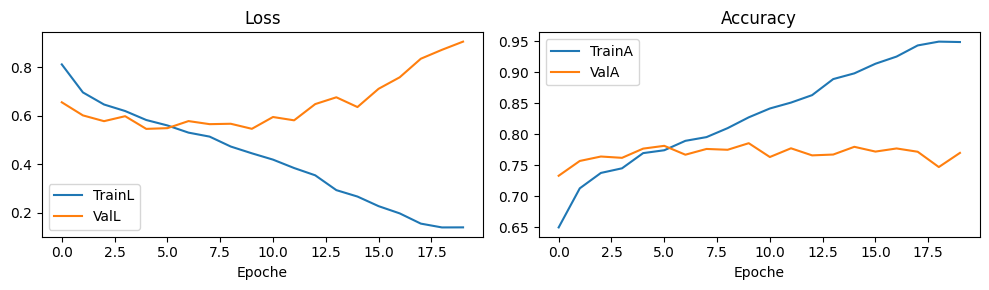


------------------------------------------------------------
exp_LR0_2s done | Best per fold [0.7477501323451562, 0.7592788971367974, 0.7571428571428571, 0.7250786988457503, 0.785828025477707]
Media 0.755 ± 0.020
------------------------------------------------------------

 exp_LR0F_2s | LABELS=['L', 'R', '0', 'F'] | MODE=I | WIN=2.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13243 | Sub 26486 | per class {'L': 1906, 'R': 1868, '0': 7584, 'F': 1885}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3305 | Sub 6610 | per class {'L': 474, 'R'

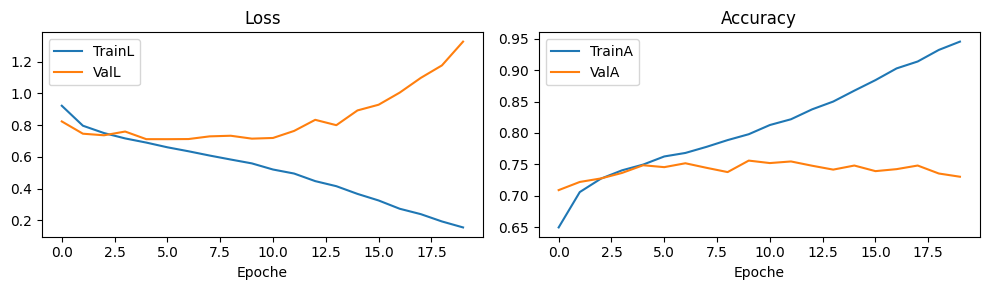


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13241 | Sub 26482 | per class {'L': 1908, 'R': 1869, '0': 7584, 'F': 1880}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3307 | Sub 6614 | per class {'L': 472, 'R': 469, '0': 1890, 'F': 476}
Ep 01/40 | TrainL 0.9148 | TrainA 0.651 | ValL 0.8231 | ValA 0.706 | BestA 0.706 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7827 | TrainA 0.713 | ValL 0.8293 | ValA 0.678 | BestA 0.706 |   patience 1/10
Ep 03/40 | TrainL 0.7407 | TrainA 0.724 | ValL 0.8021 | ValA 0.724 | BestA 0.724 | ↑ patience 0/10
Ep 04/40 | TrainL 0.7018

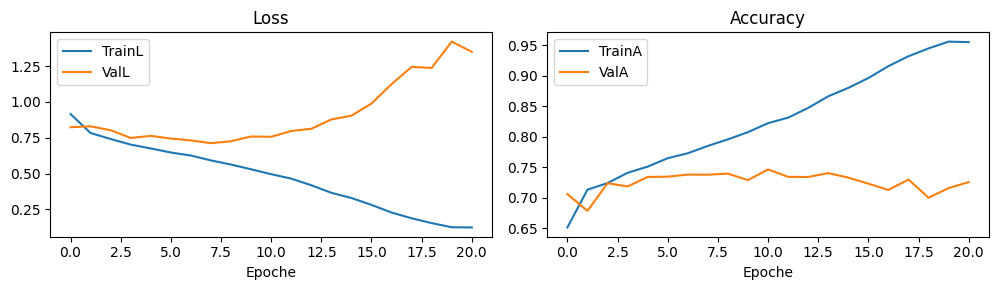


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13244 | Sub 26488 | per class {'L': 1898, 'R': 1875, '0': 7584, 'F': 1887}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3304 | Sub 6608 | per class {'L': 482, 'R': 463, '0': 1890, 'F': 469}
Ep 01/40 | TrainL 0.9227 | TrainA 0.651 | ValL 0.8330 | ValA 0.684 | BestA 0.684 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7871 | TrainA 0.710 | ValL 0.8002 | ValA 0.701 | BestA 0.701 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7382 | TrainA 0.733 | ValL 0.8004 | ValA 0.714 | BestA 0.714 | ↑ patience 0/10
Ep 04/40 | TrainL 0.7041

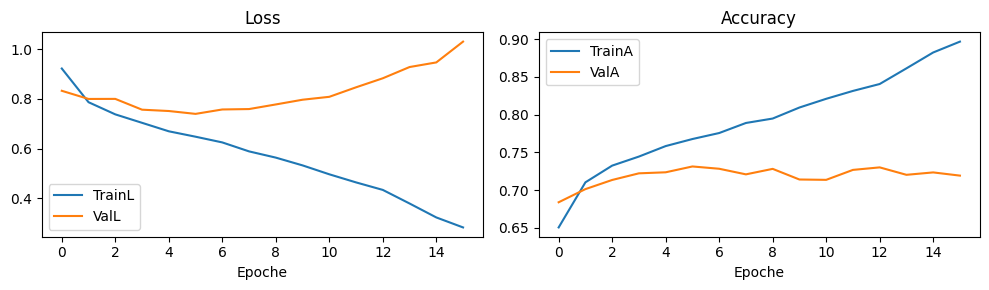


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13212 | Sub 26424 | per class {'L': 1901, 'R': 1868, '0': 7560, 'F': 1883}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3336 | Sub 6672 | per class {'L': 479, 'R': 470, '0': 1914, 'F': 473}
Ep 01/40 | TrainL 0.8965 | TrainA 0.658 | ValL 0.9383 | ValA 0.654 | BestA 0.654 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7684 | TrainA 0.716 | ValL 0.8586 | ValA 0.690 | BestA 0.690 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7265 | TrainA 0.731 | ValL 0.8423 | ValA 0.701 | BestA 0.701 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6862

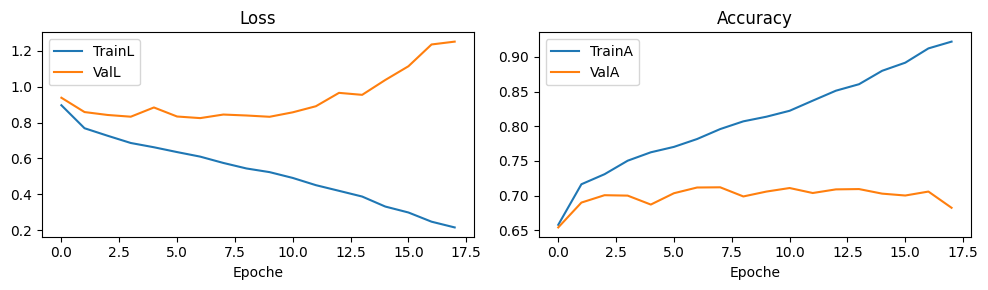


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13252 | Sub 26504 | per class {'L': 1907, 'R': 1872, '0': 7584, 'F': 1889}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3296 | Sub 6592 | per class {'L': 473, 'R': 466, '0': 1890, 'F': 467}
Ep 01/40 | TrainL 0.9353 | TrainA 0.643 | ValL 0.7690 | ValA 0.705 | BestA 0.705 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8134 | TrainA 0.701 | ValL 0.7142 | ValA 0.735 | BestA 0.735 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7643 | TrainA 0.720 | ValL 0.7307 | ValA 0.729 | BestA 0.735 |   patience 1/10
Ep 04/40 | TrainL 0.7302

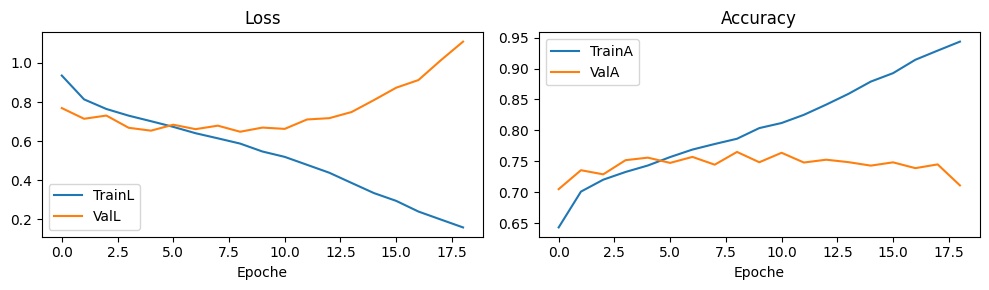


------------------------------------------------------------
exp_LR0F_2s done | Best per fold [0.7559757942511346, 0.7462957363169035, 0.7313861985472155, 0.7120803357314148, 0.7650182038834952]
Media 0.742 ± 0.019
------------------------------------------------------------

 exp_LR0FB_2s | LABELS=['L', 'R', '0', 'F', 'B'] | MODE=I | WIN=2.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15129 | Sub 30258 | per class {'L': 1906, 'R': 1868, '0': 7584, 'F': 1885, 'B': 1886}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3777 | Sub 7554 | per c

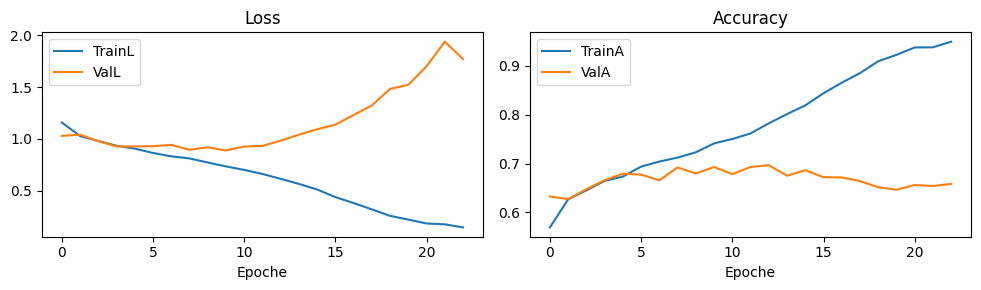


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15133 | Sub 30266 | per class {'L': 1908, 'R': 1869, '0': 7584, 'F': 1880, 'B': 1892}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3773 | Sub 7546 | per class {'L': 472, 'R': 469, '0': 1890, 'F': 476, 'B': 466}
Ep 01/40 | TrainL 1.1482 | TrainA 0.572 | ValL 1.0038 | ValA 0.651 | BestA 0.651 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0044 | TrainA 0.636 | ValL 0.9771 | ValA 0.655 | BestA 0.655 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9498 | TrainA 0.661 | ValL 0.9719 | ValA 0.651 | BestA 0.655 |   patience 1/10
Ep 

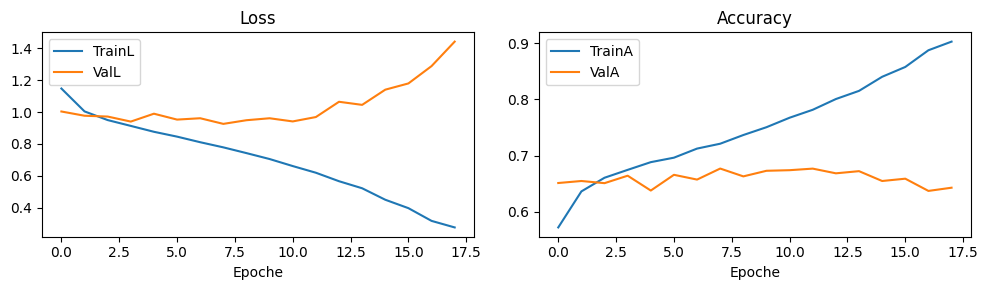


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15126 | Sub 30252 | per class {'L': 1898, 'R': 1875, '0': 7584, 'F': 1887, 'B': 1882}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3780 | Sub 7560 | per class {'L': 482, 'R': 463, '0': 1890, 'F': 469, 'B': 476}
Ep 01/40 | TrainL 1.1390 | TrainA 0.581 | ValL 1.0621 | ValA 0.610 | BestA 0.610 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0035 | TrainA 0.641 | ValL 1.0027 | ValA 0.626 | BestA 0.626 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9518 | TrainA 0.663 | ValL 0.9750 | ValA 0.644 | BestA 0.644 | ↑ patience 0/10
Ep 

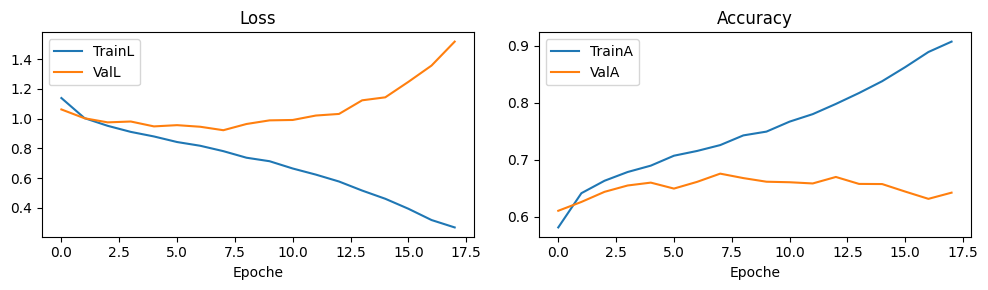


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15095 | Sub 30190 | per class {'L': 1901, 'R': 1868, '0': 7560, 'F': 1883, 'B': 1883}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3811 | Sub 7622 | per class {'L': 479, 'R': 470, '0': 1914, 'F': 473, 'B': 475}
Ep 01/40 | TrainL 1.1316 | TrainA 0.584 | ValL 1.1208 | ValA 0.584 | BestA 0.584 | ↑ patience 0/10
Ep 02/40 | TrainL 0.9838 | TrainA 0.647 | ValL 1.1063 | ValA 0.611 | BestA 0.611 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9369 | TrainA 0.667 | ValL 1.1116 | ValA 0.611 | BestA 0.611 |   patience 1/10
Ep 

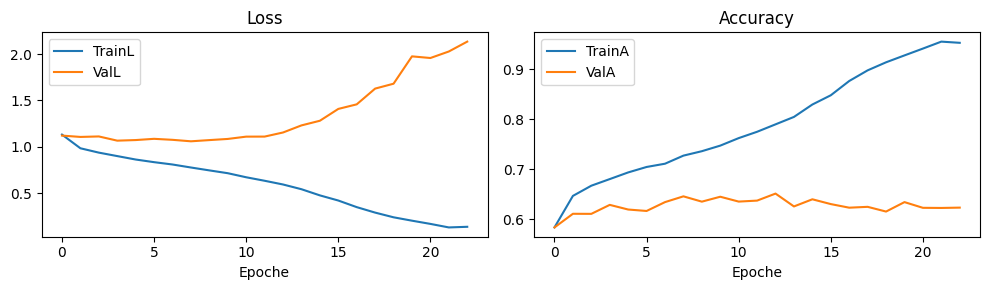


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15141 | Sub 30282 | per class {'L': 1907, 'R': 1872, '0': 7584, 'F': 1889, 'B': 1889}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3765 | Sub 7530 | per class {'L': 473, 'R': 466, '0': 1890, 'F': 467, 'B': 469}
Ep 01/40 | TrainL 1.1793 | TrainA 0.562 | ValL 0.9987 | ValA 0.639 | BestA 0.639 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0336 | TrainA 0.629 | ValL 0.9176 | ValA 0.667 | BestA 0.667 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9791 | TrainA 0.650 | ValL 0.9239 | ValA 0.664 | BestA 0.667 |   patience 1/10
Ep 

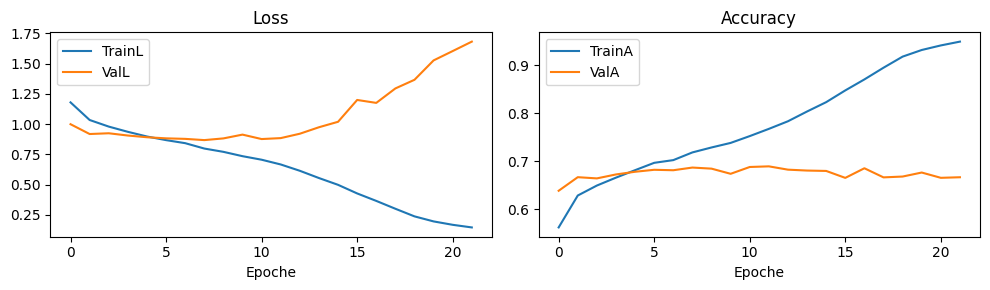


------------------------------------------------------------
exp_LR0FB_2s done | Best per fold [0.6965845909451946, 0.6770474423535648, 0.6755291005291005, 0.6516662293361323, 0.6895086321381142]
Media 0.678 ± 0.015
------------------------------------------------------------

 exp_LR_1s_I | LABELS=['L', 'R'] | MODE=I | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 8, 12] | Macro 3774 | Sub 15096 | per class {'L': 1906, 'R': 1868}
[DEBUG] Runs [4, 8, 12] | Macro 944 | Sub 3776 | per class {'L': 474, 'R': 470}
Ep 01/40 | TrainL 0.5197 | TrainA 0.740 | ValL

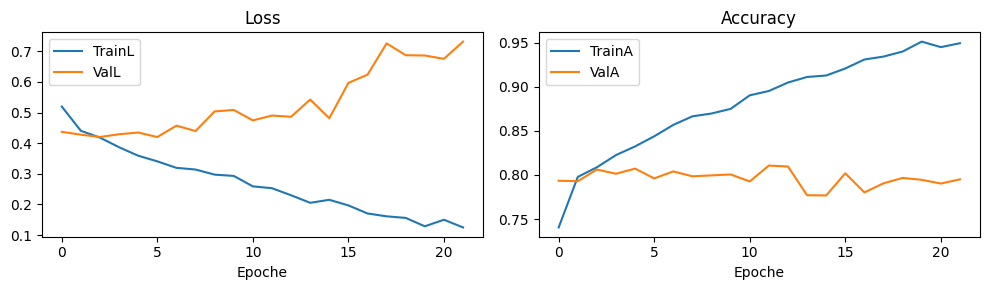


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 8, 12] | Macro 3777 | Sub 15108 | per class {'L': 1908, 'R': 1869}
[DEBUG] Runs [4, 8, 12] | Macro 941 | Sub 3764 | per class {'L': 472, 'R': 469}
Ep 01/40 | TrainL 0.5212 | TrainA 0.743 | ValL 0.4691 | ValA 0.781 | BestA 0.781 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4310 | TrainA 0.797 | ValL 0.4589 | ValA 0.797 | BestA 0.797 | ↑ patience 0/10
Ep 03/40 | TrainL 0.4013 | TrainA 0.814 | ValL 0.4620 | ValA 0.774 | BestA 0.797 |   patience 1/10
Ep 04/40 | TrainL 0.3844 | TrainA 0.820 | ValL 0.4673 | ValA 0.775 | BestA 0.797 |   patien

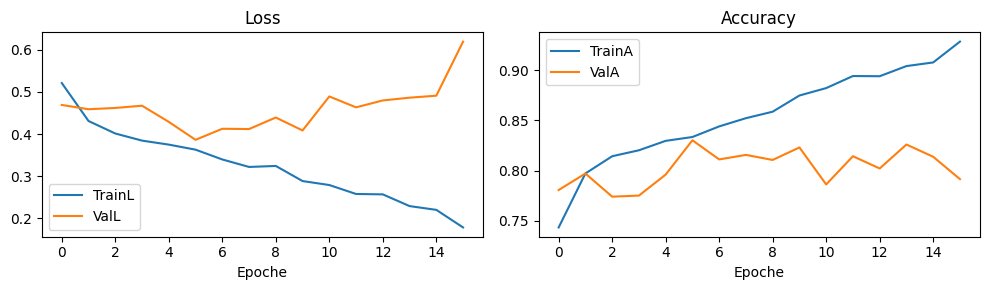


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 8, 12] | Macro 3773 | Sub 15092 | per class {'L': 1898, 'R': 1875}
[DEBUG] Runs [4, 8, 12] | Macro 945 | Sub 3780 | per class {'L': 482, 'R': 463}
Ep 01/40 | TrainL 0.5206 | TrainA 0.744 | ValL 0.4716 | ValA 0.766 | BestA 0.766 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4370 | TrainA 0.794 | ValL 0.4233 | ValA 0.790 | BestA 0.790 | ↑ patience 0/10
Ep 03/40 | TrainL 0.4161 | TrainA 0.807 | ValL 0.3946 | ValA 0.815 | BestA 0.815 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3842 | TrainA 0.827 | ValL 0.4106 | ValA 0.796 | BestA 0.815 |   patien

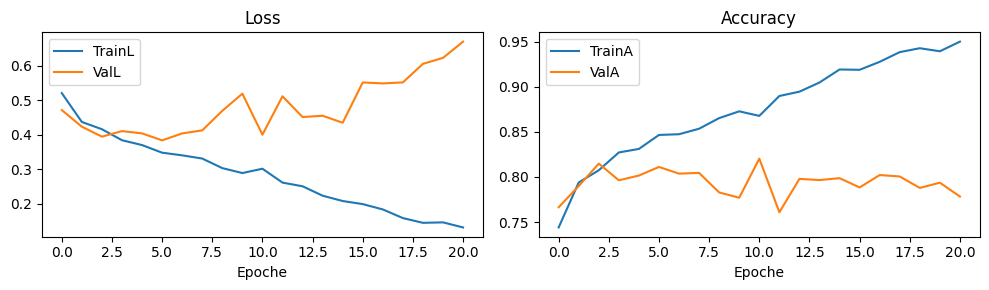


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 8, 12] | Macro 3769 | Sub 15076 | per class {'L': 1901, 'R': 1868}
[DEBUG] Runs [4, 8, 12] | Macro 949 | Sub 3796 | per class {'L': 479, 'R': 470}
Ep 01/40 | TrainL 0.5077 | TrainA 0.753 | ValL 0.4984 | ValA 0.753 | BestA 0.753 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4299 | TrainA 0.810 | ValL 0.4569 | ValA 0.773 | BestA 0.773 | ↑ patience 0/10
Ep 03/40 | TrainL 0.3988 | TrainA 0.815 | ValL 0.4280 | ValA 0.793 | BestA 0.793 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3847 | TrainA 0.829 | ValL 0.4840 | ValA 0.768 | BestA 0.793 |   patien

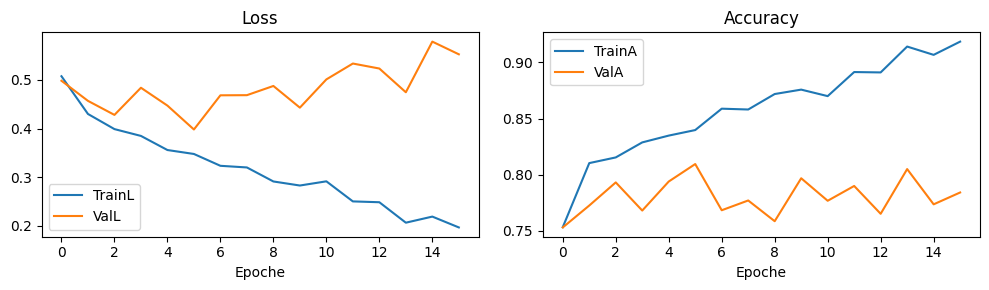


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 8, 12] | Macro 3779 | Sub 15116 | per class {'L': 1907, 'R': 1872}
[DEBUG] Runs [4, 8, 12] | Macro 939 | Sub 3756 | per class {'L': 473, 'R': 466}
Ep 01/40 | TrainL 0.5375 | TrainA 0.731 | ValL 0.3851 | ValA 0.833 | BestA 0.833 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4587 | TrainA 0.783 | ValL 0.3624 | ValA 0.835 | BestA 0.835 | ↑ patience 0/10
Ep 03/40 | TrainL 0.4222 | TrainA 0.805 | ValL 0.3416 | ValA 0.846 | BestA 0.846 | ↑ patience 0/10
Ep 04/40 | TrainL 0.4115 | TrainA 0.812 | ValL 0.3479 | ValA 0.841 | BestA 0.846 |   patien

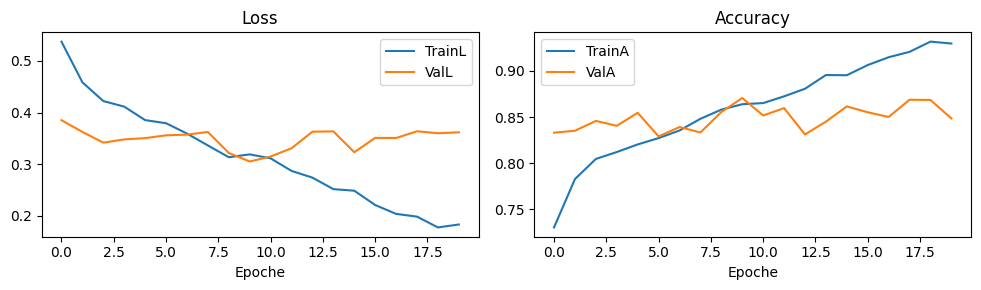


------------------------------------------------------------
exp_LR_1s_I done | Best per fold [0.810646186440678, 0.8302337938363443, 0.8203703703703704, 0.809536354056902, 0.8706070287539937]
Media 0.828 ± 0.022
------------------------------------------------------------

 exp_LR0_1s_I | LABELS=['L', 'R', '0'] | MODE=I | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 8, 12] | Macro 7566 | Sub 30264 | per class {'L': 1906, 'R': 1868, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1889 | Sub 7556 | per class {'L': 474, 'R': 470, '0': 945}
Ep 01/40 | TrainL 0.8

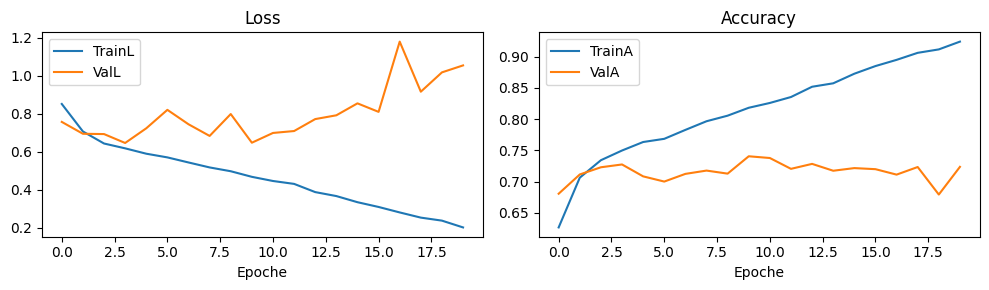


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 8, 12] | Macro 7569 | Sub 30276 | per class {'L': 1908, 'R': 1869, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1886 | Sub 7544 | per class {'L': 472, 'R': 469, '0': 945}
Ep 01/40 | TrainL 0.8233 | TrainA 0.639 | ValL 0.6851 | ValA 0.721 | BestA 0.721 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6995 | TrainA 0.707 | ValL 0.6761 | ValA 0.712 | BestA 0.721 |   patience 1/10
Ep 03/40 | TrainL 0.6449 | TrainA 0.732 | ValL 0.7969 | ValA 0.662 | BestA 0.721 |   patience 2/10
Ep 04/40 | TrainL 0.6074 | TrainA 0.754 | ValL 0.6758 | ValA 0.719 | 

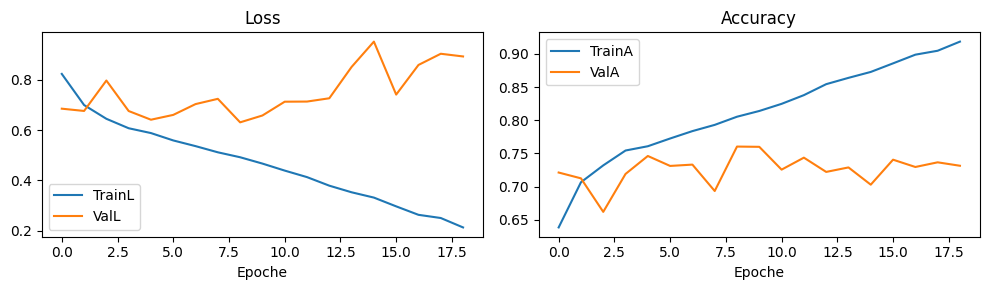


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 8, 12] | Macro 7565 | Sub 30260 | per class {'L': 1898, 'R': 1875, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1890 | Sub 7560 | per class {'L': 482, 'R': 463, '0': 945}
Ep 01/40 | TrainL 0.8324 | TrainA 0.635 | ValL 0.8175 | ValA 0.638 | BestA 0.638 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6990 | TrainA 0.712 | ValL 0.6965 | ValA 0.705 | BestA 0.705 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6488 | TrainA 0.740 | ValL 0.6802 | ValA 0.711 | BestA 0.711 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6171 | TrainA 0.747 | ValL 0.8141 | ValA 0.635 | 

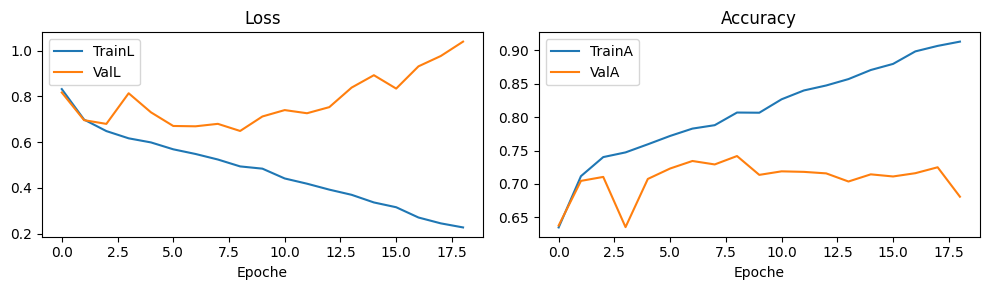


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 8, 12] | Macro 7549 | Sub 30196 | per class {'L': 1901, 'R': 1868, '0': 3780}
[DEBUG] Runs [4, 8, 12] | Macro 1906 | Sub 7624 | per class {'L': 479, 'R': 470, '0': 957}
Ep 01/40 | TrainL 0.8270 | TrainA 0.637 | ValL 0.7872 | ValA 0.667 | BestA 0.667 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6857 | TrainA 0.721 | ValL 0.7276 | ValA 0.689 | BestA 0.689 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6434 | TrainA 0.739 | ValL 0.7878 | ValA 0.689 | BestA 0.689 |   patience 1/10
Ep 04/40 | TrainL 0.6031 | TrainA 0.756 | ValL 0.8379 | ValA 0.676 | 

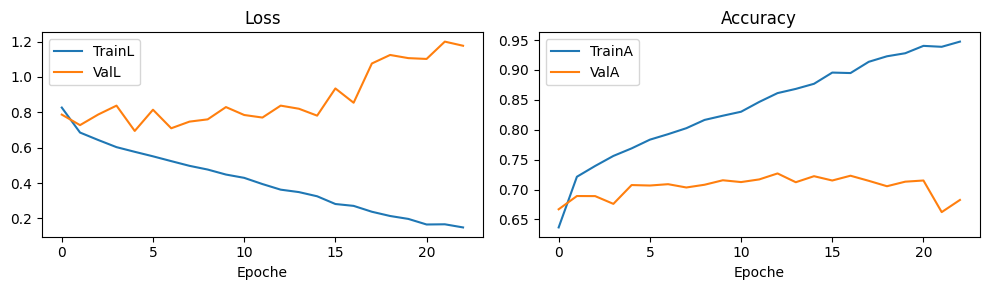


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 8, 12] | Macro 7571 | Sub 30284 | per class {'L': 1907, 'R': 1872, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1884 | Sub 7536 | per class {'L': 473, 'R': 466, '0': 945}
Ep 01/40 | TrainL 0.8564 | TrainA 0.625 | ValL 0.6703 | ValA 0.723 | BestA 0.723 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7153 | TrainA 0.705 | ValL 0.6034 | ValA 0.748 | BestA 0.748 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6723 | TrainA 0.724 | ValL 0.5792 | ValA 0.763 | BestA 0.763 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6398 | TrainA 0.738 | ValL 0.6584 | ValA 0.721 | 

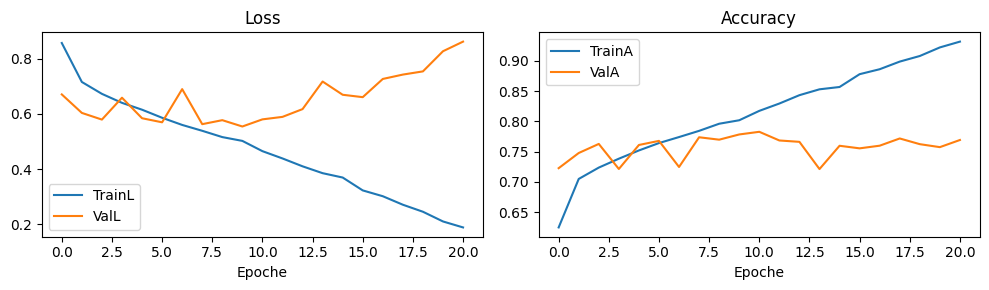


------------------------------------------------------------
exp_LR0_1s_I done | Best per fold [0.7406034939121228, 0.76033934252386, 0.7417989417989418, 0.7269150052465897, 0.7829087048832272]
Media 0.751 ± 0.019
------------------------------------------------------------

 exp_LR0F_1s_I | LABELS=['L', 'R', '0', 'F'] | MODE=I | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13243 | Sub 52972 | per class {'L': 1906, 'R': 1868, '0': 7584, 'F': 1885}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3305 | Sub 13220 | per class {'L': 474,

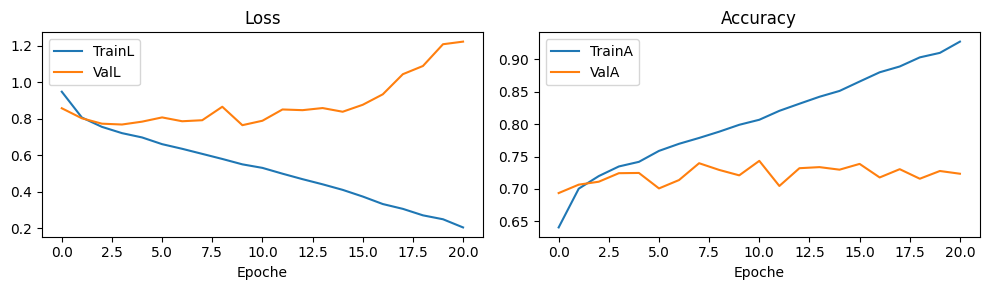


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13241 | Sub 52964 | per class {'L': 1908, 'R': 1869, '0': 7584, 'F': 1880}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3307 | Sub 13228 | per class {'L': 472, 'R': 469, '0': 1890, 'F': 476}
Ep 01/40 | TrainL 0.9456 | TrainA 0.639 | ValL 0.8359 | ValA 0.689 | BestA 0.689 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7995 | TrainA 0.705 | ValL 0.7936 | ValA 0.715 | BestA 0.715 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7464 | TrainA 0.727 | ValL 0.7312 | ValA 0.737 | BestA 0.737 | ↑ patience 0/10
Ep 04/40 | TrainL 0.716

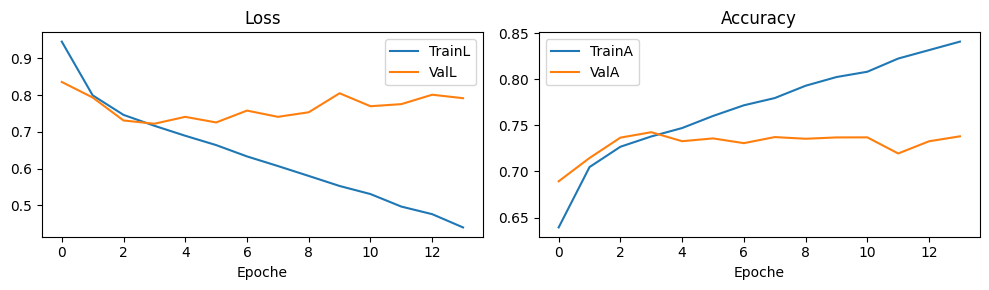


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13244 | Sub 52976 | per class {'L': 1898, 'R': 1875, '0': 7584, 'F': 1887}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3304 | Sub 13216 | per class {'L': 482, 'R': 463, '0': 1890, 'F': 469}
Ep 01/40 | TrainL 0.9489 | TrainA 0.641 | ValL 0.9246 | ValA 0.659 | BestA 0.659 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8007 | TrainA 0.709 | ValL 0.7829 | ValA 0.703 | BestA 0.703 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7448 | TrainA 0.730 | ValL 0.7722 | ValA 0.712 | BestA 0.712 | ↑ patience 0/10
Ep 04/40 | TrainL 0.713

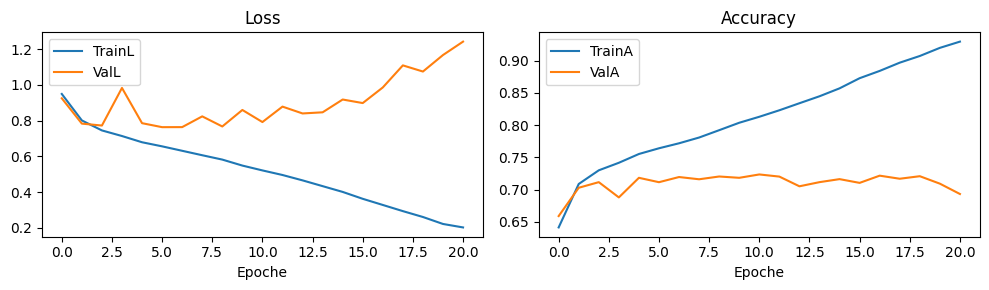


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13212 | Sub 52848 | per class {'L': 1901, 'R': 1868, '0': 7560, 'F': 1883}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3336 | Sub 13344 | per class {'L': 479, 'R': 470, '0': 1914, 'F': 473}
Ep 01/40 | TrainL 0.9142 | TrainA 0.654 | ValL 0.8876 | ValA 0.658 | BestA 0.658 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7867 | TrainA 0.708 | ValL 0.8348 | ValA 0.690 | BestA 0.690 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7440 | TrainA 0.724 | ValL 0.8974 | ValA 0.646 | BestA 0.690 |   patience 1/10
Ep 04/40 | TrainL 0.713

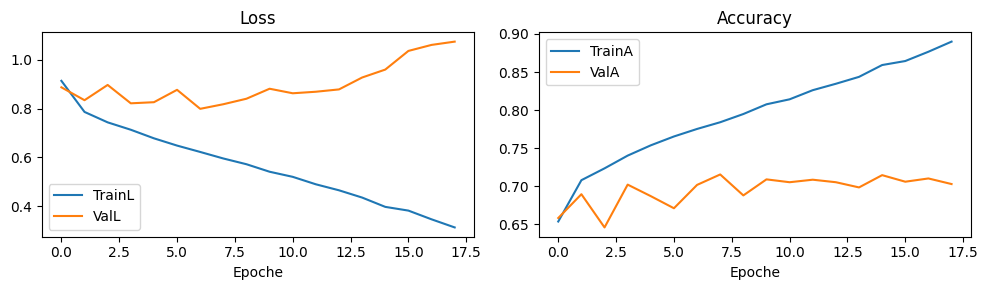


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13252 | Sub 53008 | per class {'L': 1907, 'R': 1872, '0': 7584, 'F': 1889}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3296 | Sub 13184 | per class {'L': 473, 'R': 466, '0': 1890, 'F': 467}
Ep 01/40 | TrainL 0.9399 | TrainA 0.645 | ValL 0.7439 | ValA 0.723 | BestA 0.723 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8005 | TrainA 0.706 | ValL 0.8318 | ValA 0.689 | BestA 0.723 |   patience 1/10
Ep 03/40 | TrainL 0.7641 | TrainA 0.724 | ValL 0.7038 | ValA 0.742 | BestA 0.742 | ↑ patience 0/10
Ep 04/40 | TrainL 0.731

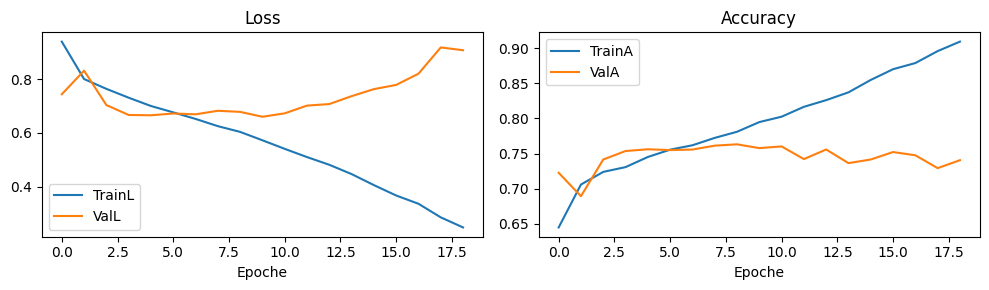


------------------------------------------------------------
exp_LR0F_1s_I done | Best per fold [0.743267776096823, 0.7425158754157847, 0.7235926150121066, 0.7155275779376499, 0.7631219660194175]
Media 0.738 ± 0.017
------------------------------------------------------------

 exp_LR0FB_1s_I | LABELS=['L', 'R', '0', 'F', 'B'] | MODE=I | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15129 | Sub 60516 | per class {'L': 1906, 'R': 1868, '0': 7584, 'F': 1885, 'B': 1886}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3777 | Sub 15108 | p

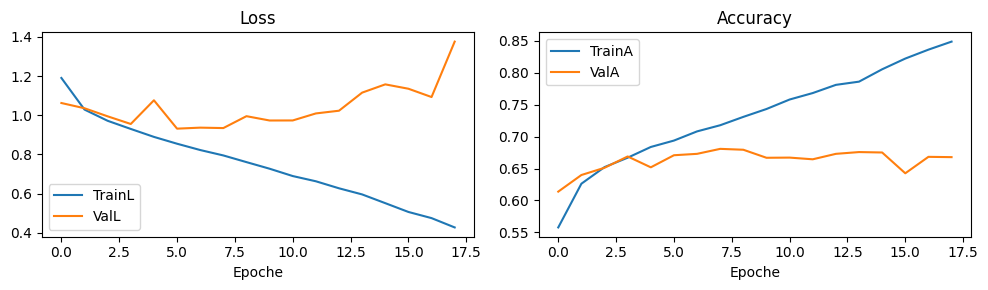


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15133 | Sub 60532 | per class {'L': 1908, 'R': 1869, '0': 7584, 'F': 1880, 'B': 1892}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3773 | Sub 15092 | per class {'L': 472, 'R': 469, '0': 1890, 'F': 476, 'B': 466}
Ep 01/40 | TrainL 1.1758 | TrainA 0.568 | ValL 1.0650 | ValA 0.608 | BestA 0.608 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0170 | TrainA 0.634 | ValL 1.0168 | ValA 0.640 | BestA 0.640 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9631 | TrainA 0.657 | ValL 0.9895 | ValA 0.633 | BestA 0.640 |   patience 1/10
Ep

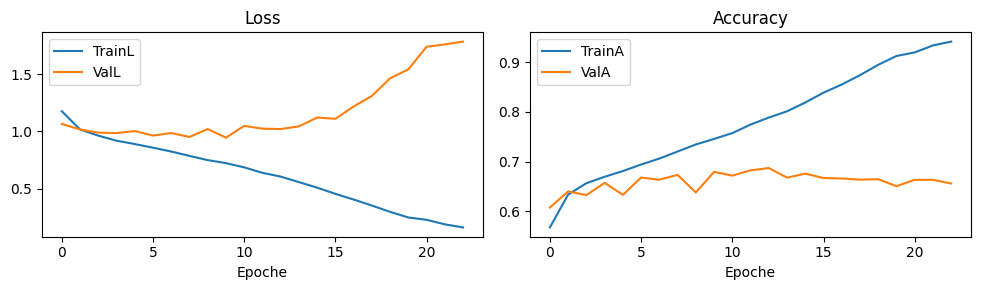


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15126 | Sub 60504 | per class {'L': 1898, 'R': 1875, '0': 7584, 'F': 1887, 'B': 1882}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3780 | Sub 15120 | per class {'L': 482, 'R': 463, '0': 1890, 'F': 469, 'B': 476}
Ep 01/40 | TrainL 1.1726 | TrainA 0.569 | ValL 1.0474 | ValA 0.618 | BestA 0.618 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0220 | TrainA 0.634 | ValL 1.0448 | ValA 0.624 | BestA 0.624 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9630 | TrainA 0.657 | ValL 1.0288 | ValA 0.630 | BestA 0.630 | ↑ patience 0/10
Ep

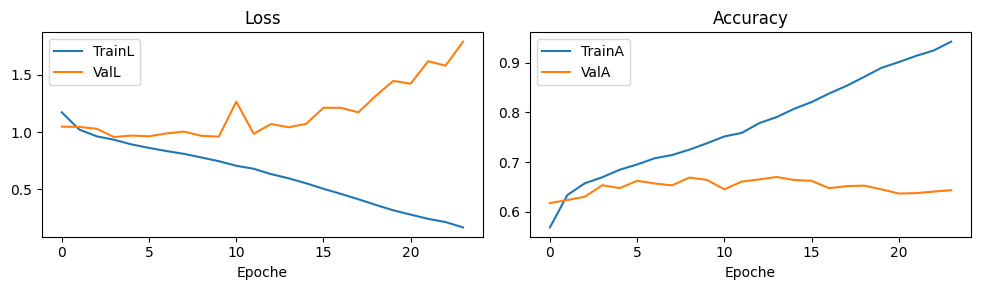


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15095 | Sub 60380 | per class {'L': 1901, 'R': 1868, '0': 7560, 'F': 1883, 'B': 1883}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3811 | Sub 15244 | per class {'L': 479, 'R': 470, '0': 1914, 'F': 473, 'B': 475}
Ep 01/40 | TrainL 1.1549 | TrainA 0.574 | ValL 1.1297 | ValA 0.596 | BestA 0.596 | ↑ patience 0/10
Ep 02/40 | TrainL 0.9955 | TrainA 0.643 | ValL 1.0700 | ValA 0.622 | BestA 0.622 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9408 | TrainA 0.664 | ValL 1.1174 | ValA 0.609 | BestA 0.622 |   patience 1/10
Ep

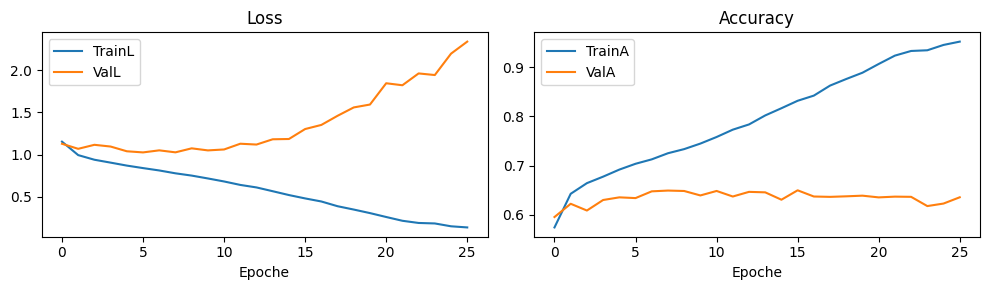


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 15141 | Sub 60564 | per class {'L': 1907, 'R': 1872, '0': 7584, 'F': 1889, 'B': 1889}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3765 | Sub 15060 | per class {'L': 473, 'R': 466, '0': 1890, 'F': 467, 'B': 469}
Ep 01/40 | TrainL 1.1949 | TrainA 0.561 | ValL 1.0621 | ValA 0.603 | BestA 0.603 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0450 | TrainA 0.624 | ValL 1.0310 | ValA 0.634 | BestA 0.634 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9891 | TrainA 0.647 | ValL 0.9497 | ValA 0.650 | BestA 0.650 | ↑ patience 0/10
Ep

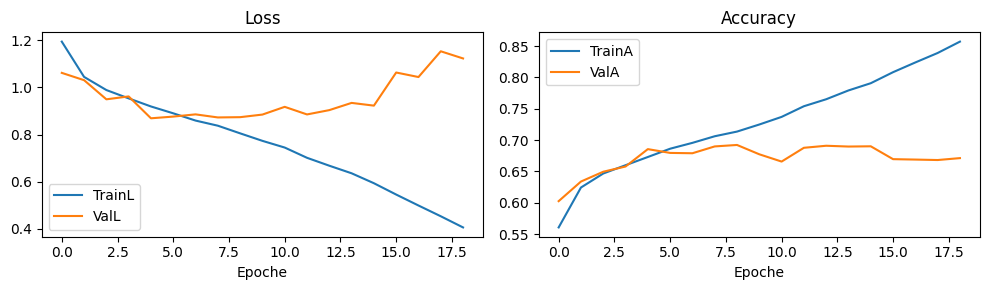


------------------------------------------------------------
exp_LR0FB_1s_I done | Best per fold [0.6808313476303945, 0.6870527431751922, 0.6703042328042328, 0.649829441091577, 0.6922310756972112]
Media 0.676 ± 0.015
------------------------------------------------------------

 exp_BF_1s_I | LABELS=['B', 'F'] | MODE=I | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [6, 10, 14] | Macro 3771 | Sub 15084 | per class {'B': 1886, 'F': 1885}
[DEBUG] Runs [6, 10, 14] | Macro 943 | Sub 3772 | per class {'B': 472, 'F': 471}
Ep 01/40 | TrainL 0.6836 | TrainA 0.601 | V

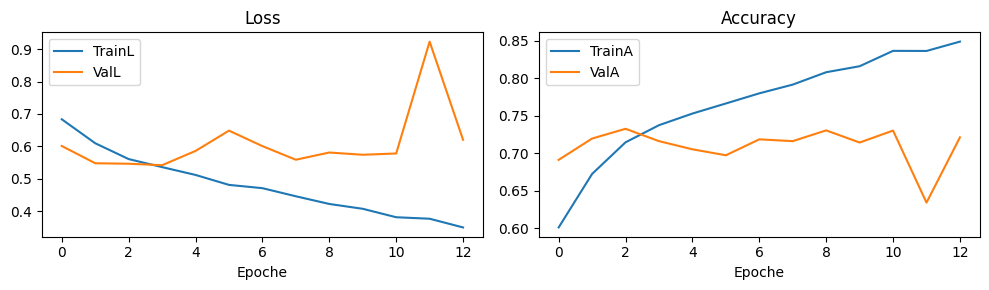


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [6, 10, 14] | Macro 3772 | Sub 15088 | per class {'B': 1892, 'F': 1880}
[DEBUG] Runs [6, 10, 14] | Macro 942 | Sub 3768 | per class {'B': 466, 'F': 476}
Ep 01/40 | TrainL 0.6721 | TrainA 0.616 | ValL 0.5682 | ValA 0.712 | BestA 0.712 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6078 | TrainA 0.677 | ValL 0.5372 | ValA 0.724 | BestA 0.724 | ↑ patience 0/10
Ep 03/40 | TrainL 0.5694 | TrainA 0.705 | ValL 0.5696 | ValA 0.713 | BestA 0.724 |   patience 1/10
Ep 04/40 | TrainL 0.5347 | TrainA 0.732 | ValL 0.5441 | ValA 0.723 | BestA 0.724 |   pati

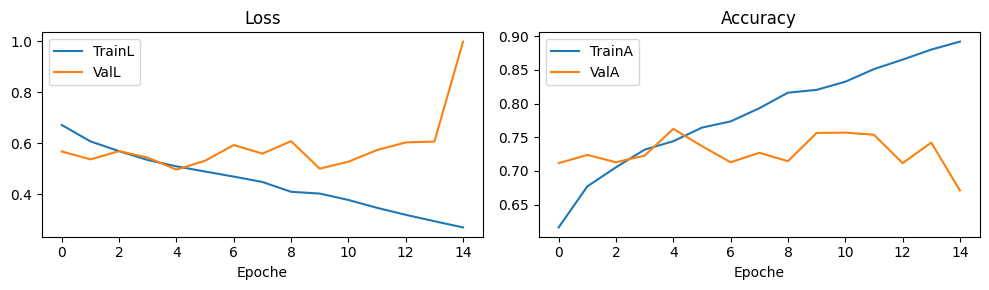


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [6, 10, 14] | Macro 3769 | Sub 15076 | per class {'B': 1882, 'F': 1887}
[DEBUG] Runs [6, 10, 14] | Macro 945 | Sub 3780 | per class {'B': 476, 'F': 469}
Ep 01/40 | TrainL 0.6686 | TrainA 0.622 | ValL 0.6282 | ValA 0.652 | BestA 0.652 | ↑ patience 0/10
Ep 02/40 | TrainL 0.5951 | TrainA 0.685 | ValL 0.6302 | ValA 0.652 | BestA 0.652 |   patience 1/10
Ep 03/40 | TrainL 0.5593 | TrainA 0.712 | ValL 0.5950 | ValA 0.682 | BestA 0.682 | ↑ patience 0/10
Ep 04/40 | TrainL 0.5257 | TrainA 0.738 | ValL 0.5450 | ValA 0.729 | BestA 0.729 | ↑ pati

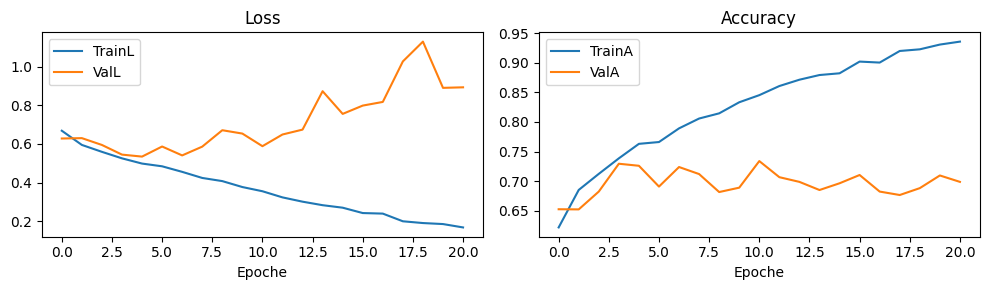


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [6, 10, 14] | Macro 3766 | Sub 15064 | per class {'B': 1883, 'F': 1883}
[DEBUG] Runs [6, 10, 14] | Macro 948 | Sub 3792 | per class {'B': 475, 'F': 473}
Ep 01/40 | TrainL 0.6608 | TrainA 0.629 | ValL 0.6948 | ValA 0.643 | BestA 0.643 | ↑ patience 0/10
Ep 02/40 | TrainL 0.5905 | TrainA 0.692 | ValL 0.6207 | ValA 0.657 | BestA 0.657 | ↑ patience 0/10
Ep 03/40 | TrainL 0.5436 | TrainA 0.727 | ValL 0.6482 | ValA 0.650 | BestA 0.657 |   patience 1/10
Ep 04/40 | TrainL 0.5195 | TrainA 0.747 | ValL 0.7261 | ValA 0.623 | BestA 0.657 |   pati

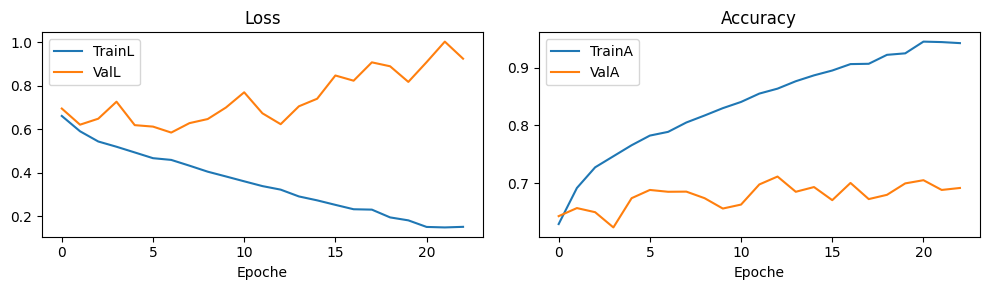


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [6, 10, 14] | Macro 3778 | Sub 15112 | per class {'B': 1889, 'F': 1889}
[DEBUG] Runs [6, 10, 14] | Macro 936 | Sub 3744 | per class {'B': 469, 'F': 467}
Ep 01/40 | TrainL 0.6840 | TrainA 0.596 | ValL 0.6053 | ValA 0.689 | BestA 0.689 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6123 | TrainA 0.671 | ValL 0.6627 | ValA 0.661 | BestA 0.689 |   patience 1/10
Ep 03/40 | TrainL 0.5697 | TrainA 0.706 | ValL 0.5587 | ValA 0.725 | BestA 0.725 | ↑ patience 0/10
Ep 04/40 | TrainL 0.5505 | TrainA 0.721 | ValL 0.5278 | ValA 0.736 | BestA 0.736 | ↑ pati

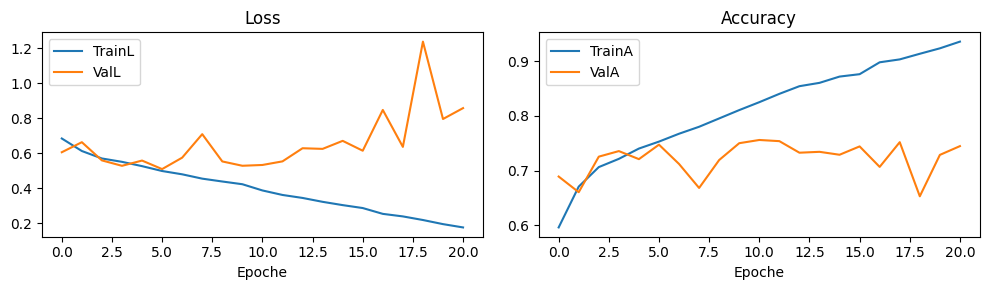


------------------------------------------------------------
exp_BF_1s_I done | Best per fold [0.7325026511134677, 0.7624734607218684, 0.7338624338624339, 0.7114978902953587, 0.7558760683760684]
Media 0.739 ± 0.018
------------------------------------------------------------

 exp_BF0_1s_I | LABELS=['B', 'F', '0'] | MODE=I | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [6, 10, 14] | Macro 7563 | Sub 30252 | per class {'B': 1886, 'F': 1885, '0': 3792}
[DEBUG] Runs [6, 10, 14] | Macro 1888 | Sub 7552 | per class {'B': 472, 'F': 471, '0': 945}
Ep 01/40 | TrainL

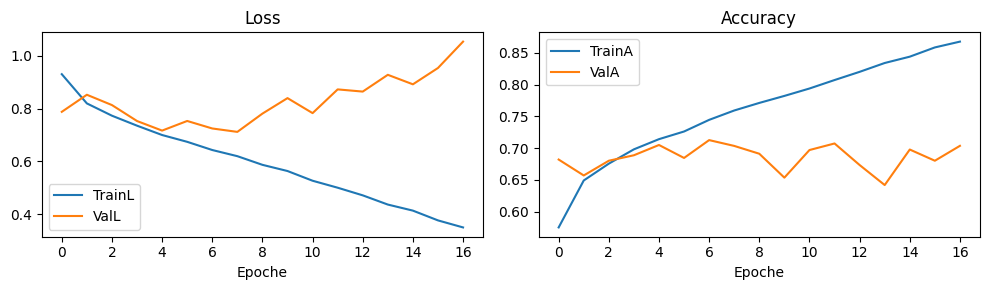


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [6, 10, 14] | Macro 7564 | Sub 30256 | per class {'B': 1892, 'F': 1880, '0': 3792}
[DEBUG] Runs [6, 10, 14] | Macro 1887 | Sub 7548 | per class {'B': 466, 'F': 476, '0': 945}
Ep 01/40 | TrainL 0.9270 | TrainA 0.584 | ValL 0.8499 | ValA 0.624 | BestA 0.624 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8155 | TrainA 0.649 | ValL 0.7768 | ValA 0.665 | BestA 0.665 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7699 | TrainA 0.676 | ValL 0.7434 | ValA 0.691 | BestA 0.691 | ↑ patience 0/10
Ep 04/40 | TrainL 0.7321 | TrainA 0.699 | ValL 0.8795 | ValA 0.661 

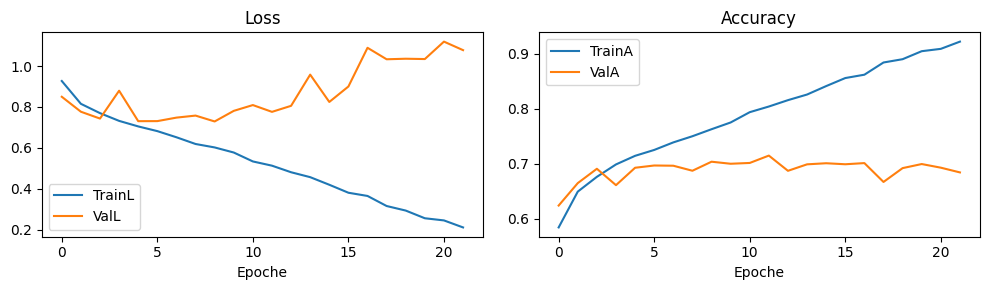


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [6, 10, 14] | Macro 7561 | Sub 30244 | per class {'B': 1882, 'F': 1887, '0': 3792}
[DEBUG] Runs [6, 10, 14] | Macro 1890 | Sub 7560 | per class {'B': 476, 'F': 469, '0': 945}
Ep 01/40 | TrainL 0.9313 | TrainA 0.575 | ValL 1.0654 | ValA 0.573 | BestA 0.573 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8120 | TrainA 0.653 | ValL 0.8017 | ValA 0.656 | BestA 0.656 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7649 | TrainA 0.683 | ValL 0.9164 | ValA 0.633 | BestA 0.656 |   patience 1/10
Ep 04/40 | TrainL 0.7301 | TrainA 0.701 | ValL 0.7833 | ValA 0.674 

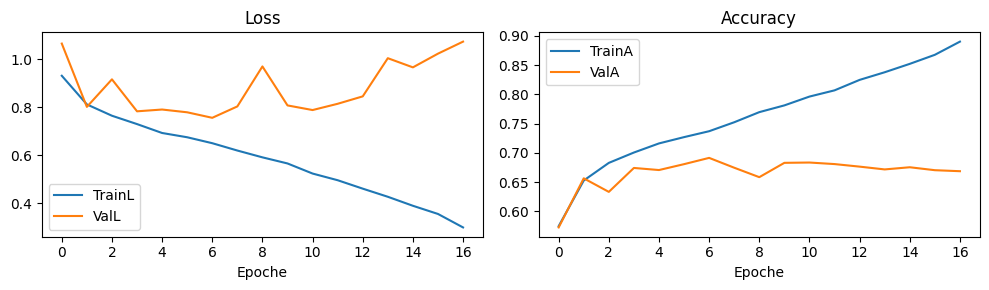


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [6, 10, 14] | Macro 7546 | Sub 30184 | per class {'B': 1883, 'F': 1883, '0': 3780}
[DEBUG] Runs [6, 10, 14] | Macro 1905 | Sub 7620 | per class {'B': 475, 'F': 473, '0': 957}
Ep 01/40 | TrainL 0.9144 | TrainA 0.589 | ValL 1.0578 | ValA 0.541 | BestA 0.541 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7941 | TrainA 0.668 | ValL 0.9727 | ValA 0.616 | BestA 0.616 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7468 | TrainA 0.693 | ValL 0.8737 | ValA 0.609 | BestA 0.616 |   patience 1/10
Ep 04/40 | TrainL 0.7129 | TrainA 0.706 | ValL 0.8317 | ValA 0.646 

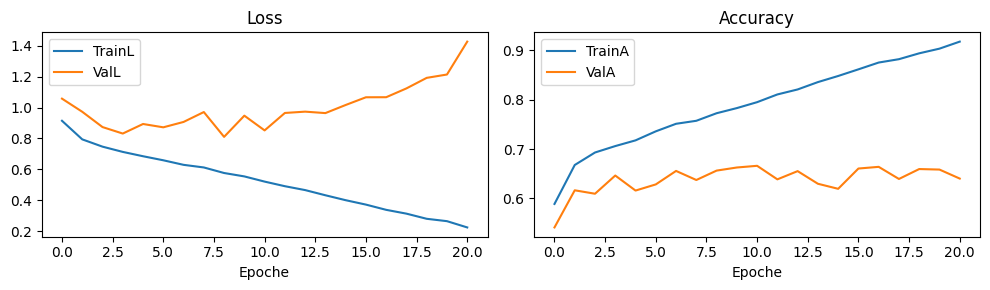


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [6, 10, 14] | Macro 7570 | Sub 30280 | per class {'B': 1889, 'F': 1889, '0': 3792}
[DEBUG] Runs [6, 10, 14] | Macro 1881 | Sub 7524 | per class {'B': 469, 'F': 467, '0': 945}
Ep 01/40 | TrainL 0.9377 | TrainA 0.575 | ValL 0.8326 | ValA 0.627 | BestA 0.627 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8240 | TrainA 0.651 | ValL 0.7718 | ValA 0.673 | BestA 0.673 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7668 | TrainA 0.681 | ValL 0.7240 | ValA 0.702 | BestA 0.702 | ↑ patience 0/10
Ep 04/40 | TrainL 0.7440 | TrainA 0.690 | ValL 0.7303 | ValA 0.691 

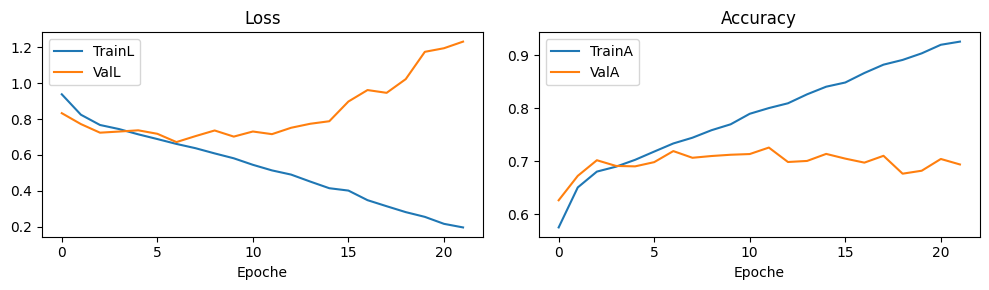


------------------------------------------------------------
exp_BF0_1s_I done | Best per fold [0.7126588983050848, 0.7150238473767886, 0.6914021164021164, 0.666010498687664, 0.7260765550239234]
Media 0.702 ± 0.021
------------------------------------------------------------

 exp_LR_1s_B | LABELS=['L', 'R'] | MODE=B | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]


[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 7542 | Sub 30168 | per class {'L': 3787, 'R': 3755}
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 1883 | Sub 7532 | per class {'L': 948, 'R': 935}
Ep 01/40 | TrainL 0.4915 | TrainA 0.756 | ValL 0.5390 | ValA 0.742 | BestA 0.742 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4256 | TrainA 0.800 | ValL 0.4080 | ValA 0.804 | BestA 0.804 | ↑ patience 0/10
Ep 03/40 | TrainL 0.3944 | TrainA 0.816 | ValL 0.4241 | ValA 0.802 | BestA 0.804 |   patience 1/10
Ep 04/40 | TrainL 0.3751 | TrainA 0.830 | ValL 0.3919 | ValA 0.816 | BestA 0.816 | ↑ patience 0/10
Ep 05/40 | TrainL 0.3555 | TrainA 0.837 | ValL 0.4034 | ValA 0.808 | BestA 0.816 |   patience 1/10
Ep 06/40 | TrainL 0.3399 | TrainA 0.846 | ValL 0.4270 | ValA 0.804 | BestA 0.816 |   patience 2/10
Ep 07/40 | TrainL 0.3374 | TrainA 0.851 | ValL 0.3996 | ValA 0.813 | BestA 0.816 |   patience 3/10
Ep 08/40 | TrainL 0.3118 | TrainA 0.860 | ValL 0.5933 | ValA 0.772 | BestA 0.816 |   patience 4/10
Ep 09/40 | TrainL 0.306

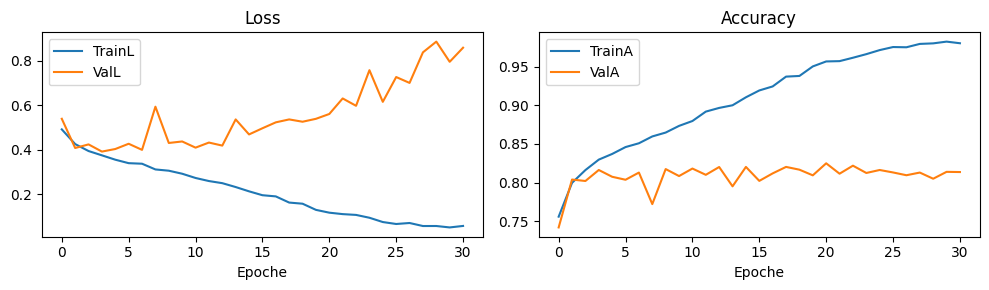


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 7545 | Sub 30180 | per class {'L': 3799, 'R': 3746}
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 1880 | Sub 7520 | per class {'L': 936, 'R': 944}
Ep 01/40 | TrainL 0.4959 | TrainA 0.757 | ValL 0.4855 | ValA 0.787 | BestA 0.787 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4220 | TrainA 0.797 | ValL 0.4776 | ValA 0.773 | BestA 0.787 |   patience 1/10
Ep 03/40 | TrainL 0.3819 | TrainA 0.821 | ValL 0.4236 | ValA 0.801 | BestA 0.801 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3651 | TrainA 0.832 | ValL 0.3811 | ValA 0.824 | B

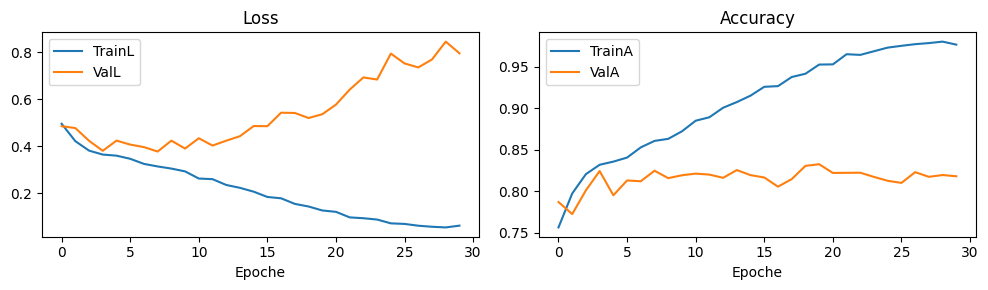


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 7535 | Sub 30140 | per class {'L': 3779, 'R': 3756}
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 1890 | Sub 7560 | per class {'L': 956, 'R': 934}
Ep 01/40 | TrainL 0.4936 | TrainA 0.760 | ValL 0.4492 | ValA 0.783 | BestA 0.783 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4256 | TrainA 0.801 | ValL 0.3936 | ValA 0.815 | BestA 0.815 | ↑ patience 0/10
Ep 03/40 | TrainL 0.4031 | TrainA 0.812 | ValL 0.3964 | ValA 0.816 | BestA 0.816 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3867 | TrainA 0.827 | ValL 0.3833 | ValA 0.825 | B

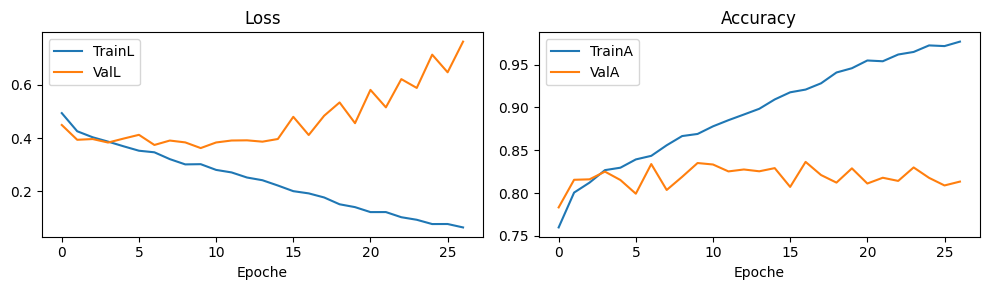


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 7528 | Sub 30112 | per class {'L': 3781, 'R': 3747}
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 1897 | Sub 7588 | per class {'L': 954, 'R': 943}
Ep 01/40 | TrainL 0.4905 | TrainA 0.757 | ValL 0.4477 | ValA 0.789 | BestA 0.789 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4203 | TrainA 0.801 | ValL 0.4371 | ValA 0.779 | BestA 0.789 |   patience 1/10
Ep 03/40 | TrainL 0.3936 | TrainA 0.817 | ValL 0.4012 | ValA 0.816 | BestA 0.816 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3681 | TrainA 0.826 | ValL 0.4177 | ValA 0.798 | B

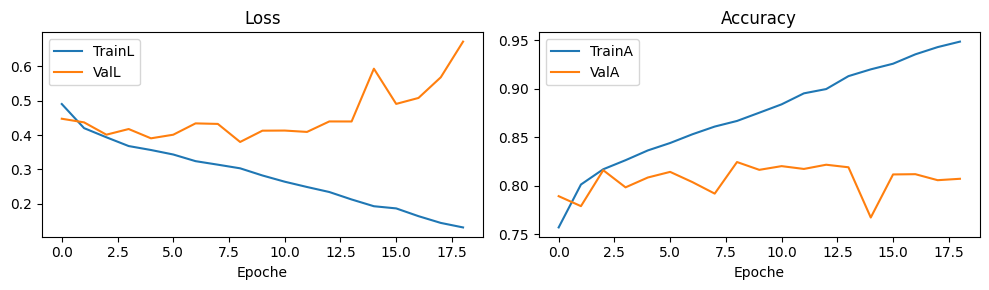


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 7550 | Sub 30200 | per class {'L': 3794, 'R': 3756}
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 1875 | Sub 7500 | per class {'L': 941, 'R': 934}
Ep 01/40 | TrainL 0.5095 | TrainA 0.748 | ValL 0.4589 | ValA 0.763 | BestA 0.763 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4390 | TrainA 0.791 | ValL 0.3647 | ValA 0.827 | BestA 0.827 | ↑ patience 0/10
Ep 03/40 | TrainL 0.4128 | TrainA 0.804 | ValL 0.3958 | ValA 0.826 | BestA 0.827 |   patience 1/10
Ep 04/40 | TrainL 0.3963 | TrainA 0.814 | ValL 0.3813 | ValA 0.814 | B

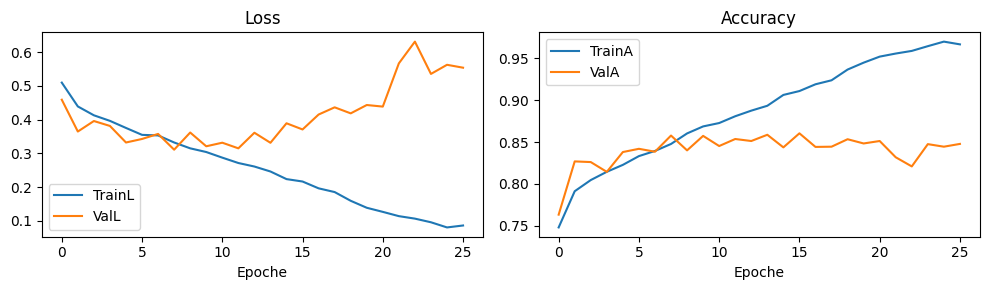


------------------------------------------------------------
exp_LR_1s_B done | Best per fold [0.8250132766861391, 0.8325797872340426, 0.8363756613756613, 0.8241960991038482, 0.8604]
Media 0.836 ± 0.013
------------------------------------------------------------

 exp_LR0_1s_B | LABELS=['L', 'R', '0'] | MODE=B | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 15126 | Sub 60504 | per class {'L': 3787, 'R': 3755, '0': 7584}
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 3773 | Sub 15092 | per class {'L': 948, 'R': 935, '0': 1890}
Ep 01/40

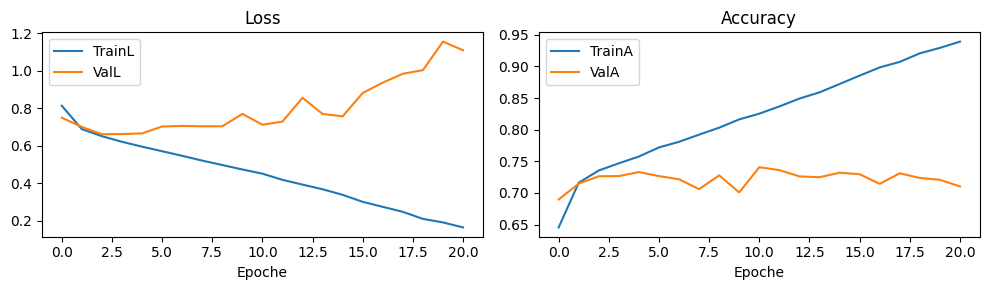


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 15129 | Sub 60516 | per class {'L': 3799, 'R': 3746, '0': 7584}
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 3770 | Sub 15080 | per class {'L': 936, 'R': 944, '0': 1890}
Ep 01/40 | TrainL 0.8039 | TrainA 0.651 | ValL 0.7439 | ValA 0.690 | BestA 0.690 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6941 | TrainA 0.714 | ValL 0.6915 | ValA 0.710 | BestA 0.710 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6577 | TrainA 0.729 | ValL 0.6853 | ValA 0.720 | BestA 0.720 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6281 | TrainA 0.746 | ValL

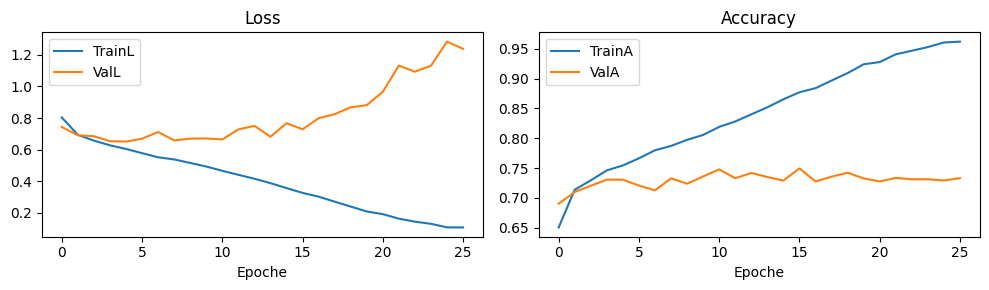


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 15119 | Sub 60476 | per class {'L': 3779, 'R': 3756, '0': 7584}
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 3780 | Sub 15120 | per class {'L': 956, 'R': 934, '0': 1890}
Ep 01/40 | TrainL 0.8040 | TrainA 0.656 | ValL 0.7439 | ValA 0.673 | BestA 0.673 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6925 | TrainA 0.717 | ValL 0.7368 | ValA 0.691 | BestA 0.691 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6573 | TrainA 0.731 | ValL 0.7001 | ValA 0.705 | BestA 0.705 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6260 | TrainA 0.747 | ValL

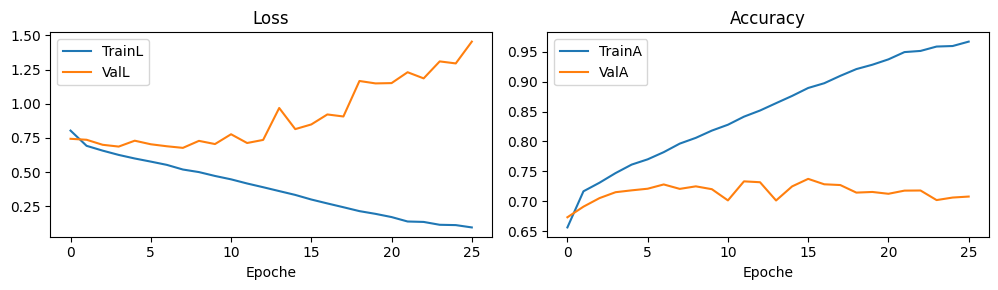


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 15088 | Sub 60352 | per class {'L': 3781, 'R': 3747, '0': 7560}
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 3811 | Sub 15244 | per class {'L': 954, 'R': 943, '0': 1914}
Ep 01/40 | TrainL 0.8002 | TrainA 0.654 | ValL 0.7458 | ValA 0.681 | BestA 0.681 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6828 | TrainA 0.718 | ValL 0.7288 | ValA 0.708 | BestA 0.708 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6466 | TrainA 0.734 | ValL 0.6845 | ValA 0.721 | BestA 0.721 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6113 | TrainA 0.749 | ValL

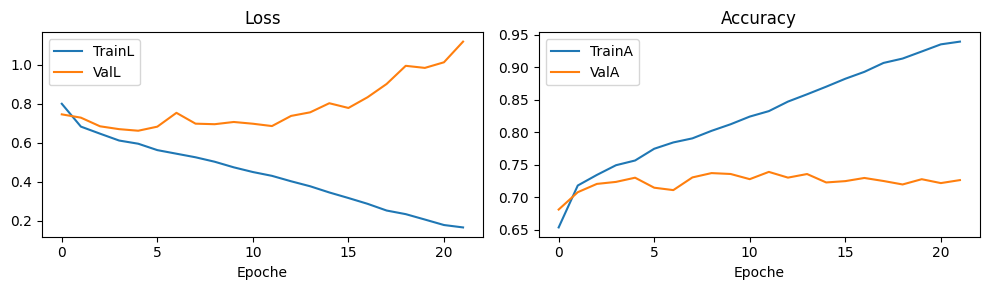


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 15134 | Sub 60536 | per class {'L': 3794, 'R': 3756, '0': 7584}
[DEBUG] Runs [3, 4, 7, 8, 11, 12] | Macro 3765 | Sub 15060 | per class {'L': 941, 'R': 934, '0': 1890}
Ep 01/40 | TrainL 0.8260 | TrainA 0.641 | ValL 0.6815 | ValA 0.720 | BestA 0.720 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7137 | TrainA 0.704 | ValL 0.6785 | ValA 0.726 | BestA 0.726 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6786 | TrainA 0.724 | ValL 0.5992 | ValA 0.751 | BestA 0.751 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6496 | TrainA 0.737 | ValL

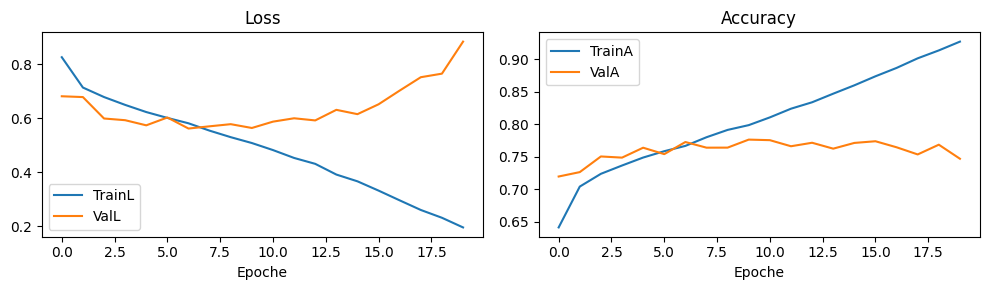


------------------------------------------------------------
exp_LR0_1s_B done | Best per fold [0.7407235621521335, 0.7496021220159151, 0.7375661375661375, 0.739110469692994, 0.7765604249667994]
Media 0.749 ± 0.015
------------------------------------------------------------

 exp_LR0F_1s_B | LABELS=['L', 'R', '0', 'F'] | MODE=B | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]


[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 26469 | Sub 105876 | per class {'L': 3787, 'R': 3755, '0': 15157, 'F': 3770}


[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 6606 | Sub 26424 | per class {'L': 948, 'R': 935, '0': 3780, 'F': 943}
Ep 01/40 | TrainL 0.8961 | TrainA 0.666 | ValL 0.9578 | ValA 0.675 | BestA 0.675 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7762 | TrainA 0.716 | ValL 0.7696 | ValA 0.711 | BestA 0.711 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7269 | TrainA 0.737 | ValL 0.7709 | ValA 0.728 | BestA 0.728 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6901 | TrainA 0.749 | ValL 0.7427 | ValA 0.729 | BestA 0.729 | ↑ patience 0/10
Ep 05/40 | TrainL 0.6616 | TrainA 0.761 | ValL 0.7840 | ValA 0.734 | BestA 0.734 | ↑ patience 0/10
Ep 06/40 | TrainL 0.6313 | TrainA 0.774 | ValL 0.7026 | ValA 0.750 | BestA 0.750 | ↑ patience 0/10
Ep 07/40 | TrainL 0.6093 | TrainA 0.783 | ValL 0.7271 | ValA 0.743 | BestA 0.750 |   patience 1/10
Ep 08/40 | TrainL 0.5846 | TrainA 0.790 | ValL 0.7223 | ValA 0.740 | BestA 0.750 |   patience 2/10
Ep 09/40 | TrainL 0.5503 | TrainA 0.804 | ValL 0.7395 | ValA 0.731 | BestA

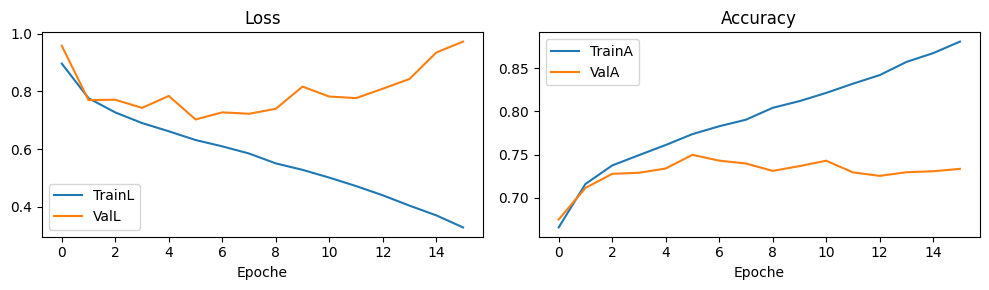


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 26472 | Sub 105888 | per class {'L': 3799, 'R': 3746, '0': 15157, 'F': 3770}
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 6603 | Sub 26412 | per class {'L': 936, 'R': 944, '0': 3780, 'F': 943}
Ep 01/40 | TrainL 0.9027 | TrainA 0.660 | ValL 0.8558 | ValA 0.687 | BestA 0.687 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7807 | TrainA 0.713 | ValL 0.7544 | ValA 0.732 | BestA 0.732 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7372 | TrainA 0.729 | ValL 0.7696 | ValA 0.730 | BestA 0.732

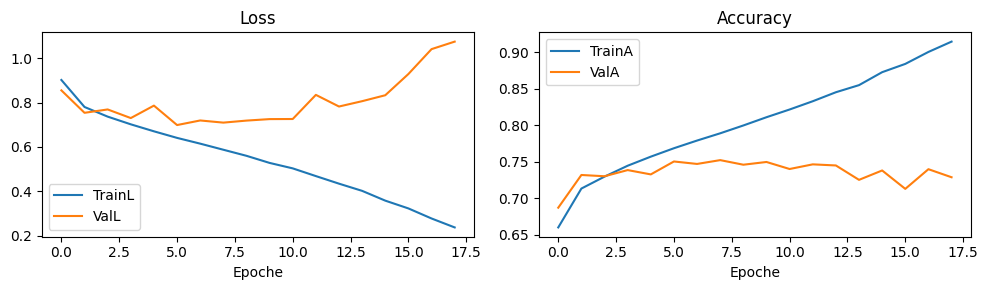


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 26458 | Sub 105832 | per class {'L': 3779, 'R': 3756, '0': 15157, 'F': 3766}
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 6617 | Sub 26468 | per class {'L': 956, 'R': 934, '0': 3780, 'F': 947}
Ep 01/40 | TrainL 0.8918 | TrainA 0.667 | ValL 0.8115 | ValA 0.690 | BestA 0.690 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7695 | TrainA 0.720 | ValL 0.7837 | ValA 0.712 | BestA 0.712 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7271 | TrainA 0.737 | ValL 0.8309 | ValA 0.701 | BestA 0.712

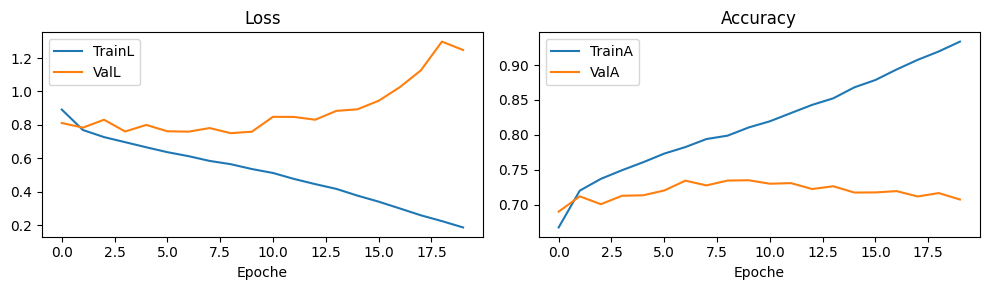


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 26403 | Sub 105612 | per class {'L': 3781, 'R': 3747, '0': 15109, 'F': 3766}
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 6672 | Sub 26688 | per class {'L': 954, 'R': 943, '0': 3828, 'F': 947}
Ep 01/40 | TrainL 0.8871 | TrainA 0.671 | ValL 0.8449 | ValA 0.685 | BestA 0.685 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7705 | TrainA 0.718 | ValL 0.8037 | ValA 0.707 | BestA 0.707 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7258 | TrainA 0.739 | ValL 0.8006 | ValA 0.709 | BestA 0.709

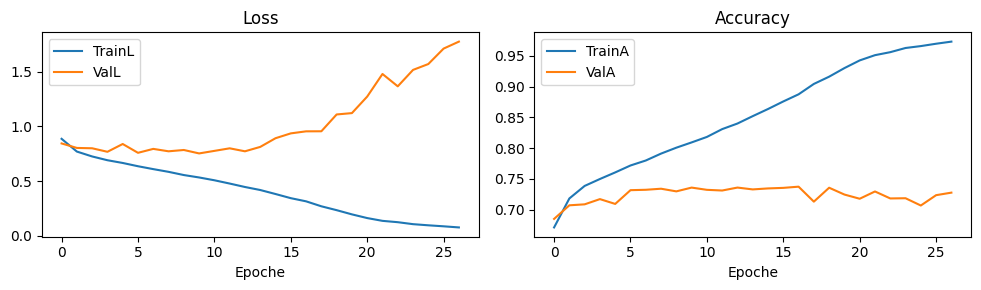


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 26498 | Sub 105992 | per class {'L': 3794, 'R': 3756, '0': 15168, 'F': 3780}
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 6577 | Sub 26308 | per class {'L': 941, 'R': 934, '0': 3769, 'F': 933}
Ep 01/40 | TrainL 0.9200 | TrainA 0.654 | ValL 0.8195 | ValA 0.711 | BestA 0.711 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7900 | TrainA 0.714 | ValL 0.7148 | ValA 0.741 | BestA 0.741 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7447 | TrainA 0.729 | ValL 0.7309 | ValA 0.729 | BestA 0.741

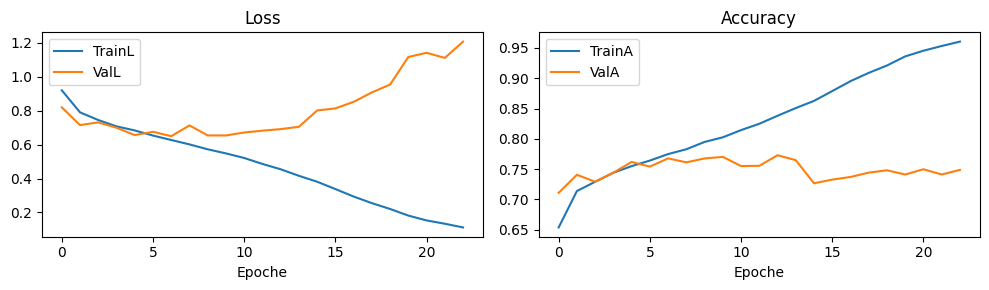


------------------------------------------------------------
exp_LR0F_1s_B done | Best per fold [0.7496594005449592, 0.752044525215811, 0.7348874112135408, 0.7373351318944844, 0.7729207845522275]
Media 0.749 ± 0.014
------------------------------------------------------------

 exp_LR0FB_1s_B | LABELS=['L', 'R', '0', 'F', 'B'] | MODE=B | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 30227 | Sub 120908 | per class {'L': 3787, 'R': 3755, '0': 15157, 'F': 3770, 'B': 3758}
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11

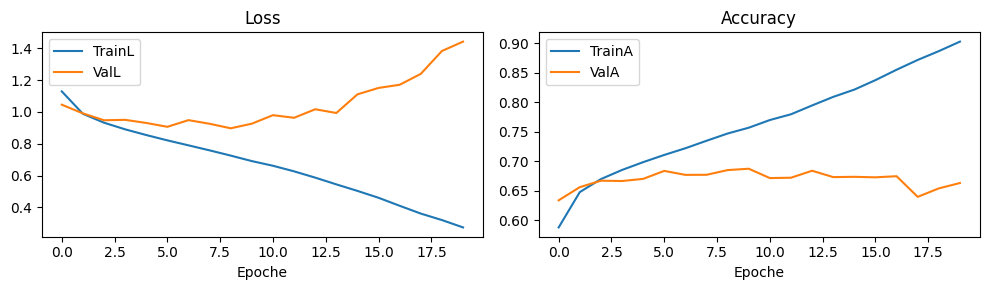


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 30231 | Sub 120924 | per class {'L': 3799, 'R': 3746, '0': 15157, 'F': 3770, 'B': 3759}
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 7541 | Sub 30164 | per class {'L': 936, 'R': 944, '0': 3780, 'F': 943, 'B': 938}
Ep 01/40 | TrainL 1.1260 | TrainA 0.588 | ValL 1.0037 | ValA 0.642 | BestA 0.642 | ↑ patience 0/10
Ep 02/40 | TrainL 0.9934 | TrainA 0.644 | ValL 1.0077 | ValA 0.639 | BestA 0.642 |   patience 1/10
Ep 03/40 | TrainL 0.9354 | TrainA 0.666 | ValL 0.9822 | Val

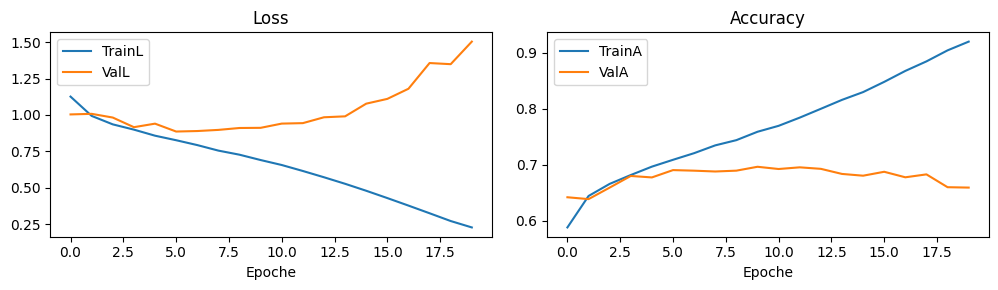


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 30212 | Sub 120848 | per class {'L': 3779, 'R': 3756, '0': 15157, 'F': 3766, 'B': 3754}
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 7560 | Sub 30240 | per class {'L': 956, 'R': 934, '0': 3780, 'F': 947, 'B': 943}
Ep 01/40 | TrainL 1.1261 | TrainA 0.590 | ValL 1.0827 | ValA 0.609 | BestA 0.609 | ↑ patience 0/10
Ep 02/40 | TrainL 0.9887 | TrainA 0.651 | ValL 1.0918 | ValA 0.629 | BestA 0.629 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9317 | TrainA 0.671 | ValL 1.0169 | Val

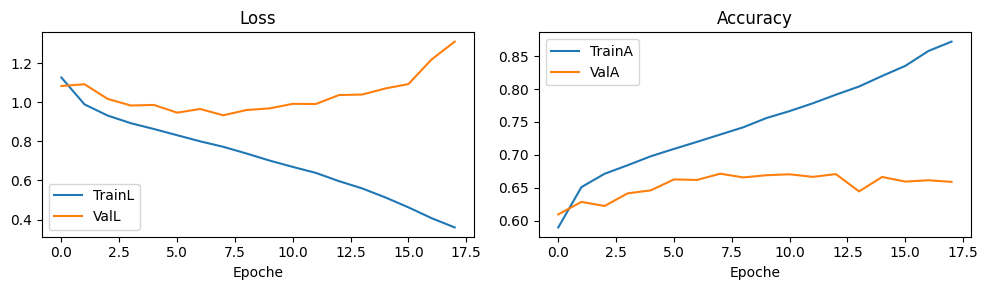


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 30151 | Sub 120604 | per class {'L': 3781, 'R': 3747, '0': 15109, 'F': 3766, 'B': 3748}
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 7621 | Sub 30484 | per class {'L': 954, 'R': 943, '0': 3828, 'F': 947, 'B': 949}
Ep 01/40 | TrainL 1.1138 | TrainA 0.596 | ValL 1.1174 | ValA 0.590 | BestA 0.590 | ↑ patience 0/10
Ep 02/40 | TrainL 0.9773 | TrainA 0.652 | ValL 1.0449 | ValA 0.627 | BestA 0.627 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9266 | TrainA 0.671 | ValL 1.0500 | Val

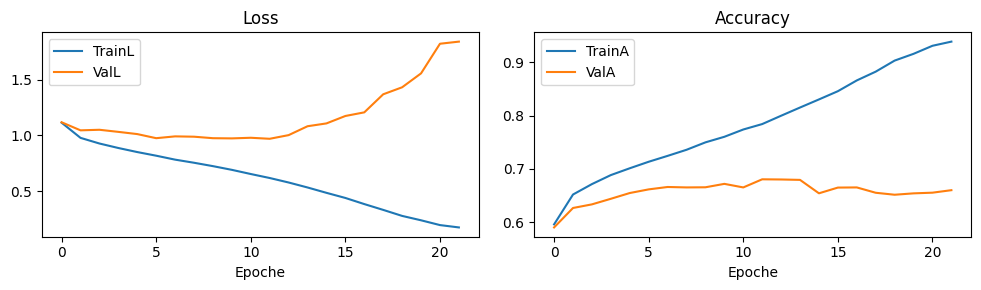


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 30267 | Sub 121068 | per class {'L': 3794, 'R': 3756, '0': 15168, 'F': 3780, 'B': 3769}
[DEBUG] Runs [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] | Macro 7505 | Sub 30020 | per class {'L': 941, 'R': 934, '0': 3769, 'F': 933, 'B': 928}
Ep 01/40 | TrainL 1.1458 | TrainA 0.583 | ValL 0.9602 | ValA 0.646 | BestA 0.646 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0070 | TrainA 0.643 | ValL 0.8942 | ValA 0.681 | BestA 0.681 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9574 | TrainA 0.662 | ValL 0.8750 | Val

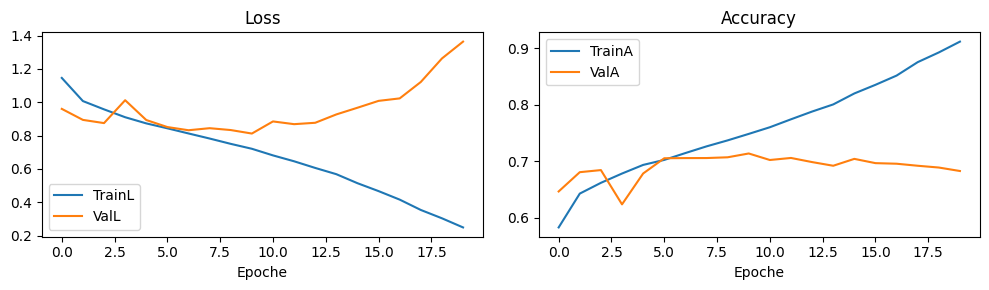


------------------------------------------------------------
exp_LR0FB_1s_B done | Best per fold [0.6872432074221339, 0.6963930513194536, 0.6713624338624339, 0.6804225167300879, 0.7137574950033311]
Media 0.690 ± 0.015
------------------------------------------------------------

 exp_LR_1s_R | LABELS=['L', 'R'] | MODE=R | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [3, 7, 11] | Macro 3768 | Sub 15072 | per class {'L': 1881, 'R': 1887}
[DEBUG] Runs [3, 7, 11] | Macro 939 | Sub 3756 | per class {'L': 474, 'R': 465}
Ep 01/40 | TrainL 0.5398 | TrainA 0.726 | Va

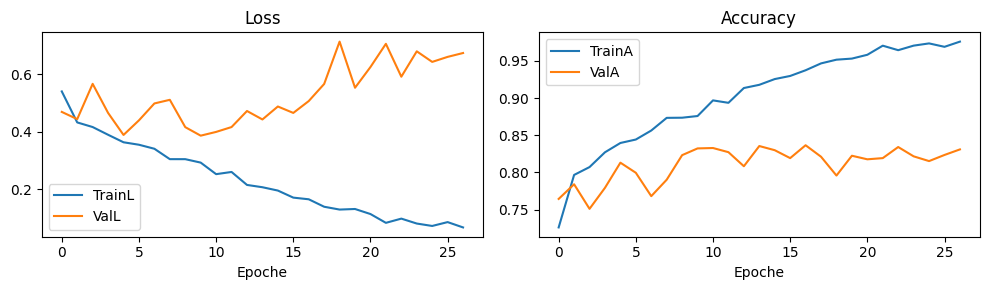


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [3, 7, 11] | Macro 3768 | Sub 15072 | per class {'L': 1891, 'R': 1877}
[DEBUG] Runs [3, 7, 11] | Macro 939 | Sub 3756 | per class {'L': 464, 'R': 475}
Ep 01/40 | TrainL 0.5164 | TrainA 0.741 | ValL 0.6157 | ValA 0.752 | BestA 0.752 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4298 | TrainA 0.799 | ValL 0.4756 | ValA 0.793 | BestA 0.793 | ↑ patience 0/10
Ep 03/40 | TrainL 0.4145 | TrainA 0.807 | ValL 0.4634 | ValA 0.794 | BestA 0.794 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3708 | TrainA 0.829 | ValL 0.4385 | ValA 0.802 | BestA 0.802 | ↑ patien

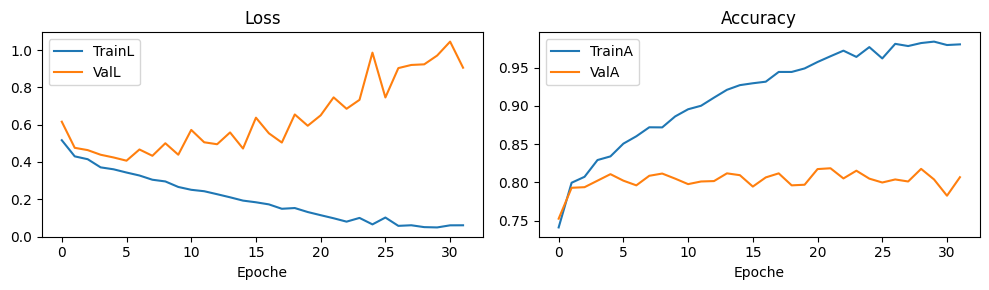


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [3, 7, 11] | Macro 3762 | Sub 15048 | per class {'L': 1881, 'R': 1881}
[DEBUG] Runs [3, 7, 11] | Macro 945 | Sub 3780 | per class {'L': 474, 'R': 471}
Ep 01/40 | TrainL 0.5481 | TrainA 0.724 | ValL 0.5048 | ValA 0.769 | BestA 0.769 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4424 | TrainA 0.795 | ValL 0.4125 | ValA 0.806 | BestA 0.806 | ↑ patience 0/10
Ep 03/40 | TrainL 0.4224 | TrainA 0.808 | ValL 0.3970 | ValA 0.796 | BestA 0.806 |   patience 1/10
Ep 04/40 | TrainL 0.3936 | TrainA 0.823 | ValL 0.5035 | ValA 0.784 | BestA 0.806 |   patien

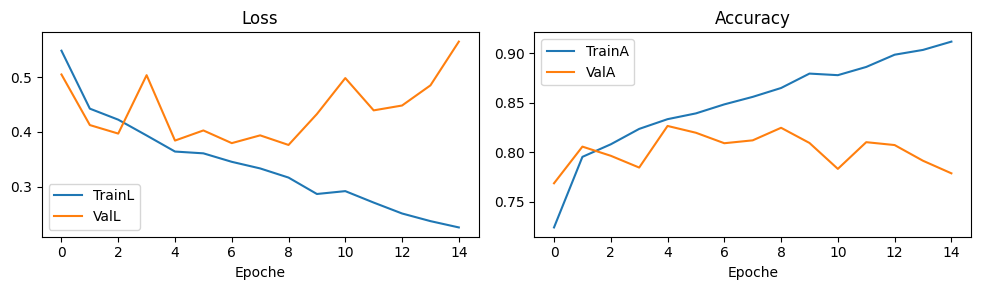


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [3, 7, 11] | Macro 3759 | Sub 15036 | per class {'L': 1880, 'R': 1879}
[DEBUG] Runs [3, 7, 11] | Macro 948 | Sub 3792 | per class {'L': 475, 'R': 473}
Ep 01/40 | TrainL 0.5480 | TrainA 0.721 | ValL 0.4613 | ValA 0.793 | BestA 0.793 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4337 | TrainA 0.798 | ValL 0.6970 | ValA 0.691 | BestA 0.793 |   patience 1/10
Ep 03/40 | TrainL 0.4118 | TrainA 0.812 | ValL 0.4110 | ValA 0.803 | BestA 0.803 | ↑ patience 0/10
Ep 04/40 | TrainL 0.3889 | TrainA 0.825 | ValL 0.4046 | ValA 0.818 | BestA 0.818 | ↑ patien

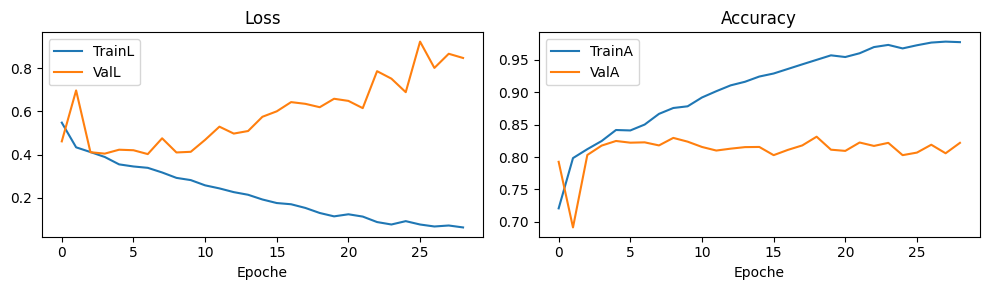


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [3, 7, 11] | Macro 3771 | Sub 15084 | per class {'L': 1887, 'R': 1884}
[DEBUG] Runs [3, 7, 11] | Macro 936 | Sub 3744 | per class {'L': 468, 'R': 468}
Ep 01/40 | TrainL 0.5382 | TrainA 0.725 | ValL 0.4249 | ValA 0.793 | BestA 0.793 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4537 | TrainA 0.787 | ValL 0.3644 | ValA 0.818 | BestA 0.818 | ↑ patience 0/10
Ep 03/40 | TrainL 0.4126 | TrainA 0.811 | ValL 0.3897 | ValA 0.816 | BestA 0.818 |   patience 1/10
Ep 04/40 | TrainL 0.3913 | TrainA 0.824 | ValL 0.3621 | ValA 0.831 | BestA 0.831 | ↑ patien

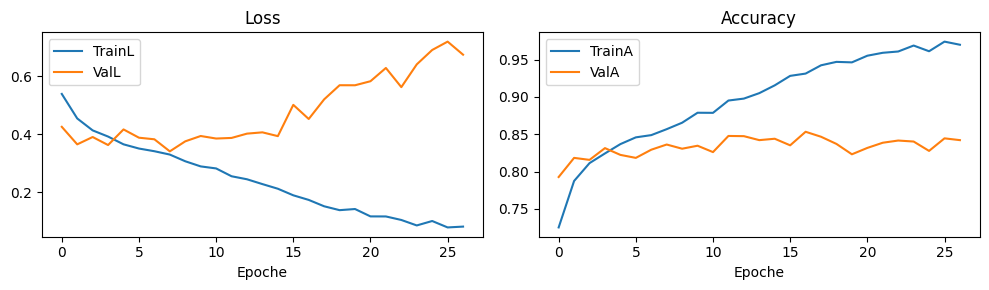


------------------------------------------------------------
exp_LR_1s_R done | Best per fold [0.836528221512247, 0.8184238551650692, 0.8264550264550264, 0.8314873417721519, 0.8533653846153846]
Media 0.833 ± 0.012
------------------------------------------------------------

 exp_LR0_1s_R | LABELS=['L', 'R', '0'] | MODE=R | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [3, 7, 11] | Macro 7560 | Sub 30240 | per class {'L': 1881, 'R': 1887, '0': 3792}
[DEBUG] Runs [3, 7, 11] | Macro 1884 | Sub 7536 | per class {'L': 474, 'R': 465, '0': 945}
Ep 01/40 | TrainL 0.

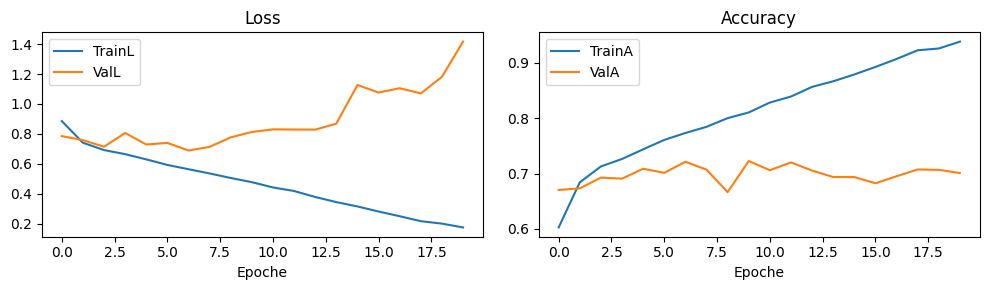


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [3, 7, 11] | Macro 7560 | Sub 30240 | per class {'L': 1891, 'R': 1877, '0': 3792}
[DEBUG] Runs [3, 7, 11] | Macro 1884 | Sub 7536 | per class {'L': 464, 'R': 475, '0': 945}
Ep 01/40 | TrainL 0.8638 | TrainA 0.622 | ValL 0.8869 | ValA 0.659 | BestA 0.659 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7374 | TrainA 0.689 | ValL 0.7134 | ValA 0.706 | BestA 0.706 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6903 | TrainA 0.718 | ValL 0.7563 | ValA 0.679 | BestA 0.706 |   patience 1/10
Ep 04/40 | TrainL 0.6542 | TrainA 0.730 | ValL 0.7035 | ValA 0.713 | 

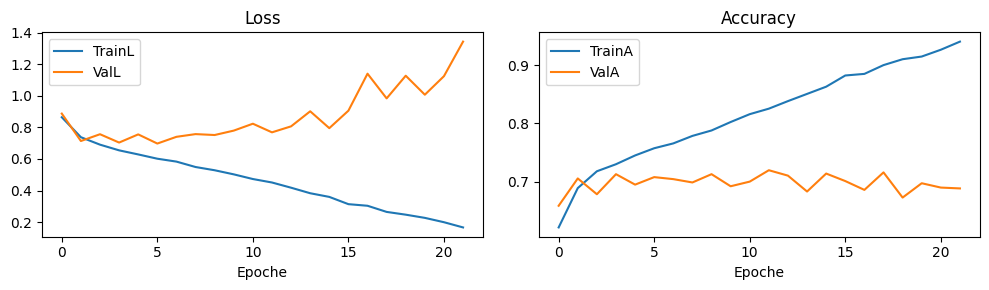


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [3, 7, 11] | Macro 7554 | Sub 30216 | per class {'L': 1881, 'R': 1881, '0': 3792}
[DEBUG] Runs [3, 7, 11] | Macro 1890 | Sub 7560 | per class {'L': 474, 'R': 471, '0': 945}
Ep 01/40 | TrainL 0.8731 | TrainA 0.608 | ValL 0.7833 | ValA 0.666 | BestA 0.666 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7395 | TrainA 0.692 | ValL 0.7545 | ValA 0.668 | BestA 0.668 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6845 | TrainA 0.718 | ValL 0.7632 | ValA 0.681 | BestA 0.681 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6608 | TrainA 0.733 | ValL 0.7223 | ValA 0.693 | 

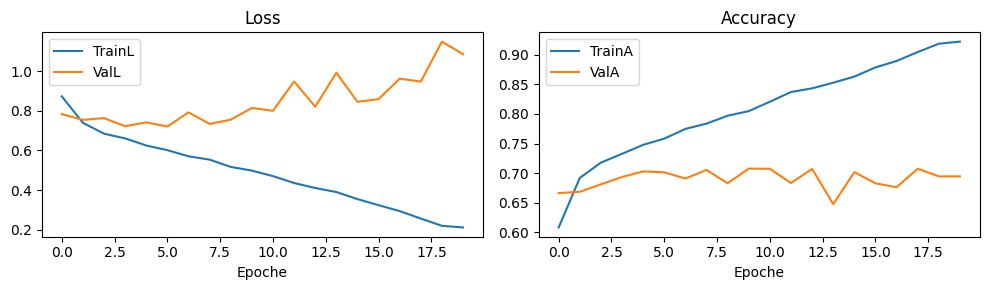


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [3, 7, 11] | Macro 7539 | Sub 30156 | per class {'L': 1880, 'R': 1879, '0': 3780}
[DEBUG] Runs [3, 7, 11] | Macro 1905 | Sub 7620 | per class {'L': 475, 'R': 473, '0': 957}
Ep 01/40 | TrainL 0.8763 | TrainA 0.608 | ValL 0.9082 | ValA 0.635 | BestA 0.635 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7370 | TrainA 0.694 | ValL 0.7624 | ValA 0.679 | BestA 0.679 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6828 | TrainA 0.724 | ValL 0.7387 | ValA 0.698 | BestA 0.698 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6585 | TrainA 0.731 | ValL 0.7395 | ValA 0.686 | 

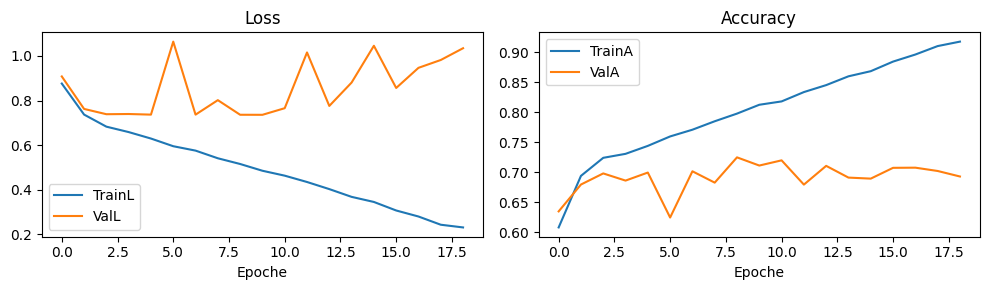


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [3, 7, 11] | Macro 7563 | Sub 30252 | per class {'L': 1887, 'R': 1884, '0': 3792}
[DEBUG] Runs [3, 7, 11] | Macro 1881 | Sub 7524 | per class {'L': 468, 'R': 468, '0': 945}
Ep 01/40 | TrainL 0.8856 | TrainA 0.601 | ValL 0.7546 | ValA 0.690 | BestA 0.690 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7567 | TrainA 0.679 | ValL 0.6315 | ValA 0.732 | BestA 0.732 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7176 | TrainA 0.702 | ValL 0.6692 | ValA 0.725 | BestA 0.732 |   patience 1/10
Ep 04/40 | TrainL 0.6816 | TrainA 0.722 | ValL 0.6142 | ValA 0.748 | 

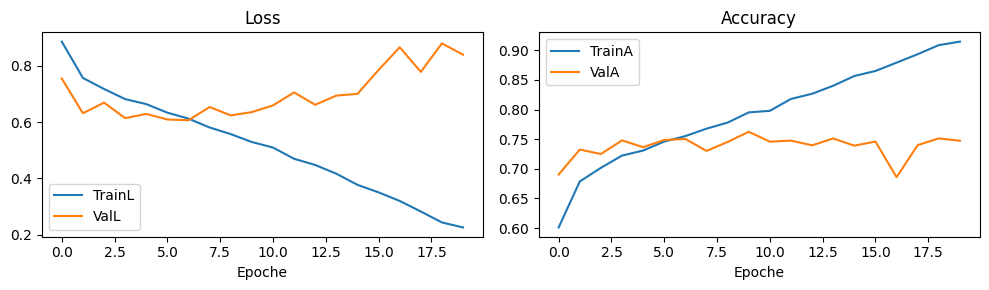


------------------------------------------------------------
exp_LR0_1s_R done | Best per fold [0.722531847133758, 0.7197452229299363, 0.7075396825396826, 0.7246719160104987, 0.7624933545986178]
Media 0.727 ± 0.019
------------------------------------------------------------

 exp_LR0F_1s_R | LABELS=['L', 'R', '0', 'F'] | MODE=R | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 13226 | Sub 52904 | per class {'L': 1881, 'R': 1887, '0': 7573, 'F': 1885}
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 3301 | Sub 13204 | per class {'L': 474, 

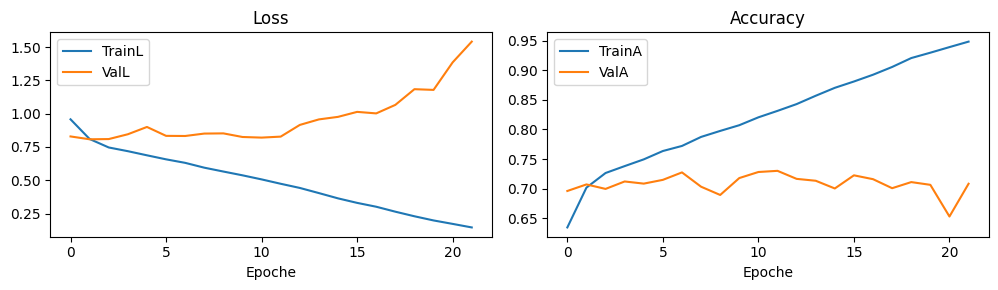


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 13231 | Sub 52924 | per class {'L': 1891, 'R': 1877, '0': 7573, 'F': 1890}
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 3296 | Sub 13184 | per class {'L': 464, 'R': 475, '0': 1890, 'F': 467}
Ep 01/40 | TrainL 0.9595 | TrainA 0.633 | ValL 1.0833 | ValA 0.641 | BestA 0.641 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8207 | TrainA 0.695 | ValL 0.8471 | ValA 0.697 | BestA 0.697 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7661 | TrainA 0.717 | ValL 0.8365 | ValA 0.697 | BestA 0.697 |   patience 1/10
Ep 04/40 | TrainL 0.7264 

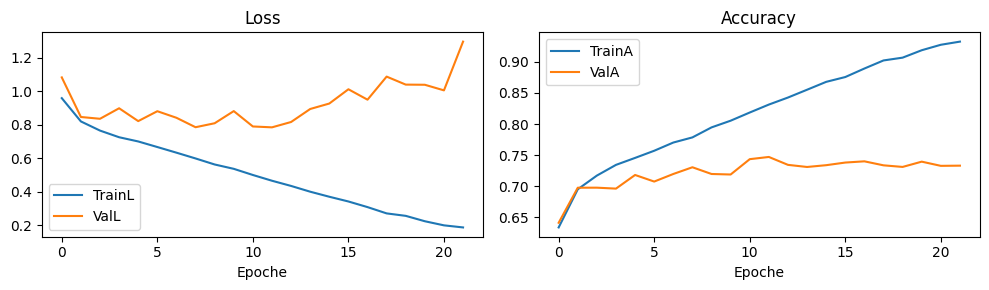


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 13214 | Sub 52856 | per class {'L': 1881, 'R': 1881, '0': 7573, 'F': 1879}
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 3313 | Sub 13252 | per class {'L': 474, 'R': 471, '0': 1890, 'F': 478}
Ep 01/40 | TrainL 0.9545 | TrainA 0.638 | ValL 0.8811 | ValA 0.670 | BestA 0.670 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8073 | TrainA 0.704 | ValL 0.8171 | ValA 0.695 | BestA 0.695 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7594 | TrainA 0.725 | ValL 0.8314 | ValA 0.687 | BestA 0.695 |   patience 1/10
Ep 04/40 | TrainL 0.7299 

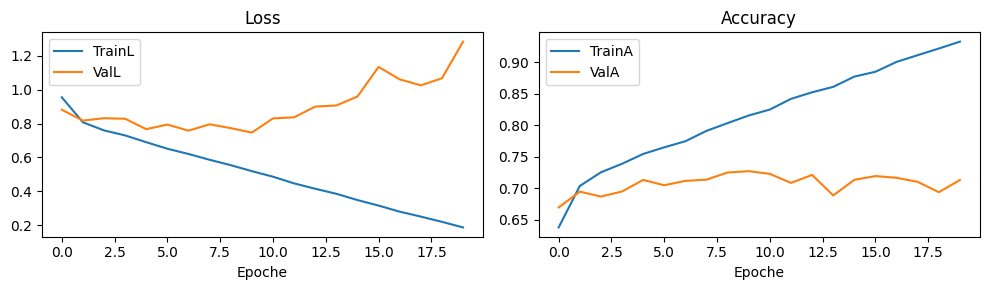


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 13191 | Sub 52764 | per class {'L': 1880, 'R': 1879, '0': 7549, 'F': 1883}
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 3336 | Sub 13344 | per class {'L': 475, 'R': 473, '0': 1914, 'F': 474}
Ep 01/40 | TrainL 0.9604 | TrainA 0.637 | ValL 0.8861 | ValA 0.679 | BestA 0.679 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8132 | TrainA 0.701 | ValL 0.7911 | ValA 0.714 | BestA 0.714 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7595 | TrainA 0.724 | ValL 0.7935 | ValA 0.703 | BestA 0.714 |   patience 1/10
Ep 04/40 | TrainL 0.7132 

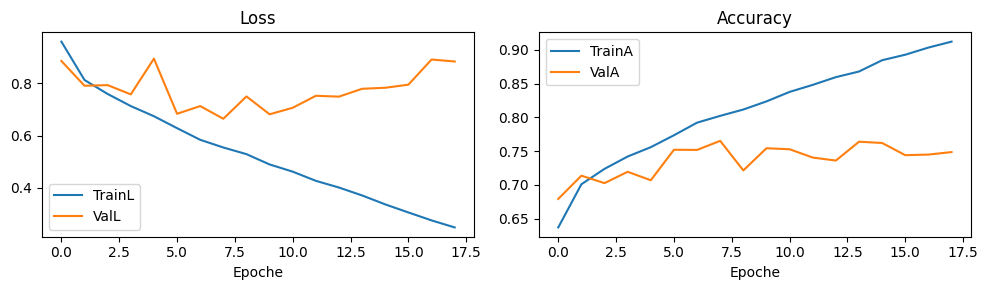


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 13246 | Sub 52984 | per class {'L': 1887, 'R': 1884, '0': 7584, 'F': 1891}
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 3281 | Sub 13124 | per class {'L': 468, 'R': 468, '0': 1879, 'F': 466}
Ep 01/40 | TrainL 0.9913 | TrainA 0.623 | ValL 0.8831 | ValA 0.684 | BestA 0.684 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8333 | TrainA 0.695 | ValL 0.7964 | ValA 0.710 | BestA 0.710 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7875 | TrainA 0.715 | ValL 0.7524 | ValA 0.722 | BestA 0.722 | ↑ patience 0/10
Ep 04/40 | TrainL 0.7506 

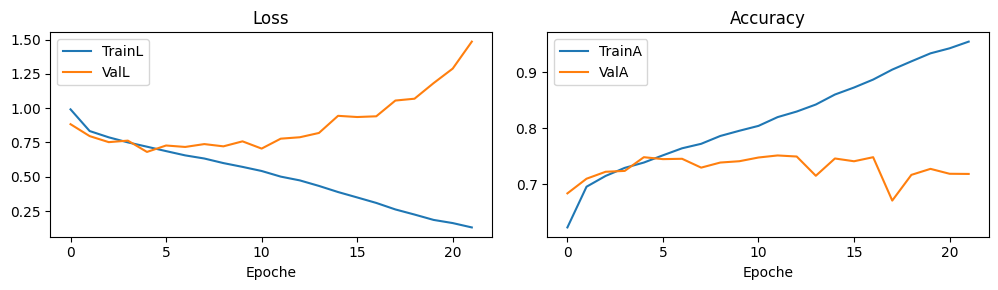


------------------------------------------------------------
exp_LR0F_1s_R done | Best per fold [0.7300817933959406, 0.7468901699029126, 0.7270600664050709, 0.7652877697841727, 0.7512953367875648]
Media 0.744 ± 0.014
------------------------------------------------------------

 exp_LR0FB_1s_R | LABELS=['L', 'R', '0', 'F', 'B'] | MODE=R | WIN=1.0s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 15098 | Sub 60392 | per class {'L': 1881, 'R': 1887, '0': 7573, 'F': 1885, 'B': 1872}
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 3768 | Sub 15072 | pe

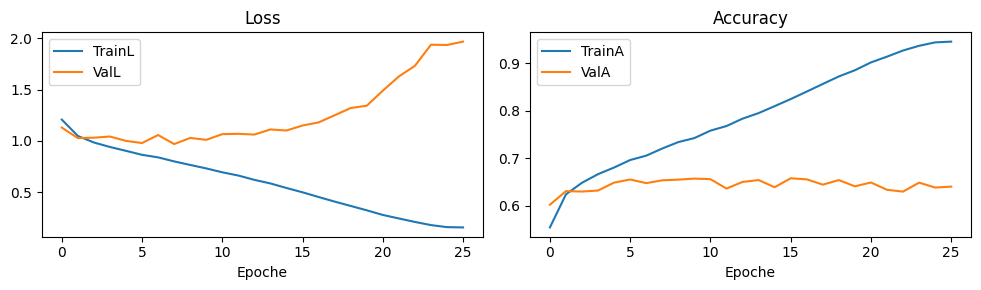


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 15098 | Sub 60392 | per class {'L': 1891, 'R': 1877, '0': 7573, 'F': 1890, 'B': 1867}
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 3768 | Sub 15072 | per class {'L': 464, 'R': 475, '0': 1890, 'F': 467, 'B': 472}
Ep 01/40 | TrainL 1.1999 | TrainA 0.557 | ValL 1.1056 | ValA 0.599 | BestA 0.599 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0373 | TrainA 0.623 | ValL 1.0156 | ValA 0.644 | BestA 0.644 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9808 | TrainA 0.646 | ValL 0.9999 | ValA 0.649 | BestA 0.649 | ↑ patience 0/10
Ep 0

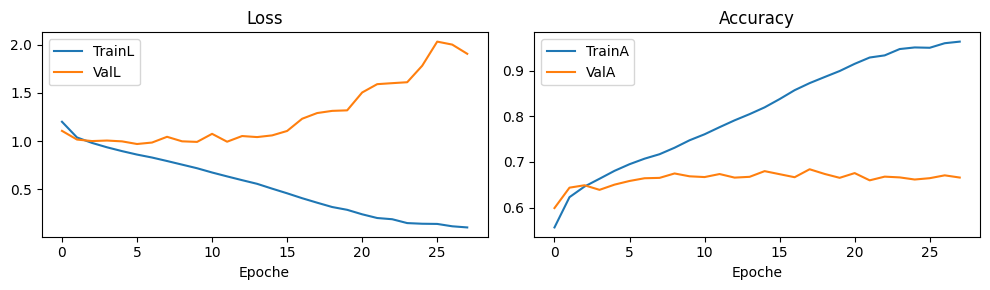


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 15086 | Sub 60344 | per class {'L': 1881, 'R': 1881, '0': 7573, 'F': 1879, 'B': 1872}
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 3780 | Sub 15120 | per class {'L': 474, 'R': 471, '0': 1890, 'F': 478, 'B': 467}
Ep 01/40 | TrainL 1.1924 | TrainA 0.560 | ValL 1.1409 | ValA 0.588 | BestA 0.588 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0290 | TrainA 0.632 | ValL 1.0878 | ValA 0.608 | BestA 0.608 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9694 | TrainA 0.657 | ValL 1.1786 | ValA 0.602 | BestA 0.608 |   patience 1/10
Ep 0

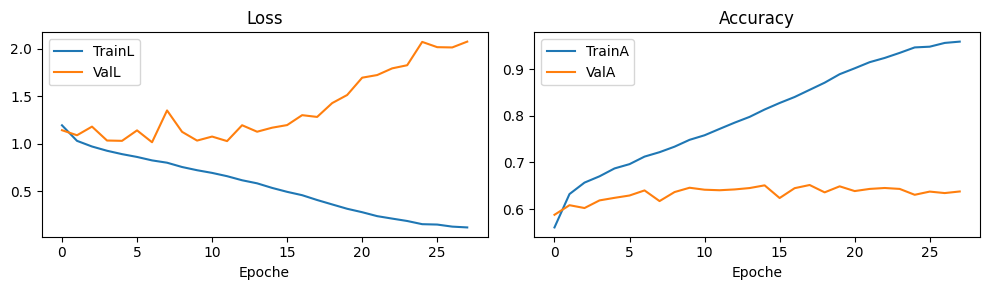


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 15056 | Sub 60224 | per class {'L': 1880, 'R': 1879, '0': 7549, 'F': 1883, 'B': 1865}
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 3810 | Sub 15240 | per class {'L': 475, 'R': 473, '0': 1914, 'F': 474, 'B': 474}
Ep 01/40 | TrainL 1.1962 | TrainA 0.558 | ValL 1.1886 | ValA 0.592 | BestA 0.592 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0347 | TrainA 0.628 | ValL 1.0856 | ValA 0.621 | BestA 0.621 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9700 | TrainA 0.655 | ValL 1.0066 | ValA 0.641 | BestA 0.641 | ↑ patience 0/10
Ep 0

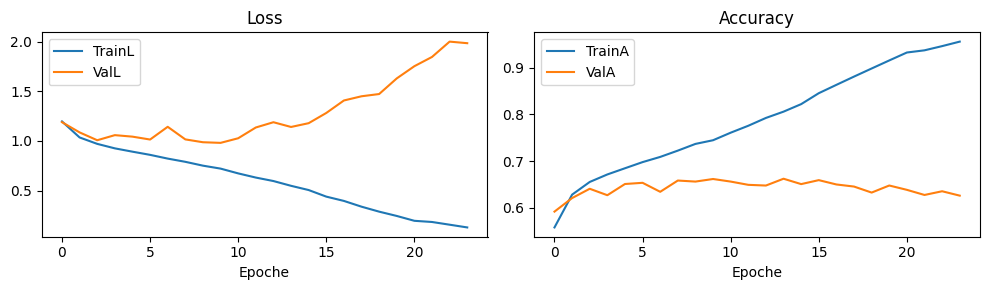


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 15126 | Sub 60504 | per class {'L': 1887, 'R': 1884, '0': 7584, 'F': 1891, 'B': 1880}
[DEBUG] Runs [3, 5, 7, 9, 11, 13] | Macro 3740 | Sub 14960 | per class {'L': 468, 'R': 468, '0': 1879, 'F': 466, 'B': 459}
Ep 01/40 | TrainL 1.2113 | TrainA 0.555 | ValL 1.0051 | ValA 0.626 | BestA 0.626 | ↑ patience 0/10
Ep 02/40 | TrainL 1.0487 | TrainA 0.620 | ValL 0.9216 | ValA 0.671 | BestA 0.671 | ↑ patience 0/10
Ep 03/40 | TrainL 0.9875 | TrainA 0.645 | ValL 0.9271 | ValA 0.670 | BestA 0.671 |   patience 1/10
Ep 0

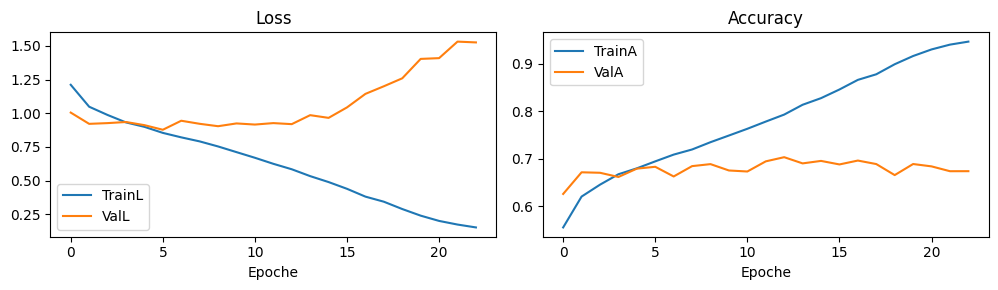


------------------------------------------------------------
exp_LR0FB_1s_R done | Best per fold [0.6574442675159236, 0.6840498938428875, 0.6515873015873016, 0.6623359580052494, 0.7031417112299465]
Media 0.672 ± 0.019
------------------------------------------------------------

 exp_LR0_1s_LOSO | LABELS=['L', 'R', '0'] | MODE=I | WIN=1.0s | FOLDS=105

→ Fold 1/105 | Train [64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | Trai

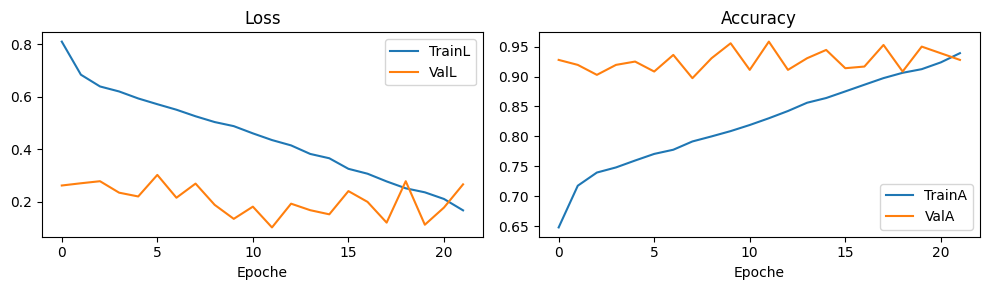


→ Fold 2/105 | Train [57, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [64]
[DEBUG] Runs [4, 8, 12] | Macro 9366 | Sub 37464 | per class {'L': 2357, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 89 | Sub 356 | per class {'L': 23, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8171 | TrainA 0.642 | ValL 0.6761 | ValA 0.694 | BestA 0.694 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6812 | TrainA 0.721 | ValL 0.7955 | ValA 0.722 | BestA 0.722 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6485 | TrainA 0.736 | ValL 0.6896 | ValA 0.761 | BestA 0.761 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6115 | TrainA 0.750 | ValL 0.6959 | ValA 0.728 | Best

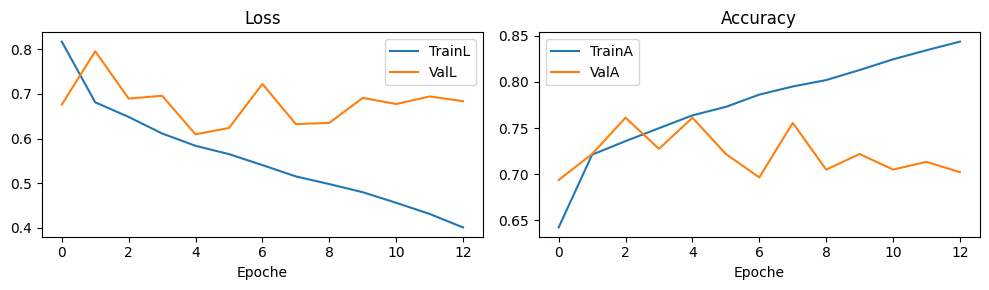


→ Fold 3/105 | Train [57, 64, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [10]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8062 | TrainA 0.650 | ValL 0.8620 | ValA 0.681 | BestA 0.681 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6900 | TrainA 0.713 | ValL 0.9796 | ValA 0.653 | BestA 0.681 |   patience 1/10
Ep 03/40 | TrainL 0.6442 | TrainA 0.737 | ValL 0.9538 | ValA 0.578 | BestA 0.681 |   patience 2/10
Ep 04/40 | TrainL 0.6127 | TrainA 0.751 | ValL 0.9911 | ValA 0.719 | Best

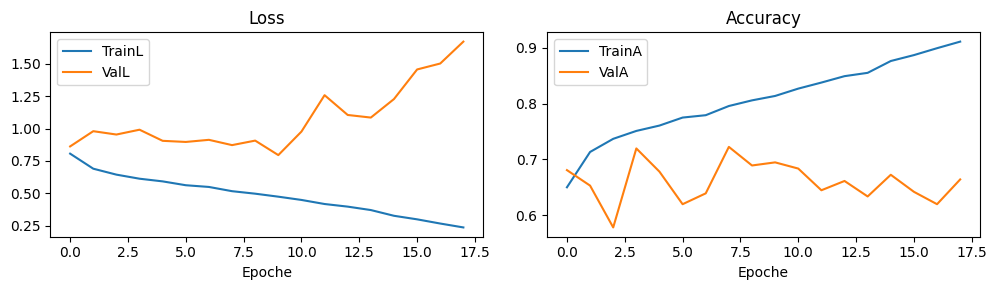


→ Fold 4/105 | Train [57, 64, 10, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [51]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8326 | TrainA 0.637 | ValL 0.7982 | ValA 0.661 | BestA 0.661 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6920 | TrainA 0.715 | ValL 0.8452 | ValA 0.611 | BestA 0.661 |   patience 1/10
Ep 03/40 | TrainL 0.6427 | TrainA 0.739 | ValL 0.8630 | ValA 0.614 | BestA 0.661 |   patience 2/10
Ep 04/40 | TrainL 0.6117 | TrainA 0.753 | ValL 0.9544 | ValA 0.614 | Best

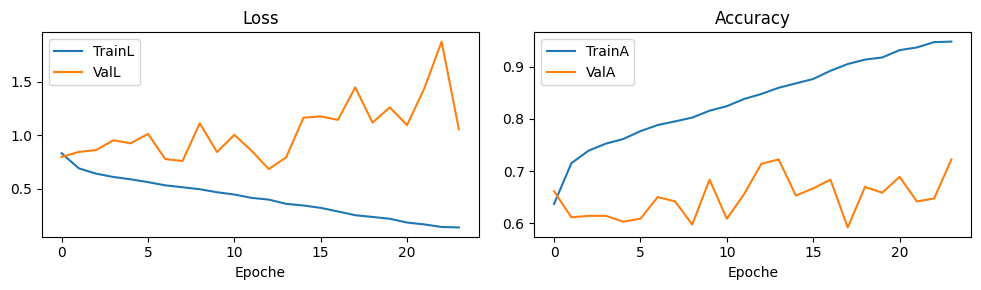


→ Fold 5/105 | Train [57, 64, 10, 51, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [78]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8122 | TrainA 0.647 | ValL 0.9595 | ValA 0.572 | BestA 0.572 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6880 | TrainA 0.714 | ValL 0.9500 | ValA 0.547 | BestA 0.572 |   patience 1/10
Ep 03/40 | TrainL 0.6402 | TrainA 0.737 | ValL 1.1203 | ValA 0.617 | BestA 0.617 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6061 | TrainA 0.752 | ValL 0.8425 | ValA 0.628 | Best

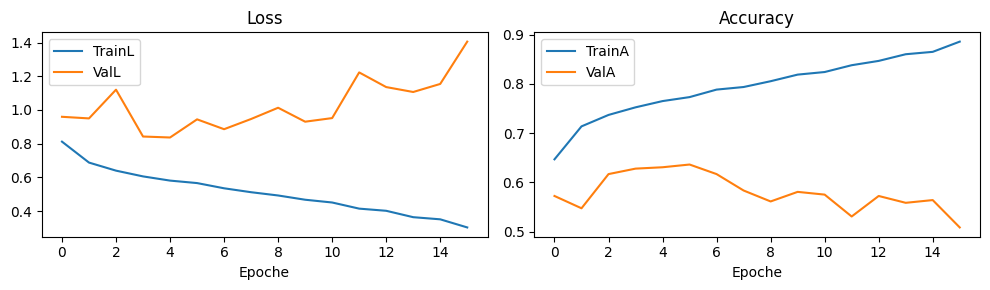


→ Fold 6/105 | Train [57, 64, 10, 51, 78, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [5]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2359, 'R': 2314, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 21, 'R': 24, '0': 45}
Ep 01/40 | TrainL 0.8093 | TrainA 0.645 | ValL 0.9654 | ValA 0.619 | BestA 0.619 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6861 | TrainA 0.719 | ValL 0.9641 | ValA 0.572 | BestA 0.619 |   patience 1/10
Ep 03/40 | TrainL 0.6490 | TrainA 0.731 | ValL 0.8455 | ValA 0.647 | BestA 0.647 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6105 | TrainA 0.753 | ValL 0.7373 | ValA 0.661 | Best

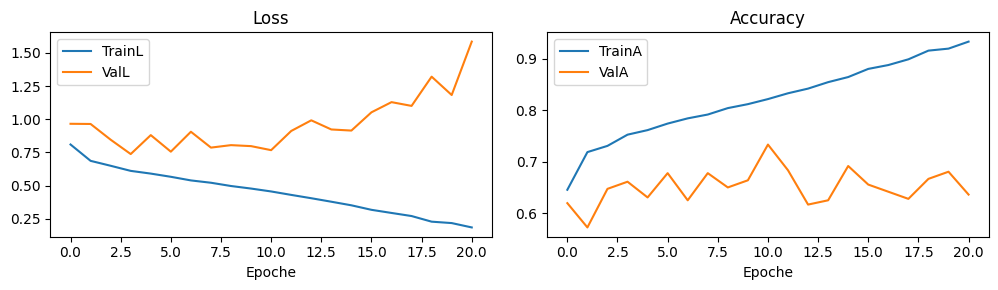


→ Fold 7/105 | Train [57, 64, 10, 51, 78, 5, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [67]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8169 | TrainA 0.642 | ValL 0.8856 | ValA 0.625 | BestA 0.625 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6808 | TrainA 0.721 | ValL 0.8282 | ValA 0.678 | BestA 0.678 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6377 | TrainA 0.740 | ValL 0.9892 | ValA 0.586 | BestA 0.678 |   patience 1/10
Ep 04/40 | TrainL 0.6095 | TrainA 0.752 | ValL 0.8909 | ValA 0.633 | Best

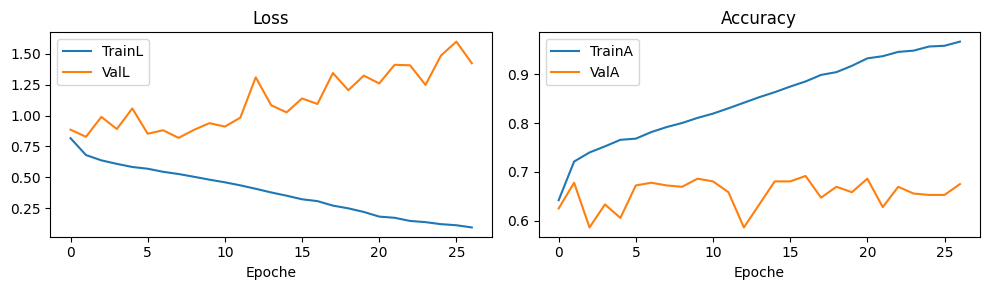


→ Fold 8/105 | Train [57, 64, 10, 51, 78, 5, 67, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [56]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8197 | TrainA 0.640 | ValL 0.4810 | ValA 0.817 | BestA 0.817 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6928 | TrainA 0.714 | ValL 0.5425 | ValA 0.792 | BestA 0.817 |   patience 1/10
Ep 03/40 | TrainL 0.6548 | TrainA 0.729 | ValL 0.4541 | ValA 0.819 | BestA 0.819 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6274 | TrainA 0.745 | ValL 0.4532 | ValA 0.817 | Best

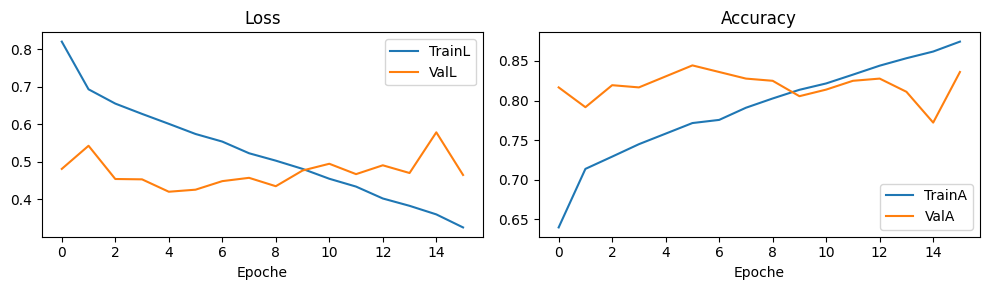


→ Fold 9/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [71]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8155 | TrainA 0.644 | ValL 0.7124 | ValA 0.697 | BestA 0.697 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6781 | TrainA 0.718 | ValL 0.7026 | ValA 0.700 | BestA 0.700 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6402 | TrainA 0.739 | ValL 0.6921 | ValA 0.742 | BestA 0.742 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6181 | TrainA 0.746 | ValL 0.6871 | ValA 0.739 | Best

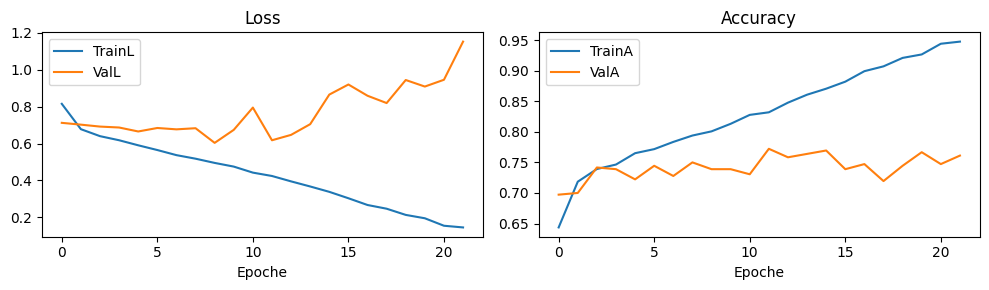


→ Fold 10/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [44]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8152 | TrainA 0.646 | ValL 0.8456 | ValA 0.658 | BestA 0.658 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6847 | TrainA 0.720 | ValL 0.6208 | ValA 0.744 | BestA 0.744 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6429 | TrainA 0.739 | ValL 0.7025 | ValA 0.675 | BestA 0.744 |   patience 1/10
Ep 04/40 | TrainL 0.6096 | TrainA 0.752 | ValL 0.6721 | ValA 0.736 | Bes

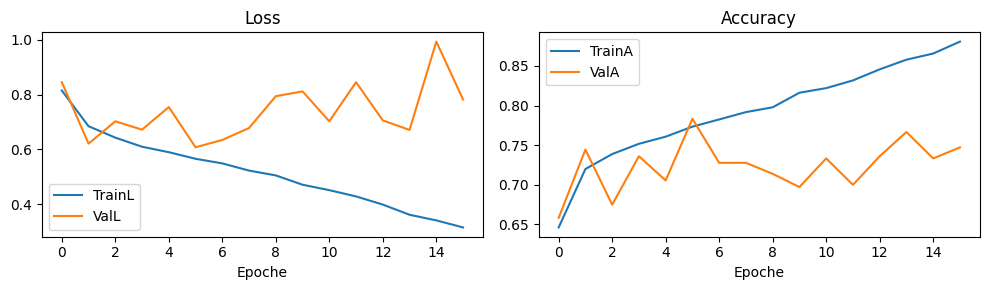


→ Fold 11/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [99]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8062 | TrainA 0.650 | ValL 1.0041 | ValA 0.567 | BestA 0.567 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6811 | TrainA 0.722 | ValL 1.0888 | ValA 0.578 | BestA 0.578 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6479 | TrainA 0.736 | ValL 0.9590 | ValA 0.614 | BestA 0.614 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6163 | TrainA 0.748 | ValL 1.0213 | ValA 0.606 | Bes

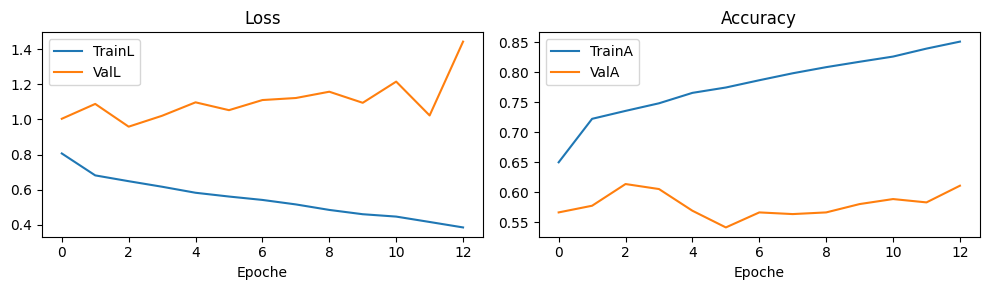


→ Fold 12/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [4]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8182 | TrainA 0.648 | ValL 0.7322 | ValA 0.711 | BestA 0.711 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6885 | TrainA 0.717 | ValL 0.6632 | ValA 0.711 | BestA 0.711 |   patience 1/10
Ep 03/40 | TrainL 0.6371 | TrainA 0.740 | ValL 0.8146 | ValA 0.689 | BestA 0.711 |   patience 2/10
Ep 04/40 | TrainL 0.6116 | TrainA 0.753 | ValL 0.7534 | ValA 0.700 | Bes

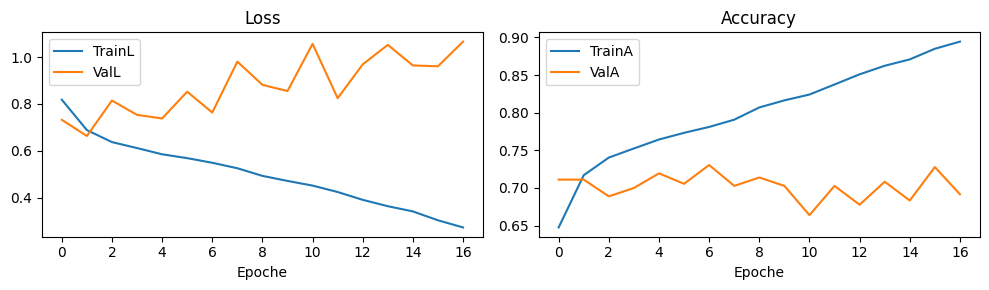


→ Fold 13/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [83]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8028 | TrainA 0.656 | ValL 0.9293 | ValA 0.628 | BestA 0.628 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6815 | TrainA 0.719 | ValL 0.7084 | ValA 0.653 | BestA 0.653 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6422 | TrainA 0.736 | ValL 0.7761 | ValA 0.644 | BestA 0.653 |   patience 1/10
Ep 04/40 | TrainL 0.6023 | TrainA 0.756 | ValL 0.6598 | ValA 0.736 | Bes

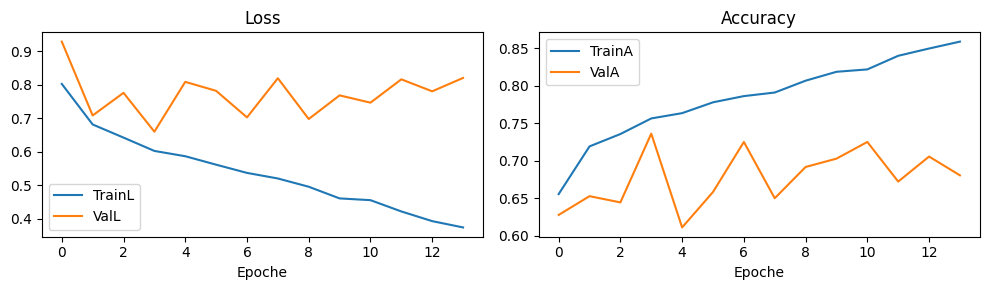


→ Fold 14/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [85]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8119 | TrainA 0.642 | ValL 0.7533 | ValA 0.675 | BestA 0.675 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6888 | TrainA 0.714 | ValL 0.6272 | ValA 0.728 | BestA 0.728 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6419 | TrainA 0.733 | ValL 0.5763 | ValA 0.742 | BestA 0.742 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6223 | TrainA 0.750 | ValL 0.5749 | ValA 0.772 | Bes

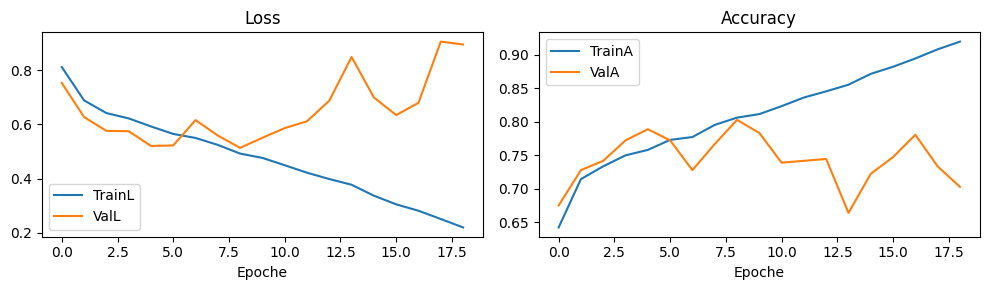


→ Fold 15/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [16]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8119 | TrainA 0.648 | ValL 0.9791 | ValA 0.608 | BestA 0.608 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6866 | TrainA 0.719 | ValL 0.9820 | ValA 0.597 | BestA 0.608 |   patience 1/10
Ep 03/40 | TrainL 0.6359 | TrainA 0.740 | ValL 0.9870 | ValA 0.569 | BestA 0.608 |   patience 2/10
Ep 04/40 | TrainL 0.6065 | TrainA 0.755 | ValL 0.8933 | ValA 0.608 | Bes

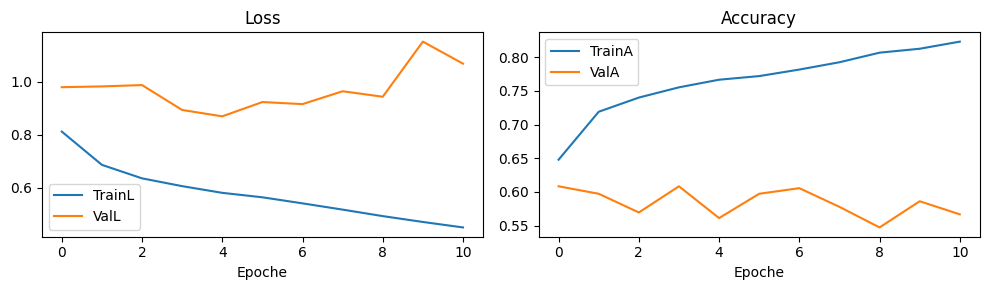


→ Fold 16/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [63]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8053 | TrainA 0.653 | ValL 0.5839 | ValA 0.772 | BestA 0.772 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6795 | TrainA 0.719 | ValL 0.6286 | ValA 0.781 | BestA 0.781 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6440 | TrainA 0.739 | ValL 0.6334 | ValA 0.744 | BestA 0.781 |   patience 1/10
Ep 04/40 | TrainL 0.6142 | TrainA 0.748 | ValL 0.6952 | ValA 0.683 | Bes

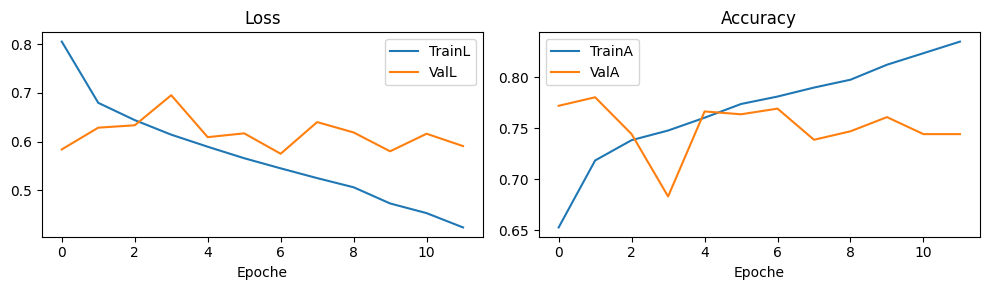


→ Fold 17/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [48]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8237 | TrainA 0.641 | ValL 0.6639 | ValA 0.714 | BestA 0.714 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6934 | TrainA 0.711 | ValL 0.6878 | ValA 0.689 | BestA 0.714 |   patience 1/10
Ep 03/40 | TrainL 0.6507 | TrainA 0.737 | ValL 0.5420 | ValA 0.747 | BestA 0.747 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6182 | TrainA 0.746 | ValL 0.5726 | ValA 0.756 | Bes

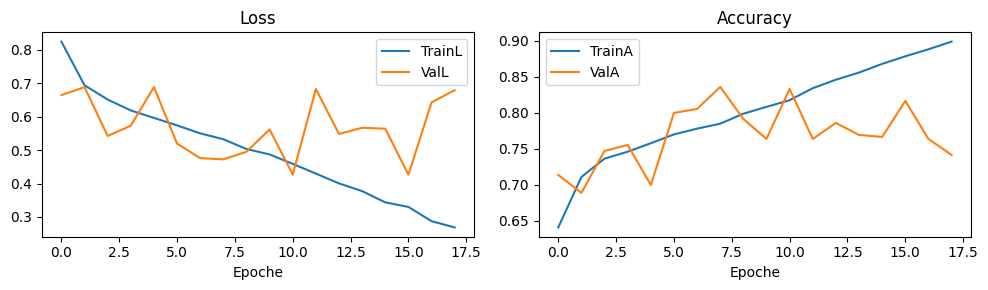


→ Fold 18/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [1]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8145 | TrainA 0.645 | ValL 0.6292 | ValA 0.731 | BestA 0.731 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6755 | TrainA 0.722 | ValL 0.6508 | ValA 0.725 | BestA 0.731 |   patience 1/10
Ep 03/40 | TrainL 0.6416 | TrainA 0.739 | ValL 0.6832 | ValA 0.708 | BestA 0.731 |   patience 2/10
Ep 04/40 | TrainL 0.6209 | TrainA 0.749 | ValL 0.6494 | ValA 0.714 | Bes

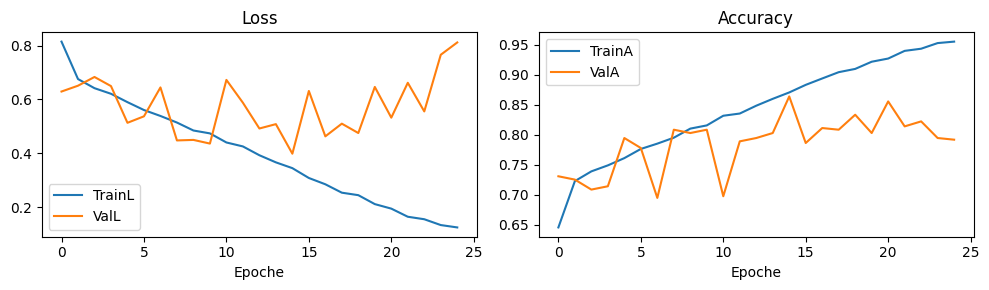


→ Fold 19/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [55]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8205 | TrainA 0.639 | ValL 0.6175 | ValA 0.756 | BestA 0.756 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6875 | TrainA 0.718 | ValL 0.6015 | ValA 0.742 | BestA 0.756 |   patience 1/10
Ep 03/40 | TrainL 0.6424 | TrainA 0.737 | ValL 0.4202 | ValA 0.831 | BestA 0.831 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6163 | TrainA 0.752 | ValL 0.4135 | ValA 0.833 | Bes

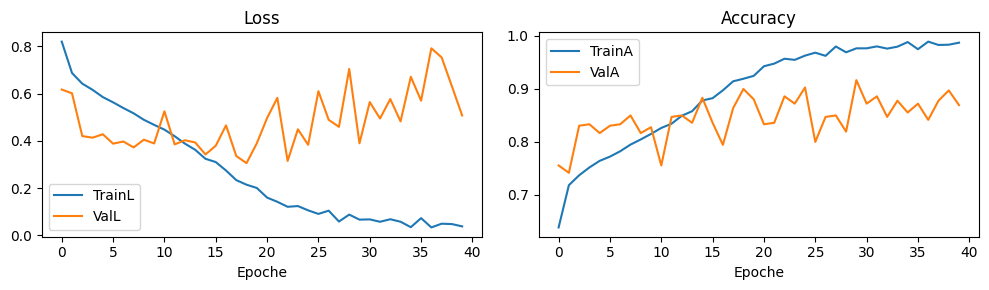


→ Fold 20/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [19]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8091 | TrainA 0.649 | ValL 0.7845 | ValA 0.608 | BestA 0.608 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6839 | TrainA 0.719 | ValL 0.6555 | ValA 0.736 | BestA 0.736 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6519 | TrainA 0.734 | ValL 0.7045 | ValA 0.706 | BestA 0.736 |   patience 1/10
Ep 04/40 | TrainL 0.6174 | TrainA 0.747 | ValL 0.6100 | ValA 0.717 | Bes

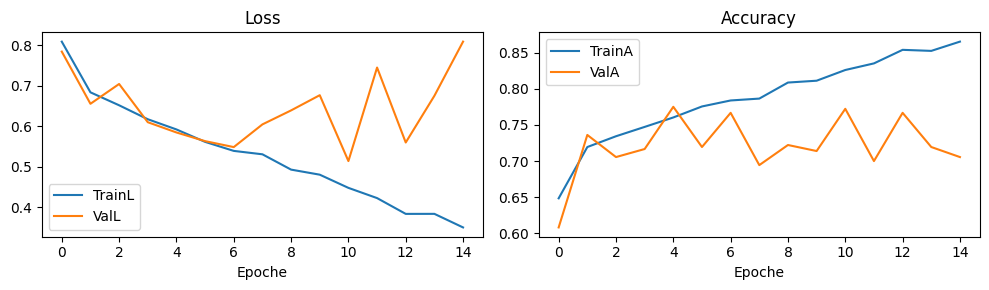


→ Fold 21/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [101]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8179 | TrainA 0.645 | ValL 0.4059 | ValA 0.858 | BestA 0.858 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6832 | TrainA 0.717 | ValL 0.4125 | ValA 0.844 | BestA 0.858 |   patience 1/10
Ep 03/40 | TrainL 0.6421 | TrainA 0.738 | ValL 0.2900 | ValA 0.897 | BestA 0.897 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6128 | TrainA 0.752 | ValL 0.2250 | ValA 0.936 | Bes

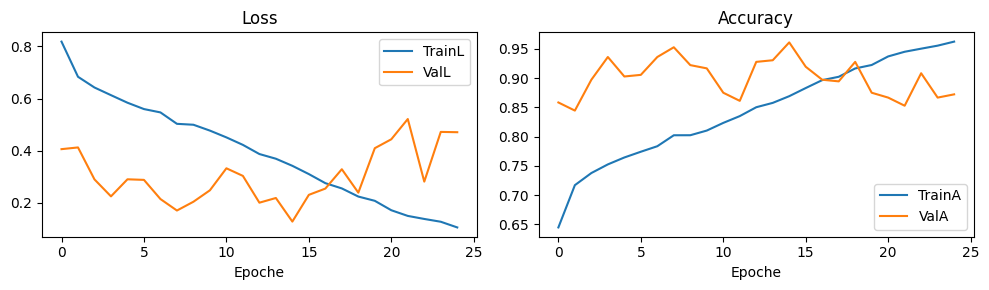


→ Fold 22/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41]
[DEBUG] Runs [4, 8, 12] | Macro 9366 | Sub 37464 | per class {'L': 2357, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 89 | Sub 356 | per class {'L': 23, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8165 | TrainA 0.642 | ValL 0.4616 | ValA 0.831 | BestA 0.831 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6854 | TrainA 0.715 | ValL 0.5515 | ValA 0.770 | BestA 0.831 |   patience 1/10
Ep 03/40 | TrainL 0.6380 | TrainA 0.739 | ValL 0.5771 | ValA 0.787 | BestA 0.831 |   patience 2/10
Ep 04/40 | TrainL 0.6167 | TrainA 0.750 | ValL 0.5224 | ValA 0.809 | Bes

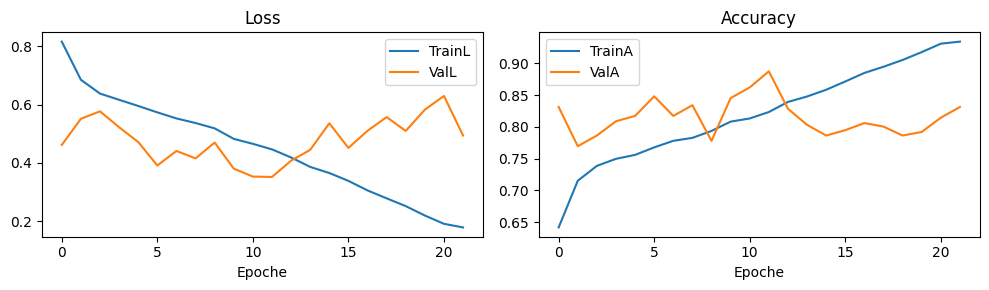


→ Fold 23/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [15]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8155 | TrainA 0.647 | ValL 0.4448 | ValA 0.831 | BestA 0.831 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6860 | TrainA 0.722 | ValL 0.4277 | ValA 0.856 | BestA 0.856 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6488 | TrainA 0.737 | ValL 0.4189 | ValA 0.839 | BestA 0.856 |   patience 1/10
Ep 04/40 | TrainL 0.6238 | TrainA 0.745 | ValL 0.4413 | ValA 0.831 | Bes

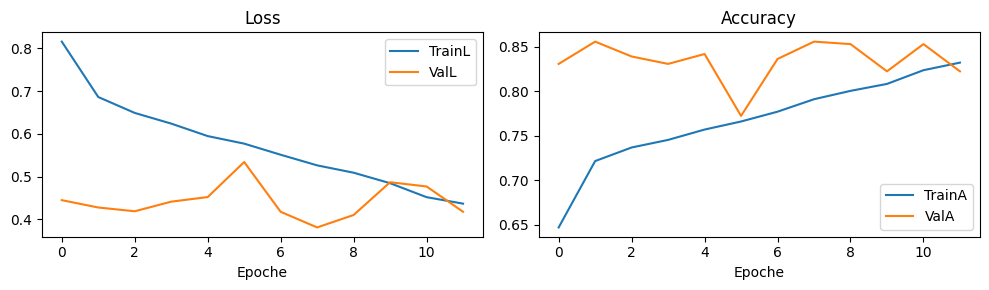


→ Fold 24/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [26]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8026 | TrainA 0.648 | ValL 1.0045 | ValA 0.556 | BestA 0.556 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6805 | TrainA 0.719 | ValL 1.0334 | ValA 0.528 | BestA 0.556 |   patience 1/10
Ep 03/40 | TrainL 0.6329 | TrainA 0.740 | ValL 0.8831 | ValA 0.686 | BestA 0.686 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6089 | TrainA 0.752 | ValL 0.7980 | ValA 0.636 | Bes

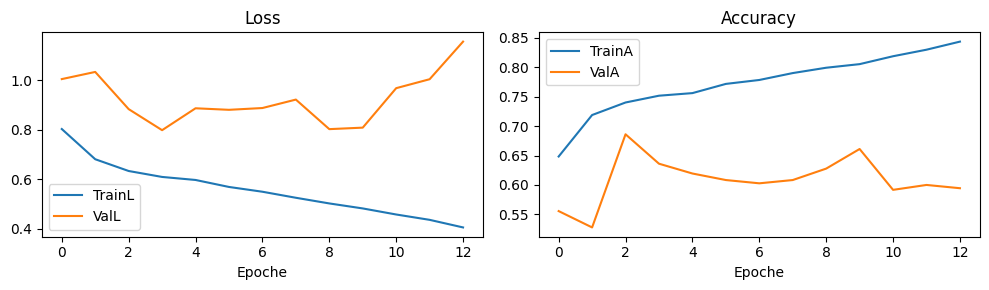


→ Fold 25/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [28]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8104 | TrainA 0.647 | ValL 0.7025 | ValA 0.694 | BestA 0.694 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6806 | TrainA 0.720 | ValL 0.7522 | ValA 0.661 | BestA 0.694 |   patience 1/10
Ep 03/40 | TrainL 0.6398 | TrainA 0.740 | ValL 0.7073 | ValA 0.694 | BestA 0.694 |   patience 2/10
Ep 04/40 | TrainL 0.6093 | TrainA 0.754 | ValL 0.8286 | ValA 0.653 | Bes

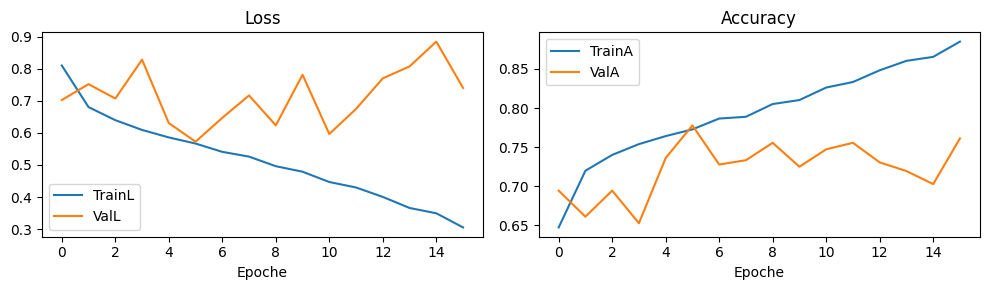


→ Fold 26/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [11]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8230 | TrainA 0.639 | ValL 0.7430 | ValA 0.697 | BestA 0.697 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6847 | TrainA 0.718 | ValL 0.7037 | ValA 0.722 | BestA 0.722 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6463 | TrainA 0.738 | ValL 0.6435 | ValA 0.753 | BestA 0.753 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6209 | TrainA 0.745 | ValL 0.6229 | ValA 0.783 | Bes

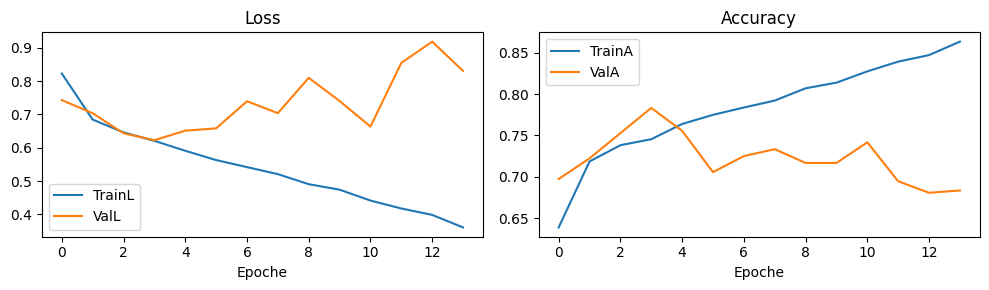


→ Fold 27/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [108]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8104 | TrainA 0.647 | ValL 0.7751 | ValA 0.667 | BestA 0.667 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6770 | TrainA 0.719 | ValL 0.8539 | ValA 0.672 | BestA 0.672 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6401 | TrainA 0.739 | ValL 0.6972 | ValA 0.714 | BestA 0.714 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6103 | TrainA 0.755 | ValL 0.8736 | ValA 0.650 | Bes

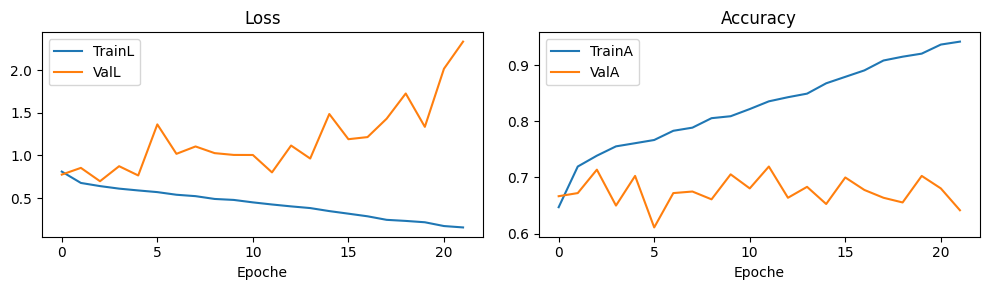


→ Fold 28/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [103]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8144 | TrainA 0.649 | ValL 0.7934 | ValA 0.694 | BestA 0.694 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6838 | TrainA 0.718 | ValL 0.7898 | ValA 0.661 | BestA 0.694 |   patience 1/10
Ep 03/40 | TrainL 0.6480 | TrainA 0.737 | ValL 0.7435 | ValA 0.711 | BestA 0.711 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6123 | TrainA 0.750 | ValL 0.7822 | ValA 0.675 | Bes

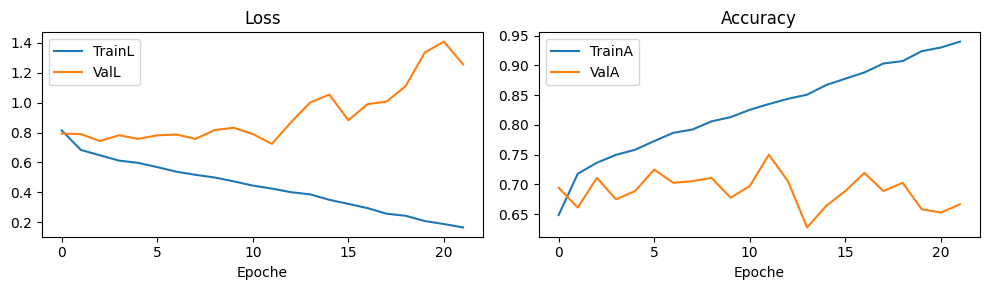


→ Fold 29/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [27]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8037 | TrainA 0.650 | ValL 0.7153 | ValA 0.686 | BestA 0.686 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6905 | TrainA 0.712 | ValL 0.5491 | ValA 0.783 | BestA 0.783 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6433 | TrainA 0.735 | ValL 0.4878 | ValA 0.867 | BestA 0.867 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6115 | TrainA 0.751 | ValL 0.4989 | ValA 0.800 | Bes

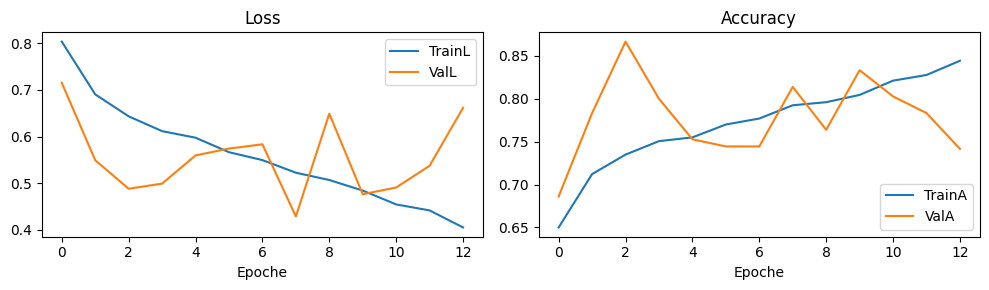


→ Fold 30/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [23]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8053 | TrainA 0.652 | ValL 0.8474 | ValA 0.658 | BestA 0.658 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6819 | TrainA 0.719 | ValL 0.8204 | ValA 0.664 | BestA 0.664 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6441 | TrainA 0.738 | ValL 0.7945 | ValA 0.700 | BestA 0.700 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6144 | TrainA 0.752 | ValL 0.8245 | ValA 0.703 | Bes

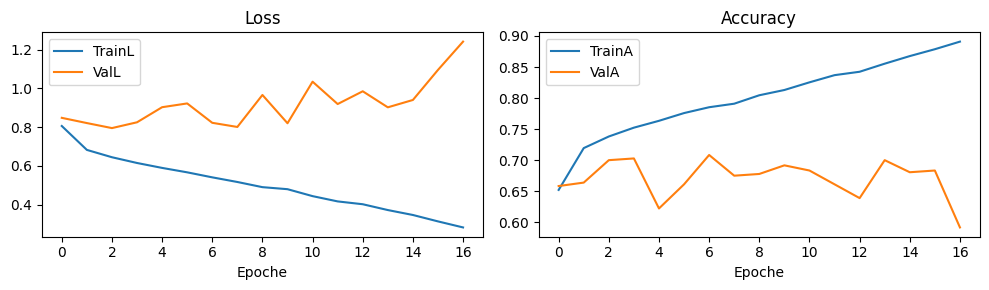


→ Fold 31/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [18]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8171 | TrainA 0.641 | ValL 0.2583 | ValA 0.972 | BestA 0.972 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6893 | TrainA 0.715 | ValL 0.2489 | ValA 0.919 | BestA 0.972 |   patience 1/10
Ep 03/40 | TrainL 0.6465 | TrainA 0.737 | ValL 0.2018 | ValA 0.958 | BestA 0.972 |   patience 2/10
Ep 04/40 | TrainL 0.6167 | TrainA 0.746 | ValL 0.1399 | ValA 0.967 | Bes

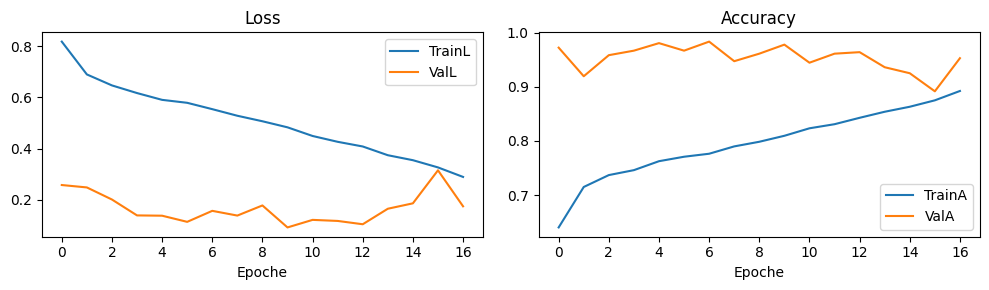


→ Fold 32/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [93]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8093 | TrainA 0.652 | ValL 0.8128 | ValA 0.661 | BestA 0.661 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6815 | TrainA 0.718 | ValL 0.6791 | ValA 0.728 | BestA 0.728 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6344 | TrainA 0.741 | ValL 0.6955 | ValA 0.686 | BestA 0.728 |   patience 1/10
Ep 04/40 | TrainL 0.6059 | TrainA 0.754 | ValL 0.7341 | ValA 0.703 | Bes

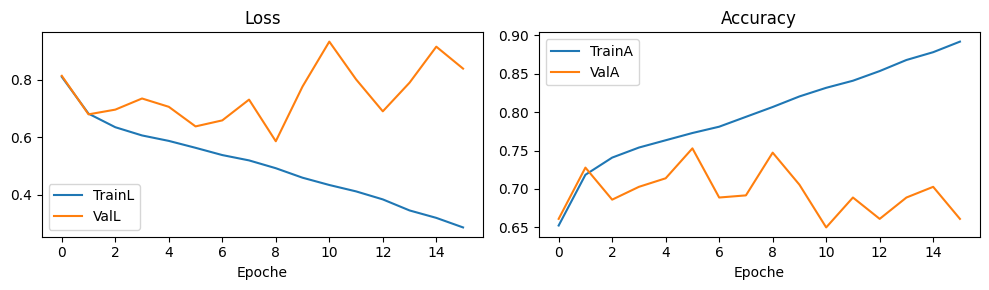


→ Fold 33/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [35]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8151 | TrainA 0.645 | ValL 0.6091 | ValA 0.728 | BestA 0.728 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6883 | TrainA 0.715 | ValL 0.5349 | ValA 0.806 | BestA 0.806 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6479 | TrainA 0.733 | ValL 0.5949 | ValA 0.803 | BestA 0.806 |   patience 1/10
Ep 04/40 | TrainL 0.6249 | TrainA 0.746 | ValL 0.4563 | ValA 0.831 | Bes

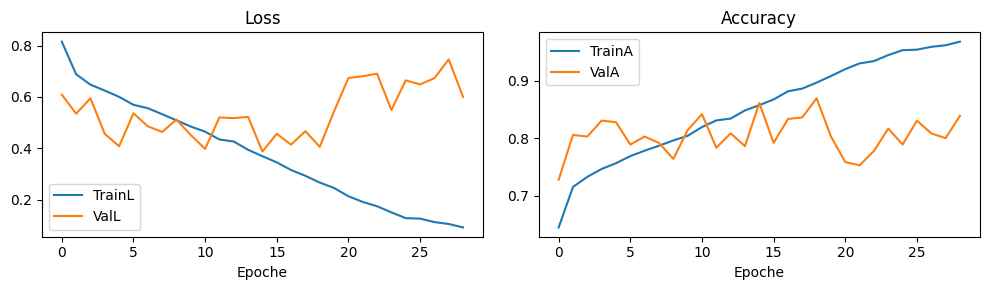


→ Fold 34/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [49]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8229 | TrainA 0.640 | ValL 0.8137 | ValA 0.639 | BestA 0.639 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6861 | TrainA 0.714 | ValL 0.6150 | ValA 0.719 | BestA 0.719 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6413 | TrainA 0.736 | ValL 0.5962 | ValA 0.733 | BestA 0.733 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6141 | TrainA 0.750 | ValL 0.5611 | ValA 0.753 | Bes

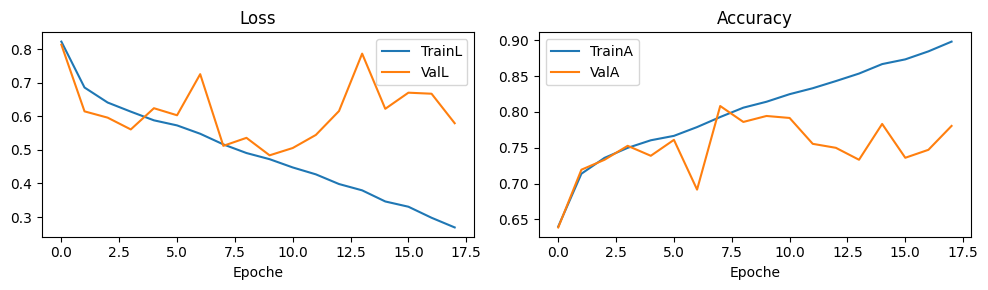


→ Fold 35/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [102]
[DEBUG] Runs [4, 8, 12] | Macro 9368 | Sub 37472 | per class {'L': 2359, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 87 | Sub 348 | per class {'L': 21, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8255 | TrainA 0.637 | ValL 0.7616 | ValA 0.678 | BestA 0.678 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6871 | TrainA 0.713 | ValL 0.6004 | ValA 0.764 | BestA 0.764 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6479 | TrainA 0.734 | ValL 0.7588 | ValA 0.655 | BestA 0.764 |   patience 1/10
Ep 04/40 | TrainL 0.6210 | TrainA 0.748 | ValL 0.7520 | ValA 0.672 | Bes

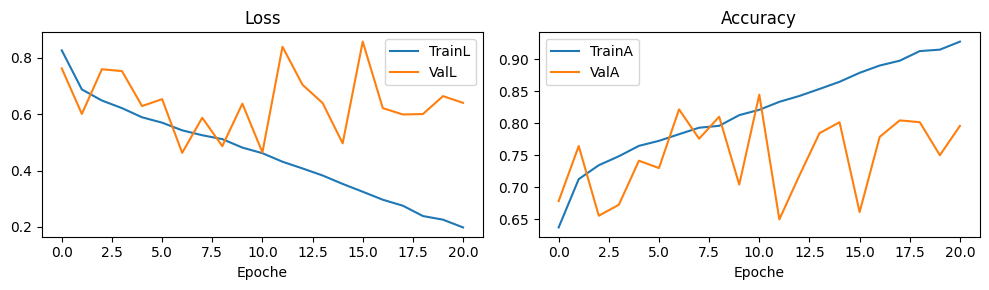


→ Fold 36/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [97]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8088 | TrainA 0.648 | ValL 0.7534 | ValA 0.717 | BestA 0.717 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6923 | TrainA 0.713 | ValL 0.6939 | ValA 0.722 | BestA 0.722 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6464 | TrainA 0.736 | ValL 0.6630 | ValA 0.739 | BestA 0.739 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6155 | TrainA 0.746 | ValL 0.6078 | ValA 0.764 | Bes

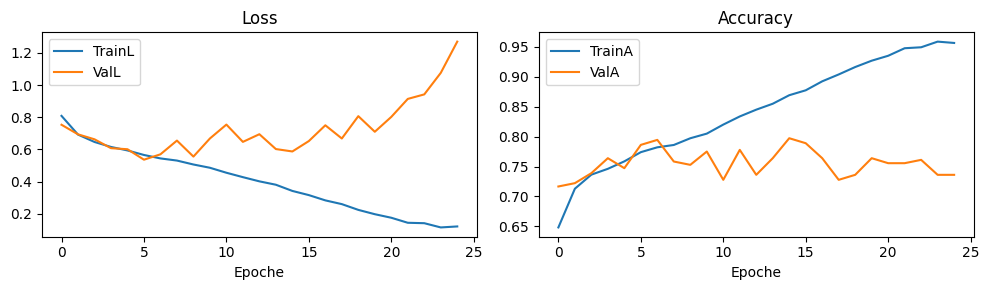


→ Fold 37/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [96]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8032 | TrainA 0.654 | ValL 0.6222 | ValA 0.717 | BestA 0.717 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6817 | TrainA 0.719 | ValL 0.6376 | ValA 0.722 | BestA 0.722 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6426 | TrainA 0.740 | ValL 0.5529 | ValA 0.750 | BestA 0.750 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6175 | TrainA 0.750 | ValL 0.5432 | ValA 0.789 | Bes

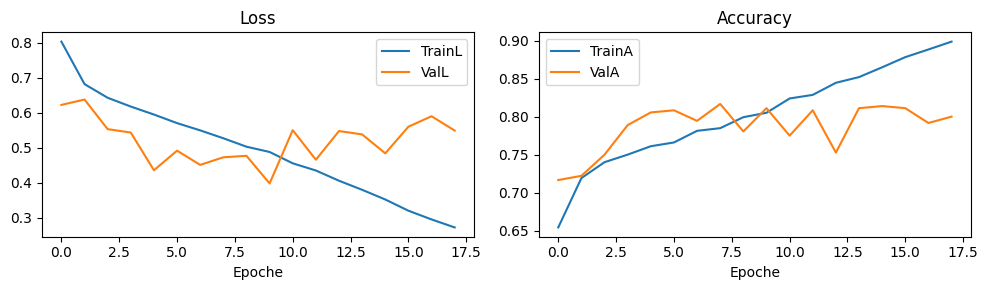


→ Fold 38/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [45]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8072 | TrainA 0.648 | ValL 0.6308 | ValA 0.731 | BestA 0.731 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6822 | TrainA 0.721 | ValL 0.6191 | ValA 0.744 | BestA 0.744 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6353 | TrainA 0.740 | ValL 0.6095 | ValA 0.747 | BestA 0.747 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6093 | TrainA 0.753 | ValL 0.5898 | ValA 0.758 | Bes

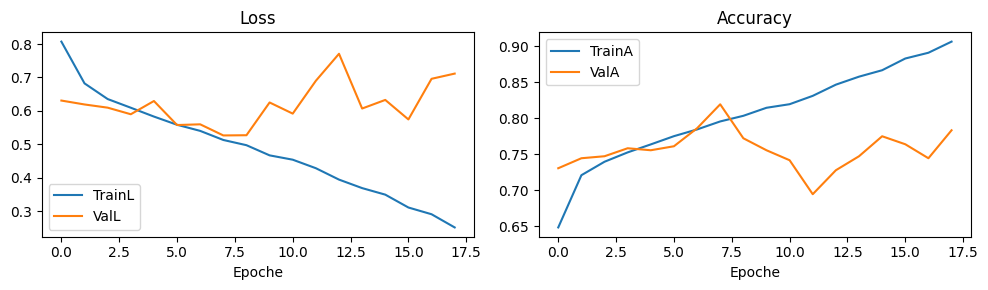


→ Fold 39/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [79]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8071 | TrainA 0.647 | ValL 0.8573 | ValA 0.619 | BestA 0.619 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6834 | TrainA 0.718 | ValL 0.9705 | ValA 0.542 | BestA 0.619 |   patience 1/10
Ep 03/40 | TrainL 0.6490 | TrainA 0.733 | ValL 0.7913 | ValA 0.628 | BestA 0.628 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6059 | TrainA 0.751 | ValL 0.8853 | ValA 0.614 | Bes

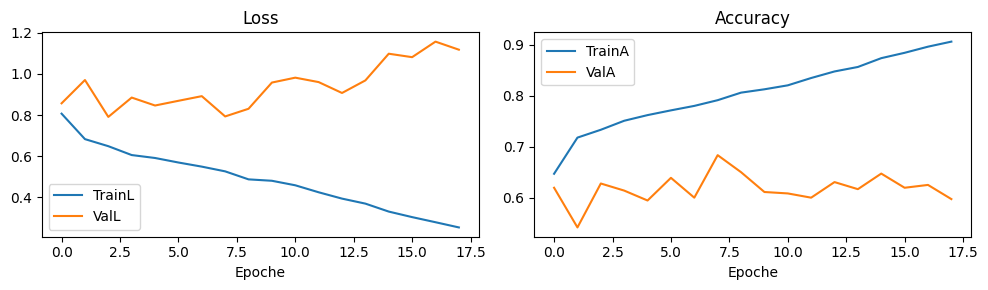


→ Fold 40/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [87]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8118 | TrainA 0.644 | ValL 1.0596 | ValA 0.556 | BestA 0.556 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6866 | TrainA 0.720 | ValL 1.0047 | ValA 0.539 | BestA 0.556 |   patience 1/10
Ep 03/40 | TrainL 0.6356 | TrainA 0.740 | ValL 0.9939 | ValA 0.567 | BestA 0.567 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6122 | TrainA 0.746 | ValL 1.1059 | ValA 0.536 | Bes

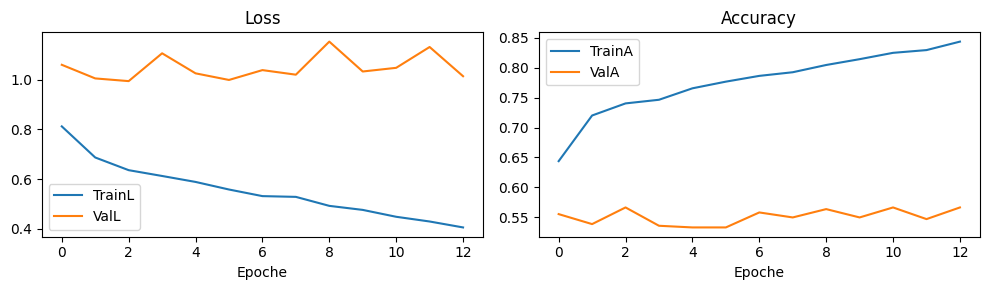


→ Fold 41/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [70]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8154 | TrainA 0.642 | ValL 0.4053 | ValA 0.914 | BestA 0.914 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6881 | TrainA 0.719 | ValL 0.2636 | ValA 0.925 | BestA 0.925 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6540 | TrainA 0.734 | ValL 0.2433 | ValA 0.953 | BestA 0.953 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6104 | TrainA 0.750 | ValL 0.1873 | ValA 0.953 | Bes

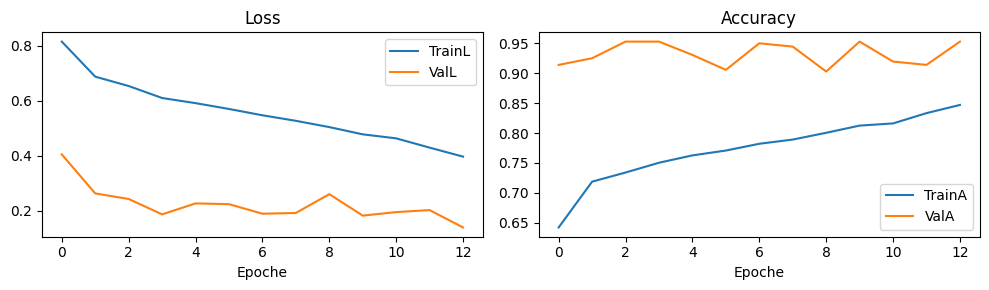


→ Fold 42/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [75]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8015 | TrainA 0.651 | ValL 1.0895 | ValA 0.461 | BestA 0.461 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6774 | TrainA 0.723 | ValL 0.9634 | ValA 0.544 | BestA 0.544 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6505 | TrainA 0.735 | ValL 1.0256 | ValA 0.519 | BestA 0.544 |   patience 1/10
Ep 04/40 | TrainL 0.6125 | TrainA 0.751 | ValL 1.1588 | ValA 0.508 | Bes

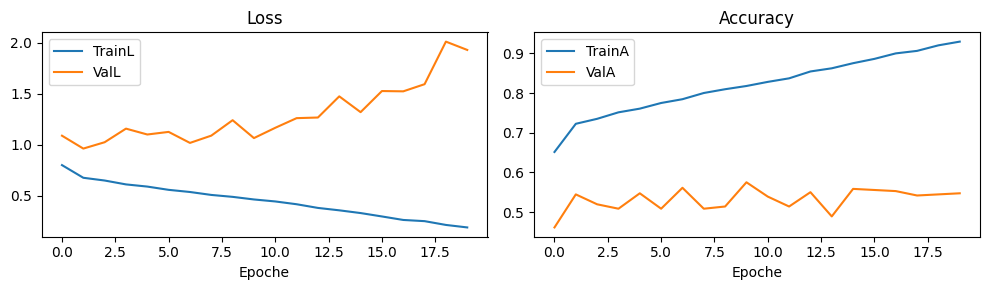


→ Fold 43/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8119 | TrainA 0.646 | ValL 0.5324 | ValA 0.797 | BestA 0.797 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6945 | TrainA 0.715 | ValL 0.4173 | ValA 0.894 | BestA 0.894 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6582 | TrainA 0.731 | ValL 0.4008 | ValA 0.822 | BestA 0.894 |   patience 1/10
Ep 04/40 | TrainL 0.6219 | TrainA 0.749 | ValL 0.3776 | ValA 0.875 | Bes

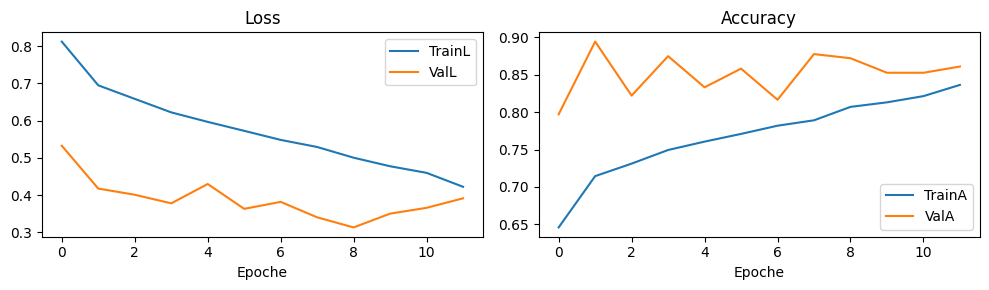


→ Fold 44/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [105]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8187 | TrainA 0.643 | ValL 0.6692 | ValA 0.692 | BestA 0.692 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6886 | TrainA 0.713 | ValL 0.6147 | ValA 0.708 | BestA 0.708 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6439 | TrainA 0.736 | ValL 0.7375 | ValA 0.650 | BestA 0.708 |   patience 1/10
Ep 04/40 | TrainL 0.6117 | TrainA 0.750 | ValL 0.6677 | ValA 0.703 | Bes

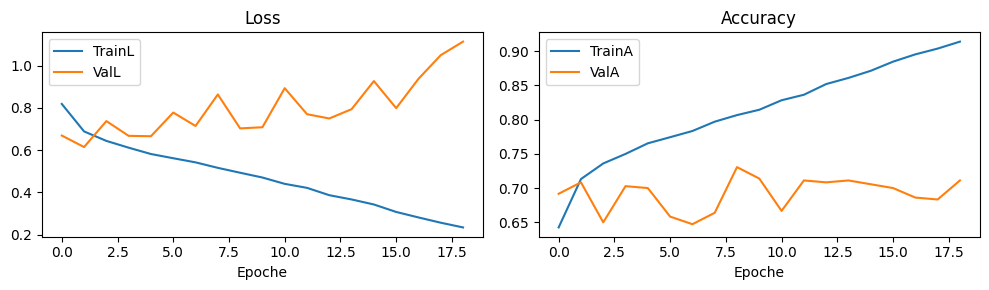


→ Fold 45/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [91]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8065 | TrainA 0.652 | ValL 0.6446 | ValA 0.708 | BestA 0.708 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6898 | TrainA 0.716 | ValL 0.4494 | ValA 0.828 | BestA 0.828 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6503 | TrainA 0.735 | ValL 0.5165 | ValA 0.786 | BestA 0.828 |   patience 1/10
Ep 04/40 | TrainL 0.6072 | TrainA 0.754 | ValL 0.5555 | ValA 0.789 | Bes

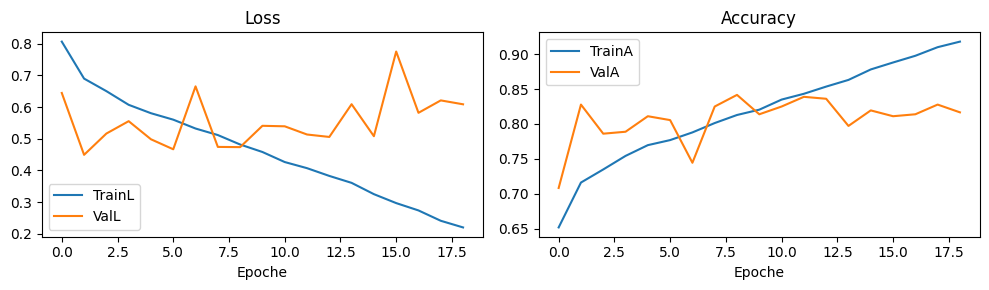


→ Fold 46/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [25]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8171 | TrainA 0.649 | ValL 0.9130 | ValA 0.614 | BestA 0.614 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6836 | TrainA 0.718 | ValL 0.8979 | ValA 0.619 | BestA 0.619 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6510 | TrainA 0.734 | ValL 0.9908 | ValA 0.639 | BestA 0.639 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6224 | TrainA 0.753 | ValL 0.8324 | ValA 0.597 | Bes

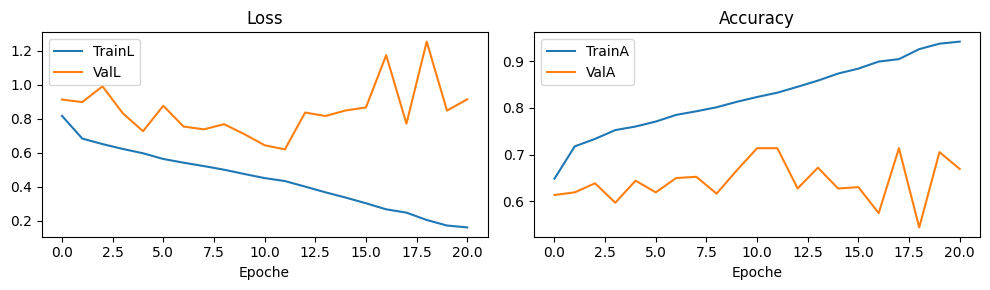


→ Fold 47/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [95]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8178 | TrainA 0.645 | ValL 0.6932 | ValA 0.733 | BestA 0.733 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6872 | TrainA 0.717 | ValL 0.5509 | ValA 0.761 | BestA 0.761 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6441 | TrainA 0.737 | ValL 0.5621 | ValA 0.789 | BestA 0.789 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6219 | TrainA 0.747 | ValL 0.5337 | ValA 0.783 | Bes

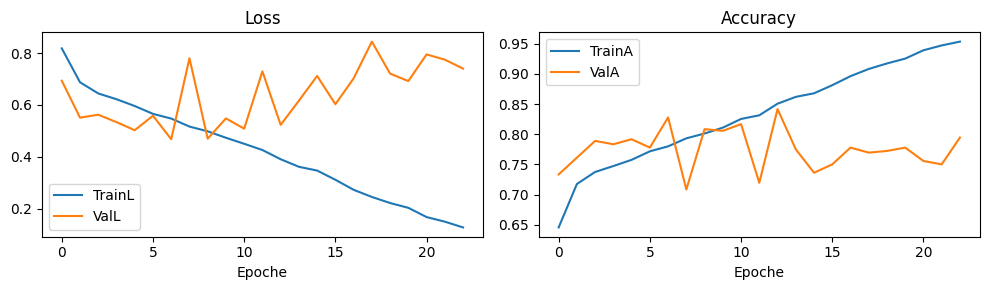


→ Fold 48/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [32]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2359, 'R': 2314, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 21, 'R': 24, '0': 45}
Ep 01/40 | TrainL 0.8168 | TrainA 0.647 | ValL 0.4052 | ValA 0.861 | BestA 0.861 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6927 | TrainA 0.716 | ValL 0.3562 | ValA 0.883 | BestA 0.883 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6495 | TrainA 0.731 | ValL 0.3146 | ValA 0.914 | BestA 0.914 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6149 | TrainA 0.751 | ValL 0.3138 | ValA 0.869 | Bes

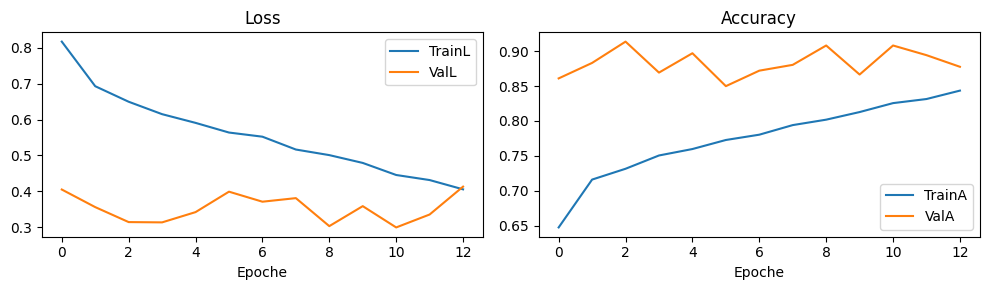


→ Fold 49/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [21]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8167 | TrainA 0.640 | ValL 1.1001 | ValA 0.525 | BestA 0.525 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6896 | TrainA 0.715 | ValL 1.1473 | ValA 0.581 | BestA 0.581 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6473 | TrainA 0.730 | ValL 1.0534 | ValA 0.564 | BestA 0.581 |   patience 1/10
Ep 04/40 | TrainL 0.6135 | TrainA 0.749 | ValL 0.9437 | ValA 0.589 | Bes

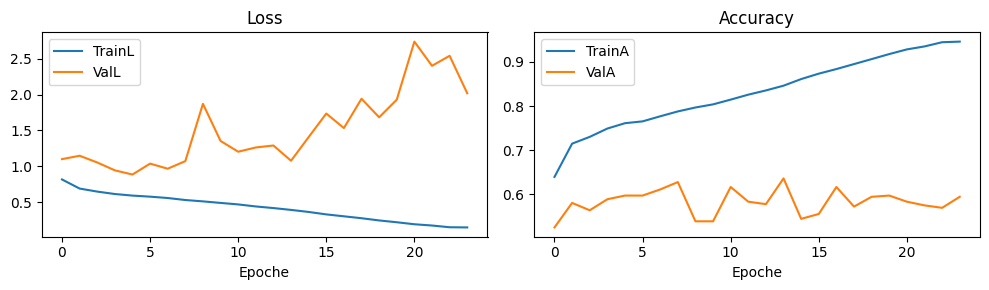


→ Fold 50/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [33]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8121 | TrainA 0.648 | ValL 0.7020 | ValA 0.700 | BestA 0.700 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6869 | TrainA 0.718 | ValL 0.5678 | ValA 0.753 | BestA 0.753 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6421 | TrainA 0.737 | ValL 0.4104 | ValA 0.833 | BestA 0.833 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6164 | TrainA 0.748 | ValL 0.5210 | ValA 0.806 | Bes

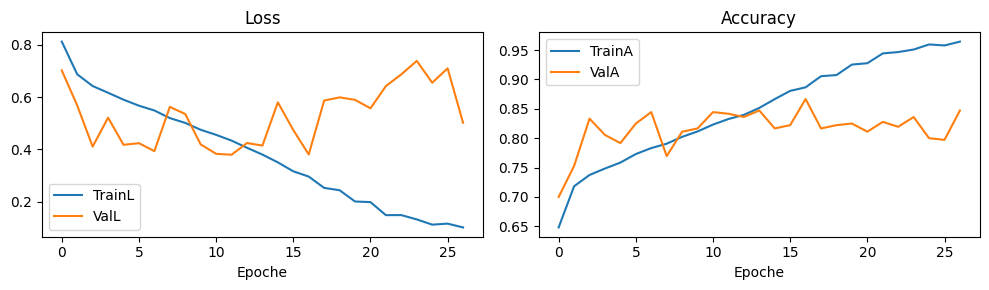


→ Fold 51/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [8]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8189 | TrainA 0.645 | ValL 0.7323 | ValA 0.681 | BestA 0.681 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6906 | TrainA 0.712 | ValL 0.4672 | ValA 0.825 | BestA 0.825 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6381 | TrainA 0.739 | ValL 0.5216 | ValA 0.761 | BestA 0.825 |   patience 1/10
Ep 04/40 | TrainL 0.6132 | TrainA 0.750 | ValL 0.4832 | ValA 0.797 | Bes

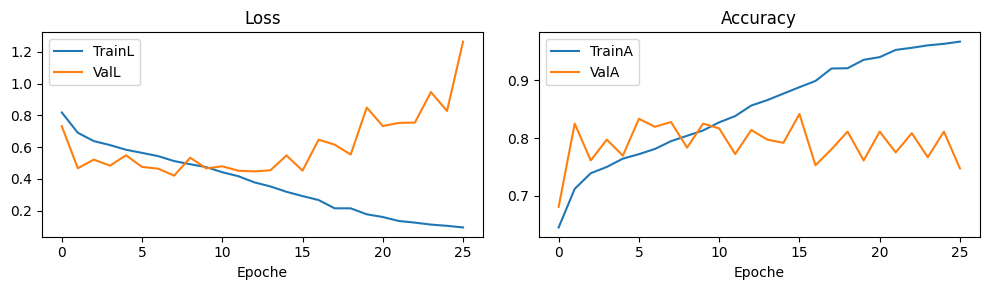


→ Fold 52/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [42]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8078 | TrainA 0.646 | ValL 0.7413 | ValA 0.686 | BestA 0.686 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6884 | TrainA 0.715 | ValL 0.8853 | ValA 0.606 | BestA 0.686 |   patience 1/10
Ep 03/40 | TrainL 0.6452 | TrainA 0.735 | ValL 0.6750 | ValA 0.700 | BestA 0.700 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6231 | TrainA 0.745 | ValL 0.6886 | ValA 0.719 | Bes

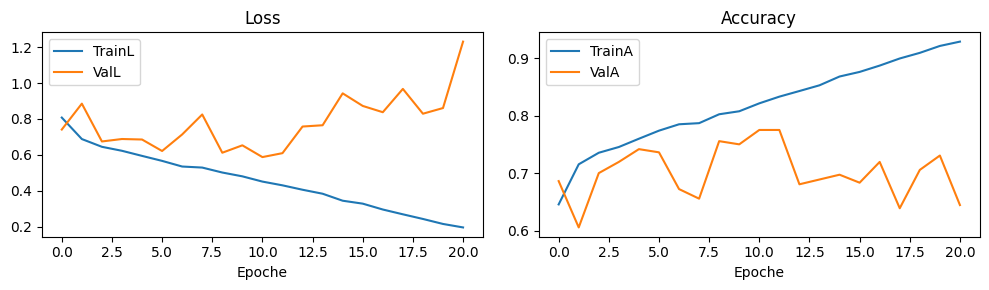


→ Fold 53/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [68]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8165 | TrainA 0.638 | ValL 0.5756 | ValA 0.786 | BestA 0.786 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6868 | TrainA 0.714 | ValL 0.5896 | ValA 0.761 | BestA 0.786 |   patience 1/10
Ep 03/40 | TrainL 0.6490 | TrainA 0.735 | ValL 0.6262 | ValA 0.722 | BestA 0.786 |   patience 2/10
Ep 04/40 | TrainL 0.6173 | TrainA 0.745 | ValL 0.6138 | ValA 0.761 | Bes

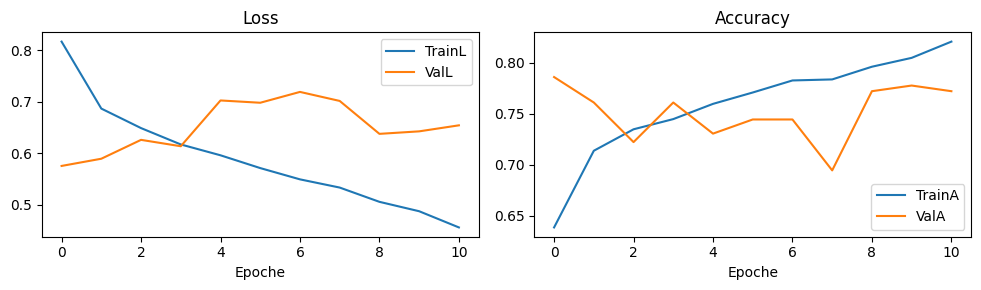


→ Fold 54/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [13]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8212 | TrainA 0.636 | ValL 0.6704 | ValA 0.681 | BestA 0.681 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6908 | TrainA 0.714 | ValL 0.8379 | ValA 0.639 | BestA 0.681 |   patience 1/10
Ep 03/40 | TrainL 0.6459 | TrainA 0.740 | ValL 0.6549 | ValA 0.689 | BestA 0.689 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6237 | TrainA 0.747 | ValL 0.6402 | ValA 0.744 | Bes

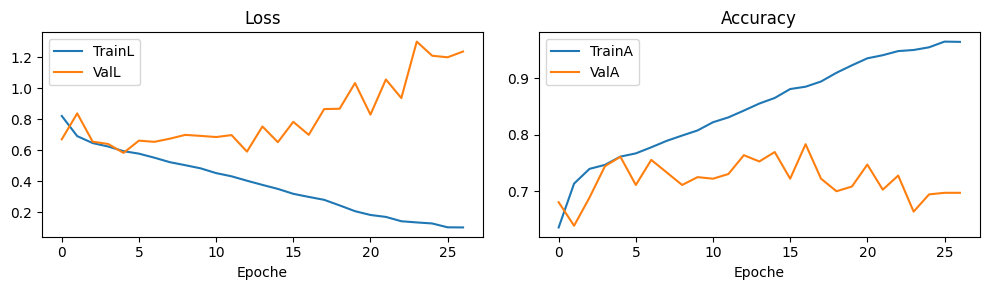


→ Fold 55/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [59]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8110 | TrainA 0.650 | ValL 0.9277 | ValA 0.592 | BestA 0.592 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6850 | TrainA 0.717 | ValL 0.9917 | ValA 0.603 | BestA 0.603 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6391 | TrainA 0.739 | ValL 0.8234 | ValA 0.636 | BestA 0.636 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6099 | TrainA 0.748 | ValL 0.8354 | ValA 0.650 | Bes

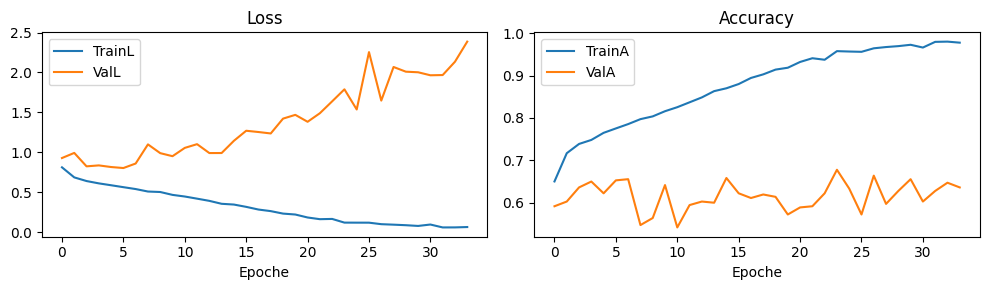


→ Fold 56/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [47]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8123 | TrainA 0.646 | ValL 1.0362 | ValA 0.592 | BestA 0.592 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6788 | TrainA 0.719 | ValL 0.8903 | ValA 0.586 | BestA 0.592 |   patience 1/10
Ep 03/40 | TrainL 0.6427 | TrainA 0.738 | ValL 1.0118 | ValA 0.578 | BestA 0.592 |   patience 2/10
Ep 04/40 | TrainL 0.6083 | TrainA 0.750 | ValL 0.8658 | ValA 0.667 | Bes

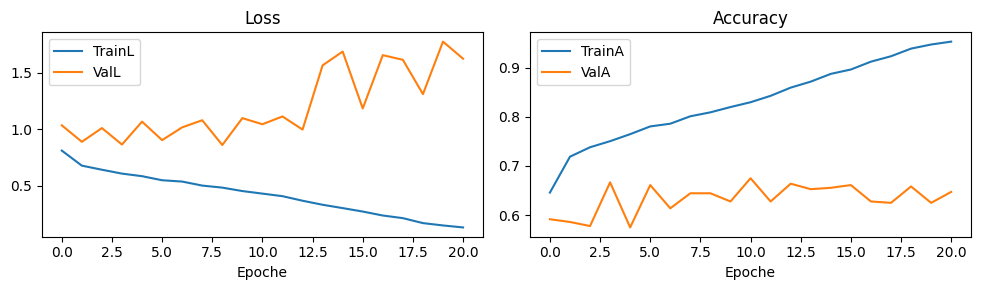


→ Fold 57/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [107]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8192 | TrainA 0.641 | ValL 0.8818 | ValA 0.639 | BestA 0.639 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6910 | TrainA 0.719 | ValL 0.9259 | ValA 0.625 | BestA 0.639 |   patience 1/10
Ep 03/40 | TrainL 0.6358 | TrainA 0.740 | ValL 0.9408 | ValA 0.603 | BestA 0.639 |   patience 2/10
Ep 04/40 | TrainL 0.6090 | TrainA 0.749 | ValL 0.8569 | ValA 0.614 | Bes

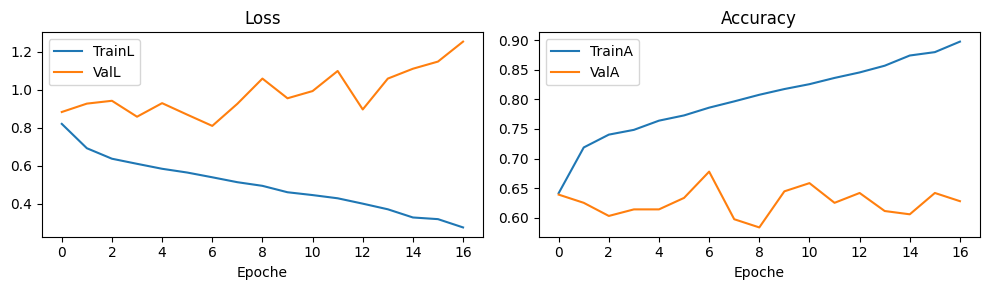


→ Fold 58/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [54]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8308 | TrainA 0.635 | ValL 0.7052 | ValA 0.697 | BestA 0.697 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6887 | TrainA 0.714 | ValL 0.5496 | ValA 0.775 | BestA 0.775 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6427 | TrainA 0.740 | ValL 0.8420 | ValA 0.694 | BestA 0.775 |   patience 1/10
Ep 04/40 | TrainL 0.6149 | TrainA 0.747 | ValL 0.5307 | ValA 0.761 | Bes

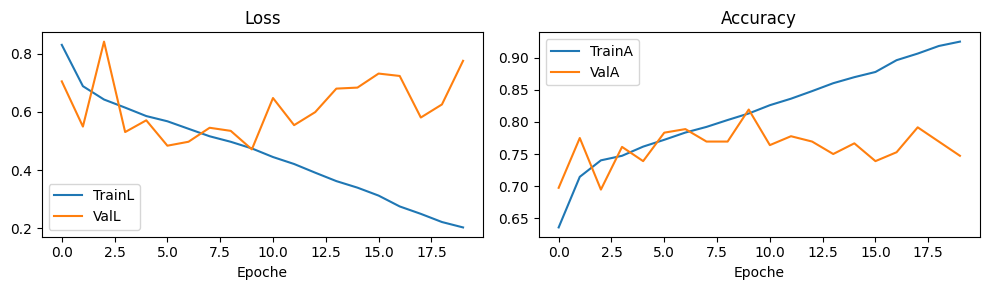


→ Fold 59/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [61]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8114 | TrainA 0.646 | ValL 0.6243 | ValA 0.767 | BestA 0.767 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6907 | TrainA 0.714 | ValL 0.8021 | ValA 0.619 | BestA 0.767 |   patience 1/10
Ep 03/40 | TrainL 0.6384 | TrainA 0.740 | ValL 0.6459 | ValA 0.722 | BestA 0.767 |   patience 2/10
Ep 04/40 | TrainL 0.6175 | TrainA 0.751 | ValL 0.5031 | ValA 0.797 | Bes

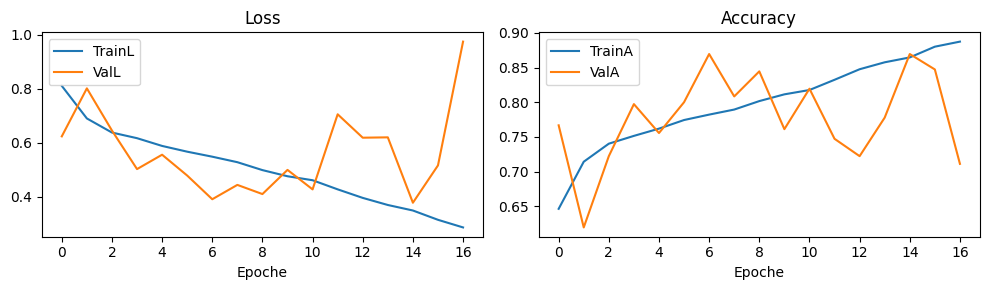


→ Fold 60/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [84]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8121 | TrainA 0.642 | ValL 1.0485 | ValA 0.511 | BestA 0.511 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6791 | TrainA 0.719 | ValL 1.2044 | ValA 0.508 | BestA 0.511 |   patience 1/10
Ep 03/40 | TrainL 0.6368 | TrainA 0.741 | ValL 1.0120 | ValA 0.561 | BestA 0.561 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6112 | TrainA 0.751 | ValL 1.1293 | ValA 0.550 | Bes

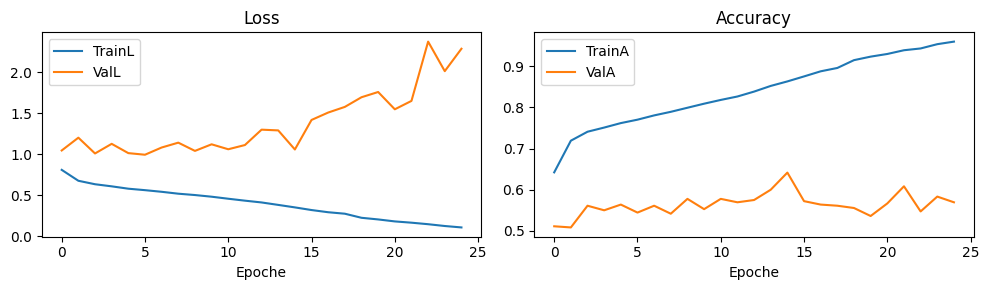


→ Fold 61/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [58]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8113 | TrainA 0.649 | ValL 0.6138 | ValA 0.694 | BestA 0.694 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6784 | TrainA 0.720 | ValL 0.6517 | ValA 0.669 | BestA 0.694 |   patience 1/10
Ep 03/40 | TrainL 0.6363 | TrainA 0.740 | ValL 0.6577 | ValA 0.647 | BestA 0.694 |   patience 2/10
Ep 04/40 | TrainL 0.6038 | TrainA 0.753 | ValL 0.5017 | ValA 0.792 | Bes

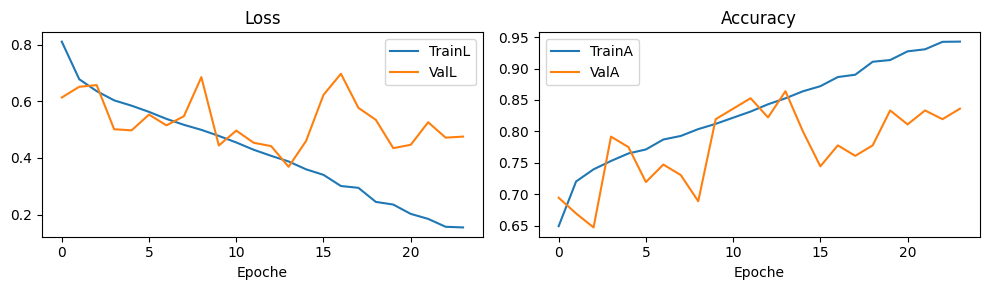


→ Fold 62/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [46]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8173 | TrainA 0.642 | ValL 0.8669 | ValA 0.653 | BestA 0.653 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6800 | TrainA 0.717 | ValL 0.8836 | ValA 0.689 | BestA 0.689 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6393 | TrainA 0.736 | ValL 0.7820 | ValA 0.692 | BestA 0.692 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6156 | TrainA 0.749 | ValL 0.8793 | ValA 0.639 | Bes

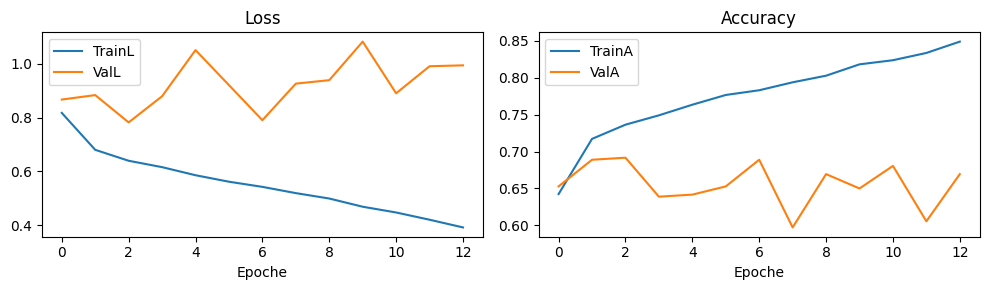


→ Fold 63/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [65]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8216 | TrainA 0.640 | ValL 0.8115 | ValA 0.658 | BestA 0.658 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6937 | TrainA 0.716 | ValL 0.5485 | ValA 0.769 | BestA 0.769 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6438 | TrainA 0.736 | ValL 0.6624 | ValA 0.758 | BestA 0.769 |   patience 1/10
Ep 04/40 | TrainL 0.6162 | TrainA 0.752 | ValL 0.6758 | ValA 0.736 | Bes

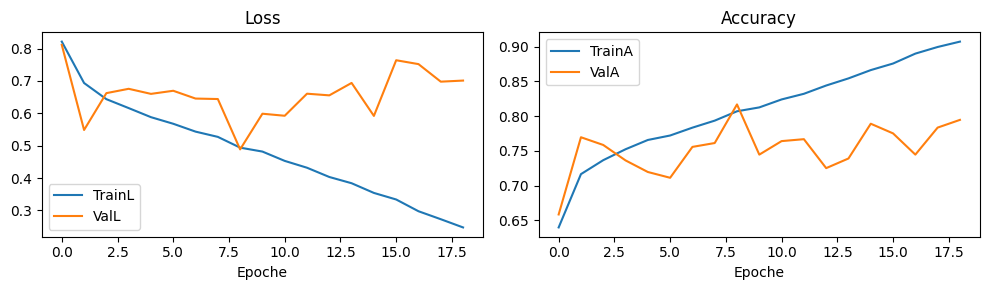


→ Fold 64/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8193 | TrainA 0.641 | ValL 1.0061 | ValA 0.594 | BestA 0.594 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6946 | TrainA 0.715 | ValL 1.1393 | ValA 0.575 | BestA 0.594 |   patience 1/10
Ep 03/40 | TrainL 0.6410 | TrainA 0.742 | ValL 0.8799 | ValA 0.661 | BestA 0.661 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6155 | TrainA 0.755 | ValL 0.6776 | ValA 0.700 | Bes

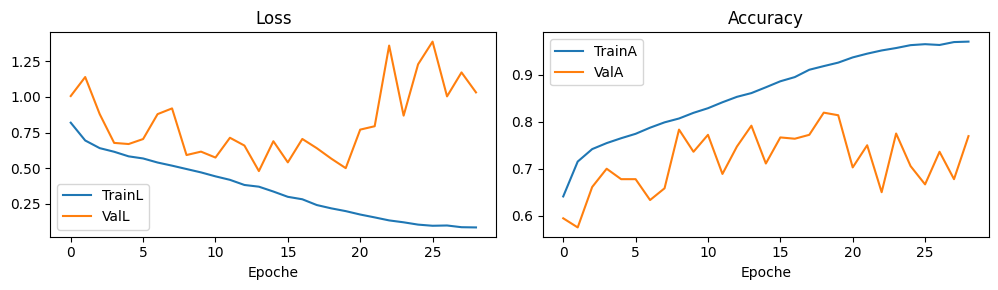


→ Fold 65/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [9]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8124 | TrainA 0.647 | ValL 0.7961 | ValA 0.628 | BestA 0.628 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6803 | TrainA 0.720 | ValL 0.8470 | ValA 0.625 | BestA 0.628 |   patience 1/10
Ep 03/40 | TrainL 0.6379 | TrainA 0.740 | ValL 0.5419 | ValA 0.786 | BestA 0.786 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6053 | TrainA 0.754 | ValL 0.9054 | ValA 0.656 | Bes

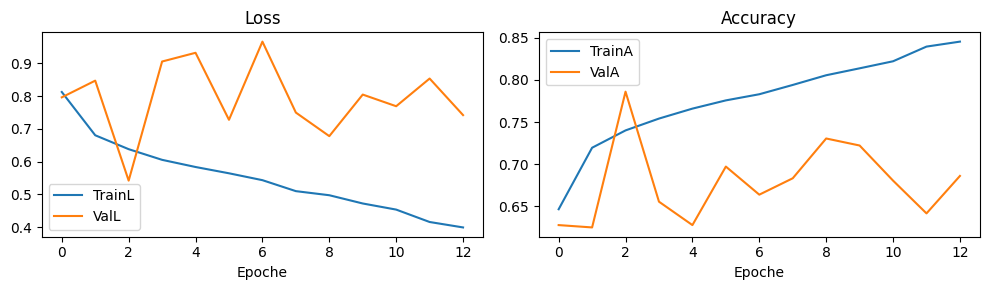


→ Fold 66/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [36]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8033 | TrainA 0.653 | ValL 0.5560 | ValA 0.783 | BestA 0.783 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6856 | TrainA 0.717 | ValL 0.6526 | ValA 0.753 | BestA 0.783 |   patience 1/10
Ep 03/40 | TrainL 0.6463 | TrainA 0.738 | ValL 0.6274 | ValA 0.711 | BestA 0.783 |   patience 2/10
Ep 04/40 | TrainL 0.6158 | TrainA 0.750 | ValL 0.5325 | ValA 0.794 | Bes

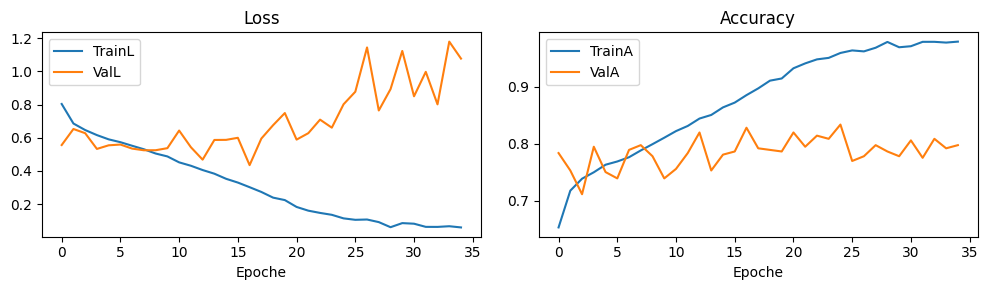


→ Fold 67/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [90]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8160 | TrainA 0.642 | ValL 0.4277 | ValA 0.844 | BestA 0.844 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6834 | TrainA 0.717 | ValL 0.3662 | ValA 0.875 | BestA 0.875 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6422 | TrainA 0.737 | ValL 0.4451 | ValA 0.833 | BestA 0.875 |   patience 1/10
Ep 04/40 | TrainL 0.6109 | TrainA 0.749 | ValL 0.3222 | ValA 0.878 | Bes

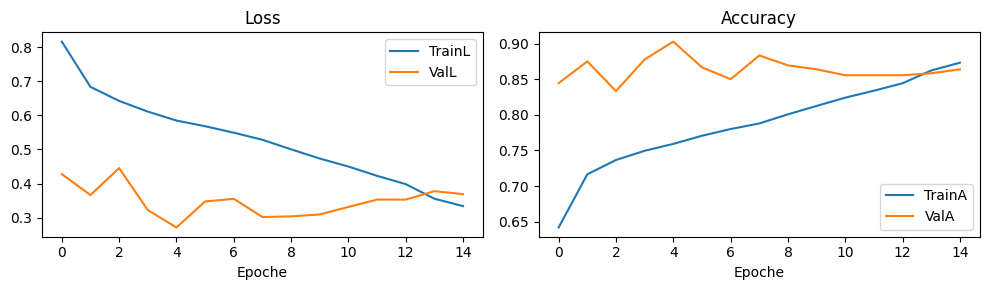


→ Fold 68/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [38]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8141 | TrainA 0.641 | ValL 1.0828 | ValA 0.500 | BestA 0.500 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6795 | TrainA 0.715 | ValL 1.1316 | ValA 0.453 | BestA 0.500 |   patience 1/10
Ep 03/40 | TrainL 0.6396 | TrainA 0.740 | ValL 1.0993 | ValA 0.500 | BestA 0.500 |   patience 2/10
Ep 04/40 | TrainL 0.6136 | TrainA 0.751 | ValL 1.0783 | ValA 0.522 | Bes

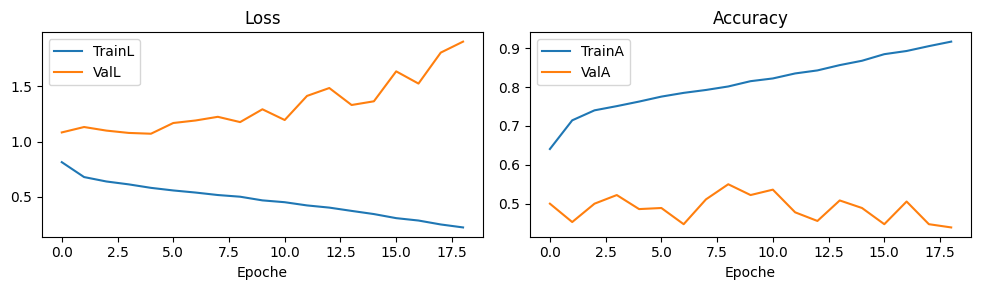


→ Fold 69/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [29]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8150 | TrainA 0.647 | ValL 0.5914 | ValA 0.764 | BestA 0.764 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6904 | TrainA 0.715 | ValL 0.9391 | ValA 0.619 | BestA 0.764 |   patience 1/10
Ep 03/40 | TrainL 0.6530 | TrainA 0.731 | ValL 0.4958 | ValA 0.825 | BestA 0.825 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6151 | TrainA 0.748 | ValL 0.5330 | ValA 0.803 | Bes

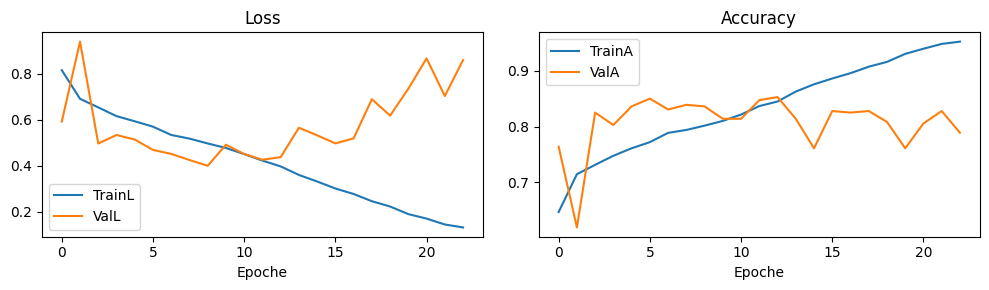


→ Fold 70/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [3]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8312 | TrainA 0.636 | ValL 0.5766 | ValA 0.750 | BestA 0.750 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6966 | TrainA 0.712 | ValL 0.6915 | ValA 0.689 | BestA 0.750 |   patience 1/10
Ep 03/40 | TrainL 0.6537 | TrainA 0.735 | ValL 0.4209 | ValA 0.850 | BestA 0.850 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6276 | TrainA 0.745 | ValL 0.5070 | ValA 0.781 | Bes

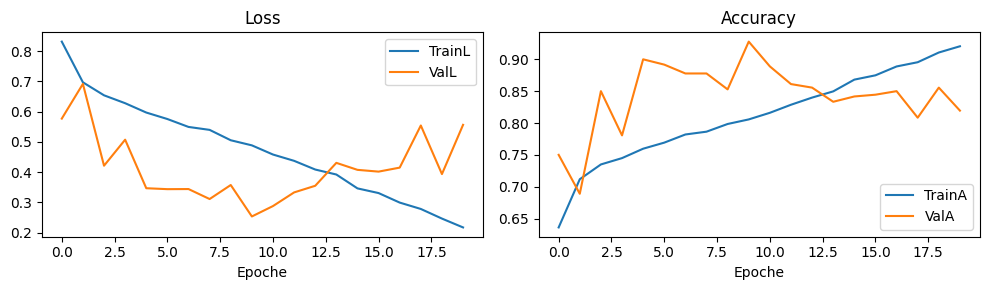


→ Fold 71/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [88]
[DEBUG] Runs [4, 8, 12] | Macro 9341 | Sub 37364 | per class {'L': 2351, 'R': 2310, '0': 4680}
[DEBUG] Runs [4, 8, 12] | Macro 114 | Sub 456 | per class {'L': 29, 'R': 28, '0': 57}
Ep 01/40 | TrainL 0.8135 | TrainA 0.649 | ValL 1.3076 | ValA 0.452 | BestA 0.452 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6854 | TrainA 0.717 | ValL 1.1299 | ValA 0.489 | BestA 0.489 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6340 | TrainA 0.743 | ValL 1.2523 | ValA 0.469 | BestA 0.489 |   patience 1/10
Ep 04/40 | TrainL 0.6139 | TrainA 0.753 | ValL 1.2579 | ValA 0.515 | Be

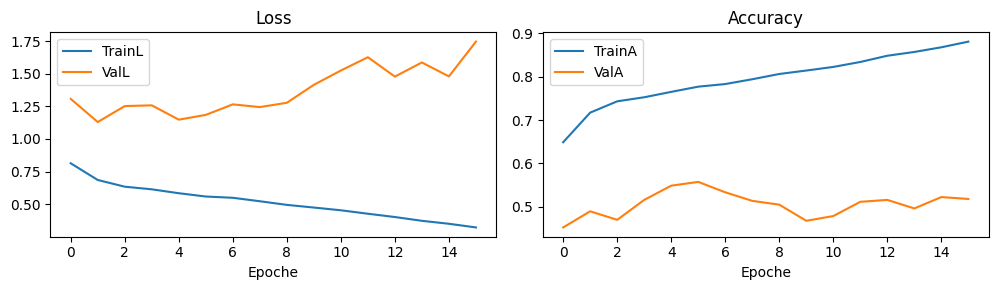


→ Fold 72/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [39]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8098 | TrainA 0.649 | ValL 0.8319 | ValA 0.625 | BestA 0.625 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6813 | TrainA 0.718 | ValL 0.9774 | ValA 0.586 | BestA 0.625 |   patience 1/10
Ep 03/40 | TrainL 0.6410 | TrainA 0.738 | ValL 0.9046 | ValA 0.625 | BestA 0.625 |   patience 2/10
Ep 04/40 | TrainL 0.6118 | TrainA 0.749 | ValL 0.9736 | ValA 0.589 | Bes

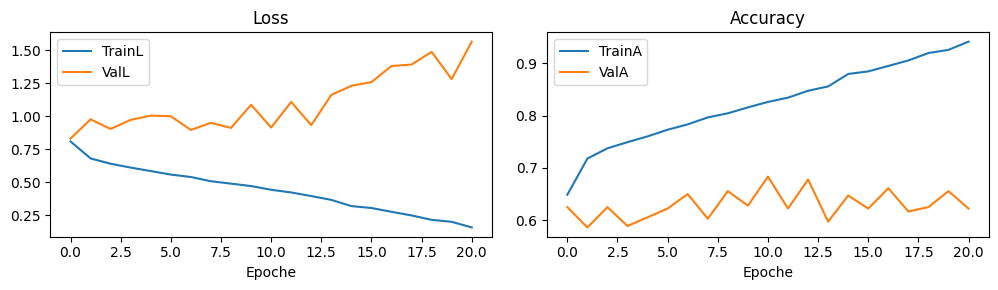


→ Fold 73/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [14]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8126 | TrainA 0.646 | ValL 0.7759 | ValA 0.750 | BestA 0.750 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6874 | TrainA 0.717 | ValL 0.6386 | ValA 0.725 | BestA 0.750 |   patience 1/10
Ep 03/40 | TrainL 0.6435 | TrainA 0.737 | ValL 0.7439 | ValA 0.714 | BestA 0.750 |   patience 2/10
Ep 04/40 | TrainL 0.6148 | TrainA 0.750 | ValL 0.6976 | ValA 0.708 | Bes

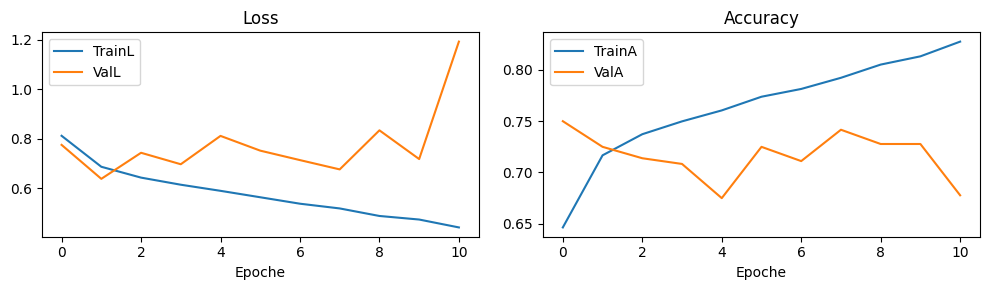


→ Fold 74/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [73]
[DEBUG] Runs [4, 8, 12] | Macro 9368 | Sub 37472 | per class {'L': 2359, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 87 | Sub 348 | per class {'L': 21, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8158 | TrainA 0.646 | ValL 0.7625 | ValA 0.670 | BestA 0.670 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6827 | TrainA 0.719 | ValL 0.7690 | ValA 0.649 | BestA 0.670 |   patience 1/10
Ep 03/40 | TrainL 0.6368 | TrainA 0.740 | ValL 0.7772 | ValA 0.655 | BestA 0.670 |   patience 2/10
Ep 04/40 | TrainL 0.6066 | TrainA 0.755 | ValL 0.6651 | ValA 0.693 | Bes

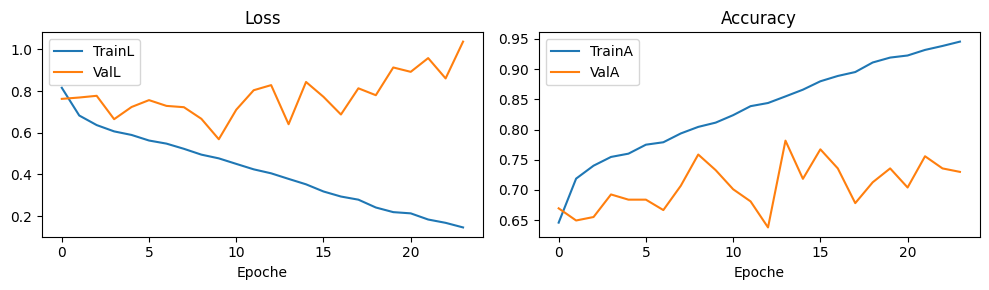


→ Fold 75/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [7]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8114 | TrainA 0.645 | ValL 0.3754 | ValA 0.861 | BestA 0.861 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6776 | TrainA 0.720 | ValL 0.3652 | ValA 0.872 | BestA 0.872 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6421 | TrainA 0.735 | ValL 0.4962 | ValA 0.781 | BestA 0.872 |   patience 1/10
Ep 04/40 | TrainL 0.6130 | TrainA 0.749 | ValL 0.3979 | ValA 0.797 | Bes

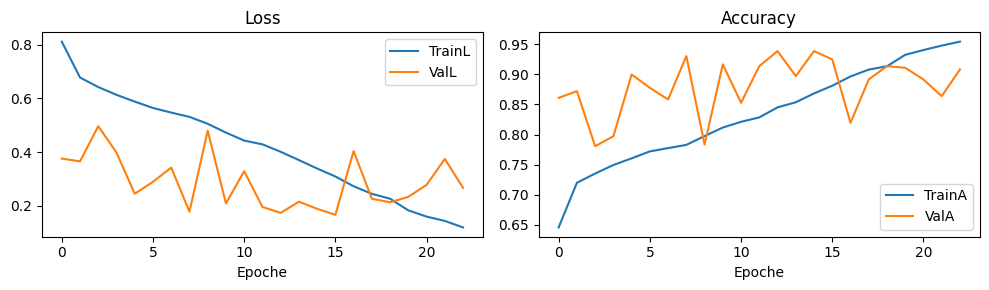


→ Fold 76/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [76]
[DEBUG] Runs [4, 8, 12] | Macro 9368 | Sub 37472 | per class {'L': 2359, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 87 | Sub 348 | per class {'L': 21, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8126 | TrainA 0.641 | ValL 0.8874 | ValA 0.649 | BestA 0.649 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6847 | TrainA 0.717 | ValL 1.0520 | ValA 0.615 | BestA 0.649 |   patience 1/10
Ep 03/40 | TrainL 0.6403 | TrainA 0.740 | ValL 0.9290 | ValA 0.661 | BestA 0.661 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6174 | TrainA 0.749 | ValL 0.9316 | ValA 0.652 | Bes

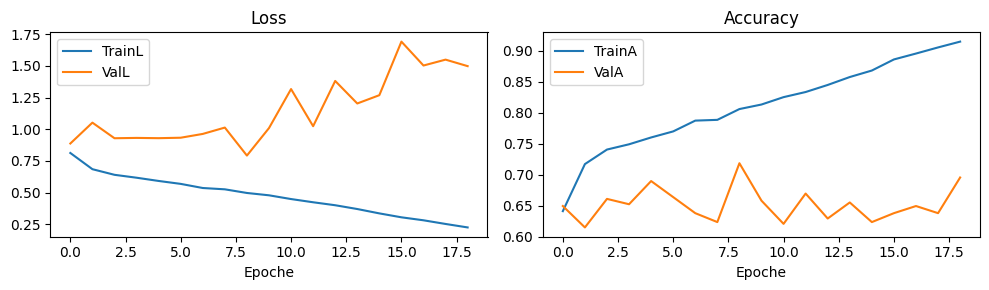


→ Fold 77/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [72]
[DEBUG] Runs [4, 8, 12] | Macro 9367 | Sub 37468 | per class {'L': 2358, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 88 | Sub 352 | per class {'L': 22, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8058 | TrainA 0.647 | ValL 0.7705 | ValA 0.693 | BestA 0.693 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6864 | TrainA 0.715 | ValL 0.7027 | ValA 0.699 | BestA 0.699 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6425 | TrainA 0.734 | ValL 0.7068 | ValA 0.690 | BestA 0.699 |   patience 1/10
Ep 04/40 | TrainL 0.6091 | TrainA 0.751 | ValL 0.5752 | ValA 0.764 | Bes

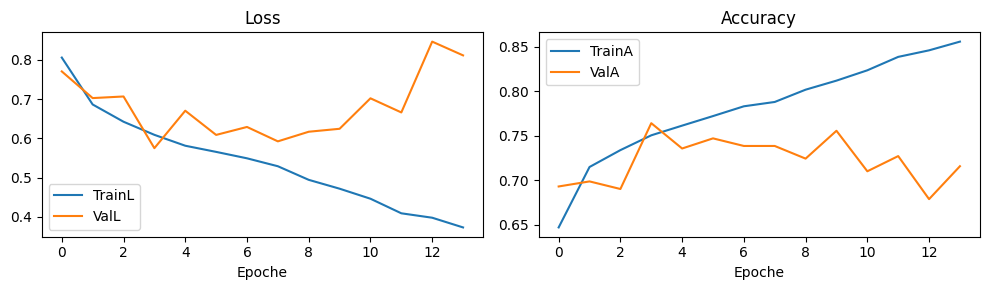


→ Fold 78/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [77]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2359, 'R': 2314, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 21, 'R': 24, '0': 45}
Ep 01/40 | TrainL 0.8195 | TrainA 0.644 | ValL 0.7687 | ValA 0.664 | BestA 0.664 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6817 | TrainA 0.719 | ValL 0.5557 | ValA 0.786 | BestA 0.786 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6407 | TrainA 0.740 | ValL 0.6544 | ValA 0.756 | BestA 0.786 |   patience 1/10
Ep 04/40 | TrainL 0.6158 | TrainA 0.751 | ValL 0.6076 | ValA 0.728 | Bes

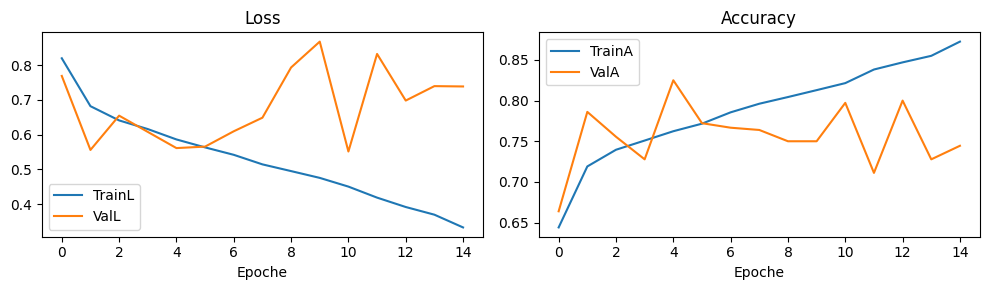


→ Fold 79/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [66]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8065 | TrainA 0.651 | ValL 0.9543 | ValA 0.625 | BestA 0.625 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6936 | TrainA 0.716 | ValL 0.8506 | ValA 0.647 | BestA 0.647 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6415 | TrainA 0.737 | ValL 0.8718 | ValA 0.642 | BestA 0.647 |   patience 1/10
Ep 04/40 | TrainL 0.6089 | TrainA 0.755 | ValL 0.8449 | ValA 0.617 | Bes

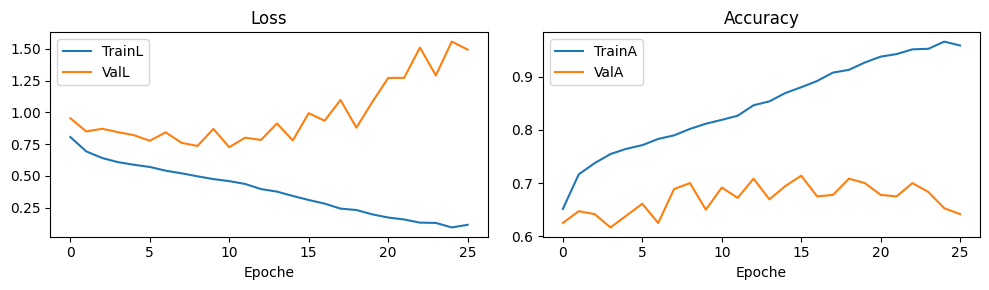


→ Fold 80/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [94]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8078 | TrainA 0.649 | ValL 0.7716 | ValA 0.636 | BestA 0.636 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6873 | TrainA 0.719 | ValL 0.5447 | ValA 0.789 | BestA 0.789 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6386 | TrainA 0.736 | ValL 0.5496 | ValA 0.803 | BestA 0.803 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6037 | TrainA 0.756 | ValL 0.6614 | ValA 0.733 | Bes

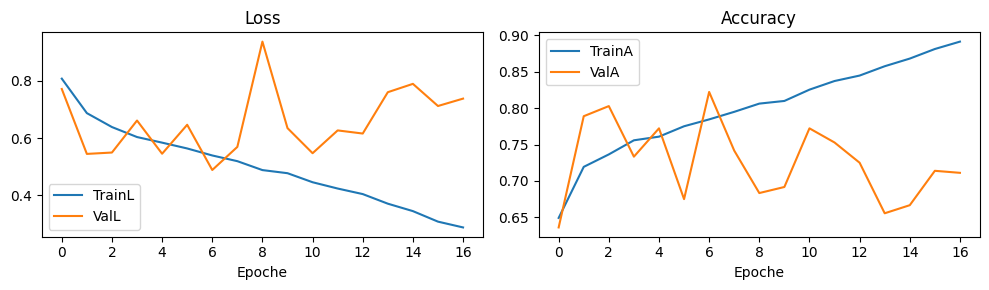


→ Fold 81/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [81]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8113 | TrainA 0.646 | ValL 0.8525 | ValA 0.653 | BestA 0.653 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6895 | TrainA 0.712 | ValL 0.6673 | ValA 0.733 | BestA 0.733 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6480 | TrainA 0.736 | ValL 0.5315 | ValA 0.806 | BestA 0.806 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6199 | TrainA 0.749 | ValL 0.5152 | ValA 0.842 | Bes

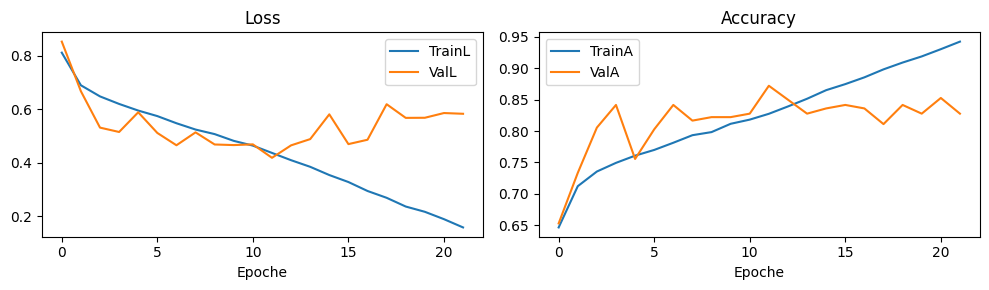


→ Fold 82/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [80]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8152 | TrainA 0.644 | ValL 0.9717 | ValA 0.556 | BestA 0.556 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6787 | TrainA 0.722 | ValL 0.8652 | ValA 0.628 | BestA 0.628 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6386 | TrainA 0.736 | ValL 1.0191 | ValA 0.569 | BestA 0.628 |   patience 1/10
Ep 04/40 | TrainL 0.6062 | TrainA 0.755 | ValL 0.8510 | ValA 0.642 | Bes

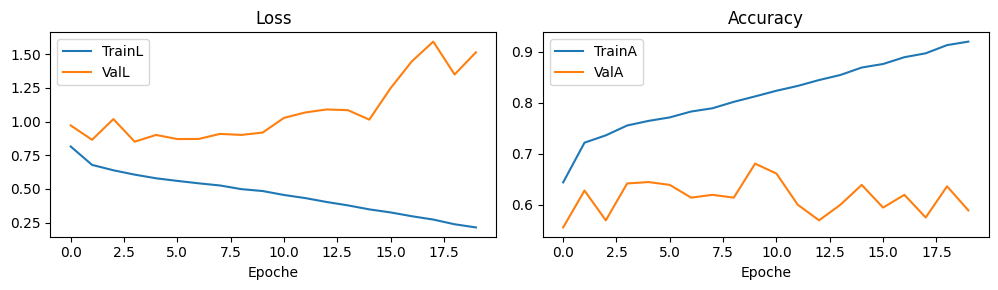


→ Fold 83/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [109]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8129 | TrainA 0.648 | ValL 1.2926 | ValA 0.567 | BestA 0.567 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6852 | TrainA 0.717 | ValL 0.9943 | ValA 0.594 | BestA 0.594 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6519 | TrainA 0.730 | ValL 0.9090 | ValA 0.611 | BestA 0.611 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6216 | TrainA 0.747 | ValL 0.9071 | ValA 0.611 | Bes

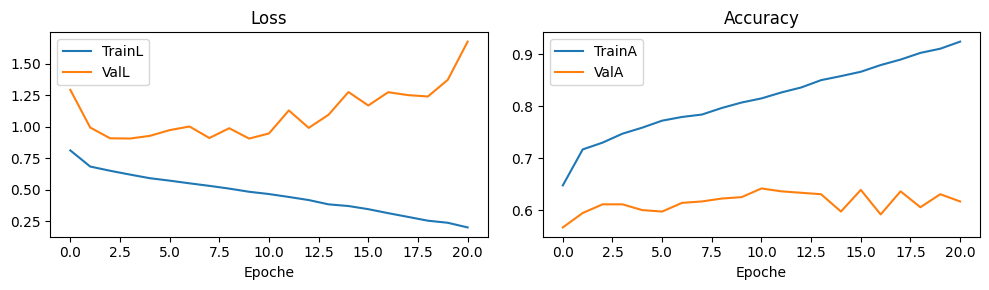


→ Fold 84/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [17]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8188 | TrainA 0.645 | ValL 0.5900 | ValA 0.803 | BestA 0.803 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6864 | TrainA 0.714 | ValL 0.5614 | ValA 0.789 | BestA 0.803 |   patience 1/10
Ep 03/40 | TrainL 0.6400 | TrainA 0.738 | ValL 0.5501 | ValA 0.778 | BestA 0.803 |   patience 2/10
Ep 04/40 | TrainL 0.6163 | TrainA 0.750 | ValL 0.5903 | ValA 0.783 | Bes

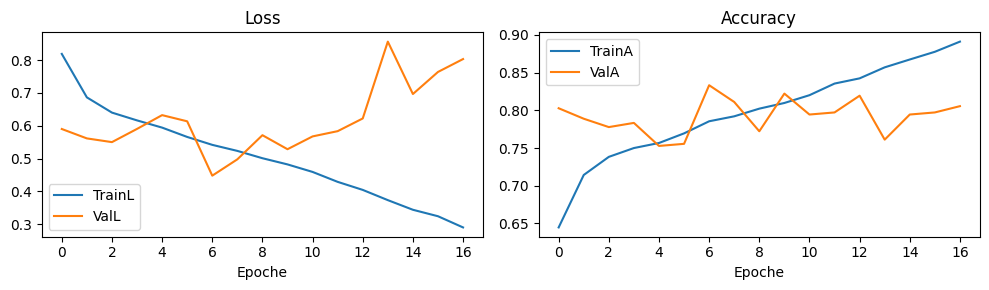


→ Fold 85/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [22]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8169 | TrainA 0.644 | ValL 0.2835 | ValA 0.956 | BestA 0.956 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6852 | TrainA 0.716 | ValL 0.3039 | ValA 0.889 | BestA 0.956 |   patience 1/10
Ep 03/40 | TrainL 0.6410 | TrainA 0.739 | ValL 0.2321 | ValA 0.942 | BestA 0.956 |   patience 2/10
Ep 04/40 | TrainL 0.6180 | TrainA 0.746 | ValL 0.1767 | ValA 0.944 | Bes

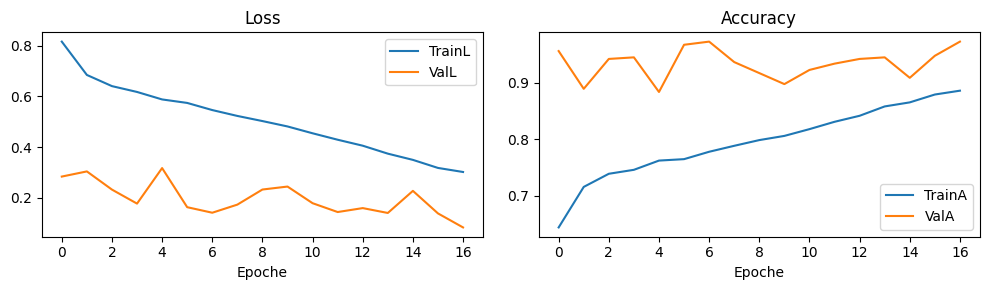


→ Fold 86/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [53]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8226 | TrainA 0.643 | ValL 0.5664 | ValA 0.783 | BestA 0.783 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6859 | TrainA 0.718 | ValL 0.5388 | ValA 0.772 | BestA 0.783 |   patience 1/10
Ep 03/40 | TrainL 0.6467 | TrainA 0.740 | ValL 0.4819 | ValA 0.811 | BestA 0.811 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6234 | TrainA 0.747 | ValL 0.5137 | ValA 0.800 | Bes

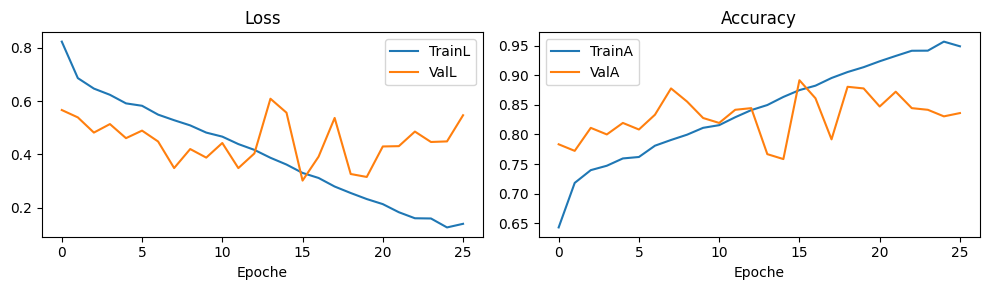


→ Fold 87/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [2]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8255 | TrainA 0.638 | ValL 0.6301 | ValA 0.744 | BestA 0.744 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6868 | TrainA 0.716 | ValL 0.8342 | ValA 0.661 | BestA 0.744 |   patience 1/10
Ep 03/40 | TrainL 0.6414 | TrainA 0.737 | ValL 0.5993 | ValA 0.767 | BestA 0.767 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6111 | TrainA 0.751 | ValL 0.7425 | ValA 0.703 | Bes

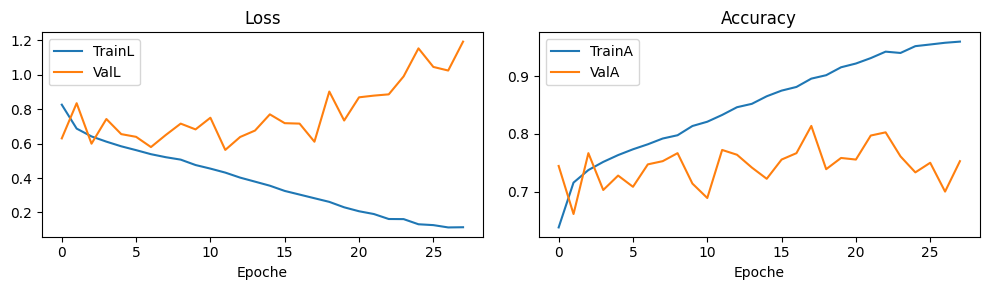


→ Fold 88/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [82]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8080 | TrainA 0.649 | ValL 0.6394 | ValA 0.736 | BestA 0.736 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6858 | TrainA 0.715 | ValL 0.4833 | ValA 0.811 | BestA 0.811 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6361 | TrainA 0.737 | ValL 0.4954 | ValA 0.831 | BestA 0.831 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6085 | TrainA 0.754 | ValL 0.4313 | ValA 0.814 | Bes

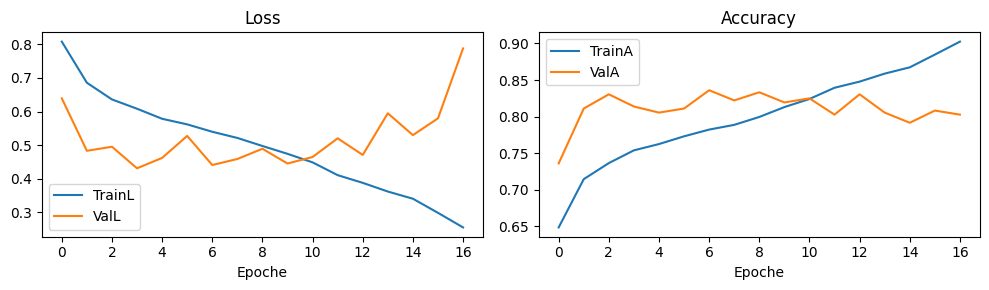


→ Fold 89/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [31]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8163 | TrainA 0.642 | ValL 0.6619 | ValA 0.714 | BestA 0.714 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6820 | TrainA 0.718 | ValL 0.6222 | ValA 0.753 | BestA 0.753 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6386 | TrainA 0.740 | ValL 0.6061 | ValA 0.747 | BestA 0.753 |   patience 1/10
Ep 04/40 | TrainL 0.6134 | TrainA 0.752 | ValL 0.5826 | ValA 0.783 | Bes

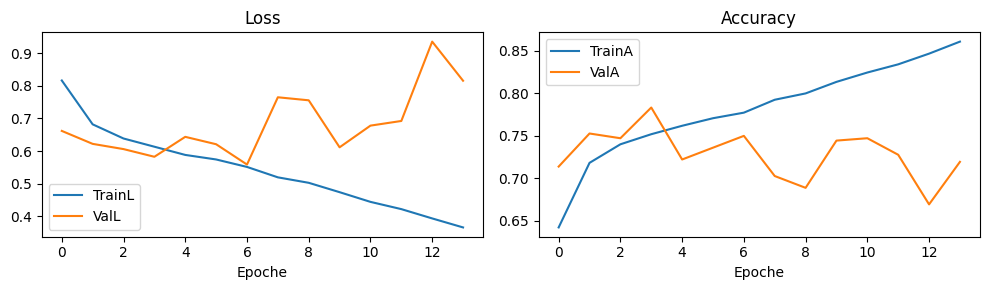


→ Fold 90/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [98]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8140 | TrainA 0.643 | ValL 0.7961 | ValA 0.628 | BestA 0.628 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6845 | TrainA 0.713 | ValL 0.7392 | ValA 0.722 | BestA 0.722 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6446 | TrainA 0.733 | ValL 0.7573 | ValA 0.703 | BestA 0.722 |   patience 1/10
Ep 04/40 | TrainL 0.6136 | TrainA 0.751 | ValL 0.7561 | ValA 0.697 | Bes

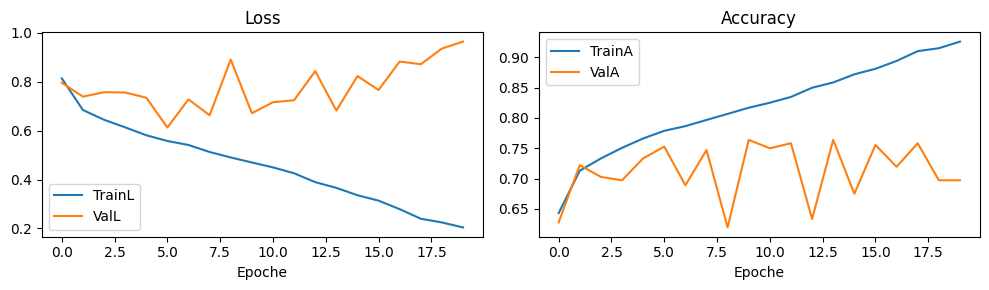


→ Fold 91/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [50]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8121 | TrainA 0.645 | ValL 0.9651 | ValA 0.561 | BestA 0.561 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6903 | TrainA 0.714 | ValL 0.7018 | ValA 0.678 | BestA 0.678 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6445 | TrainA 0.733 | ValL 0.6608 | ValA 0.708 | BestA 0.708 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6167 | TrainA 0.748 | ValL 0.6156 | ValA 0.753 | Bes

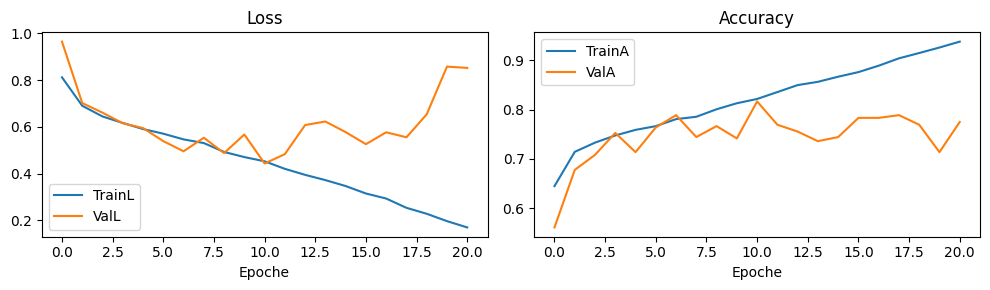


→ Fold 92/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [106]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8151 | TrainA 0.646 | ValL 0.7476 | ValA 0.672 | BestA 0.672 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6821 | TrainA 0.717 | ValL 0.8153 | ValA 0.606 | BestA 0.672 |   patience 1/10
Ep 03/40 | TrainL 0.6469 | TrainA 0.734 | ValL 0.7058 | ValA 0.692 | BestA 0.692 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6168 | TrainA 0.748 | ValL 0.7950 | ValA 0.639 | Bes

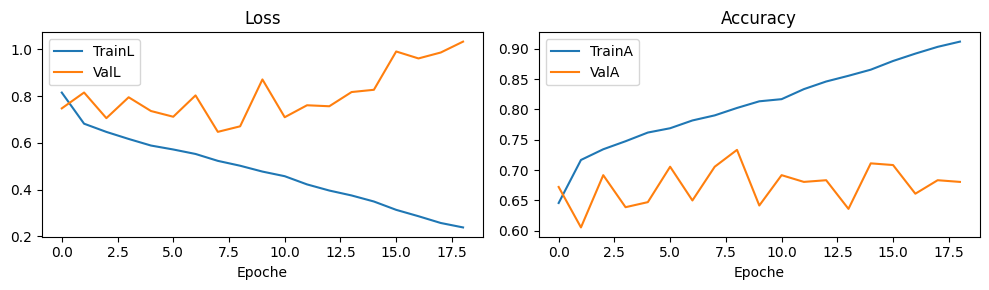


→ Fold 93/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [24]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8045 | TrainA 0.652 | ValL 1.0781 | ValA 0.572 | BestA 0.572 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6735 | TrainA 0.726 | ValL 0.9195 | ValA 0.567 | BestA 0.572 |   patience 1/10
Ep 03/40 | TrainL 0.6358 | TrainA 0.741 | ValL 0.9378 | ValA 0.547 | BestA 0.572 |   patience 2/10
Ep 04/40 | TrainL 0.6076 | TrainA 0.752 | ValL 0.9947 | ValA 0.569 | Bes

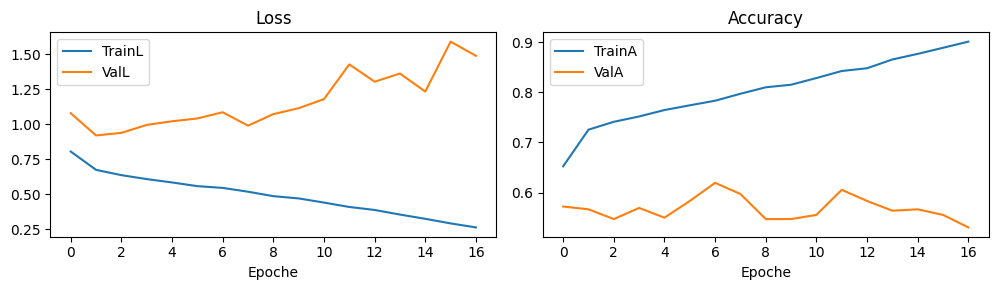


→ Fold 94/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [86]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2358, 'R': 2315, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 22, 'R': 23, '0': 45}
Ep 01/40 | TrainL 0.8198 | TrainA 0.644 | ValL 0.4291 | ValA 0.811 | BestA 0.811 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6784 | TrainA 0.721 | ValL 0.4003 | ValA 0.842 | BestA 0.842 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6404 | TrainA 0.737 | ValL 0.3155 | ValA 0.861 | BestA 0.861 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6131 | TrainA 0.753 | ValL 0.3981 | ValA 0.850 | Bes

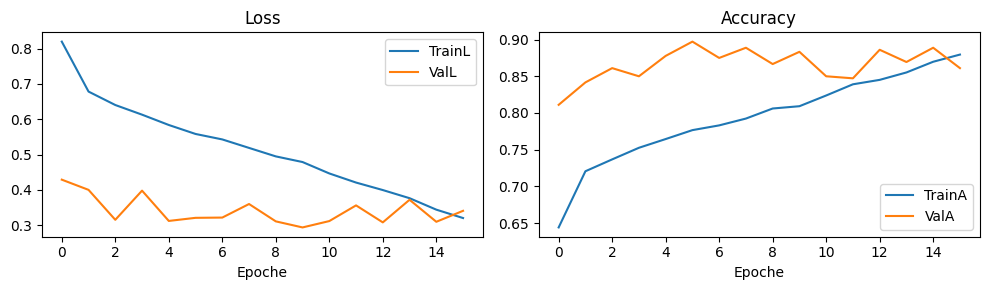


→ Fold 95/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [12]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2359, 'R': 2314, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 21, 'R': 24, '0': 45}
Ep 01/40 | TrainL 0.8124 | TrainA 0.641 | ValL 0.8274 | ValA 0.647 | BestA 0.647 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6949 | TrainA 0.713 | ValL 0.6595 | ValA 0.706 | BestA 0.706 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6494 | TrainA 0.736 | ValL 0.6046 | ValA 0.744 | BestA 0.744 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6217 | TrainA 0.747 | ValL 0.5885 | ValA 0.742 | Bes

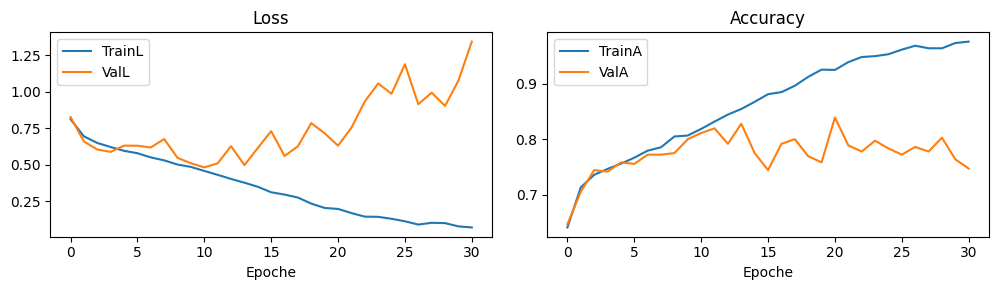


→ Fold 96/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [6]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8248 | TrainA 0.639 | ValL 0.5229 | ValA 0.803 | BestA 0.803 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6856 | TrainA 0.714 | ValL 0.6103 | ValA 0.750 | BestA 0.803 |   patience 1/10
Ep 03/40 | TrainL 0.6440 | TrainA 0.736 | ValL 0.4951 | ValA 0.814 | BestA 0.814 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6176 | TrainA 0.747 | ValL 0.4673 | ValA 0.825 | Bes

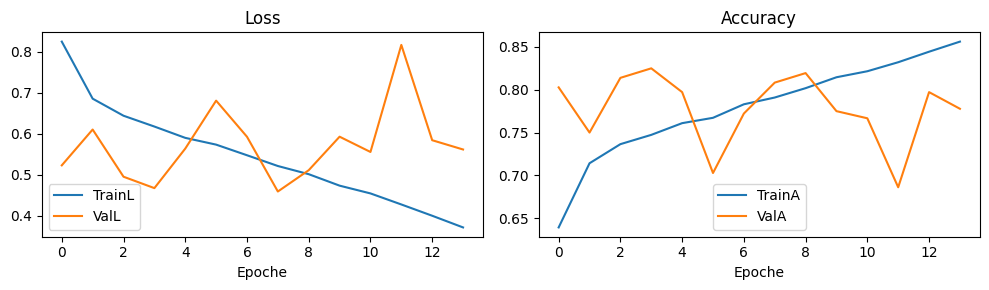


→ Fold 97/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 60, 62, 30, 34, 20, 74, 37, 40] | Test [43]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8007 | TrainA 0.651 | ValL 0.5884 | ValA 0.739 | BestA 0.739 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6804 | TrainA 0.721 | ValL 0.5168 | ValA 0.772 | BestA 0.772 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6463 | TrainA 0.738 | ValL 0.6026 | ValA 0.717 | BestA 0.772 |   patience 1/10
Ep 04/40 | TrainL 0.6205 | TrainA 0.752 | ValL 0.4877 | ValA 0.786 | Bes

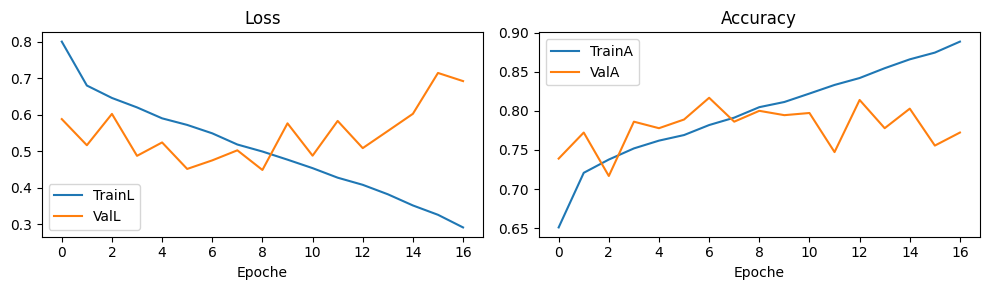


→ Fold 98/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 62, 30, 34, 20, 74, 37, 40] | Test [60]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8109 | TrainA 0.647 | ValL 0.8158 | ValA 0.664 | BestA 0.664 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6927 | TrainA 0.712 | ValL 0.4468 | ValA 0.858 | BestA 0.858 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6461 | TrainA 0.735 | ValL 0.4143 | ValA 0.856 | BestA 0.858 |   patience 1/10
Ep 04/40 | TrainL 0.6206 | TrainA 0.749 | ValL 0.3881 | ValA 0.839 | Bes

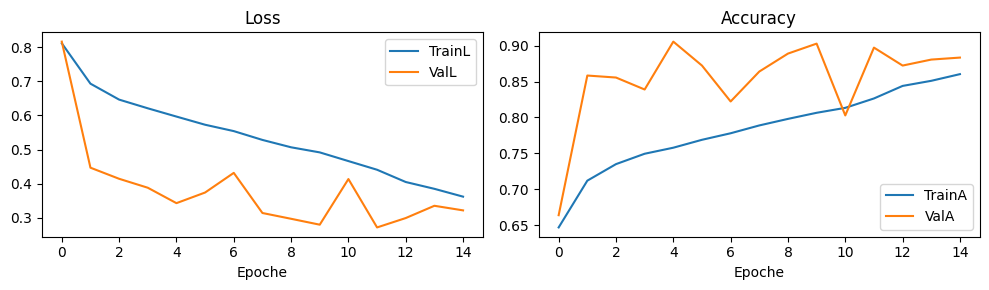


→ Fold 99/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 30, 34, 20, 74, 37, 40] | Test [62]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8163 | TrainA 0.648 | ValL 0.5854 | ValA 0.772 | BestA 0.772 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6929 | TrainA 0.713 | ValL 0.7357 | ValA 0.672 | BestA 0.772 |   patience 1/10
Ep 03/40 | TrainL 0.6460 | TrainA 0.732 | ValL 0.4539 | ValA 0.847 | BestA 0.847 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6173 | TrainA 0.747 | ValL 0.4327 | ValA 0.853 | Bes

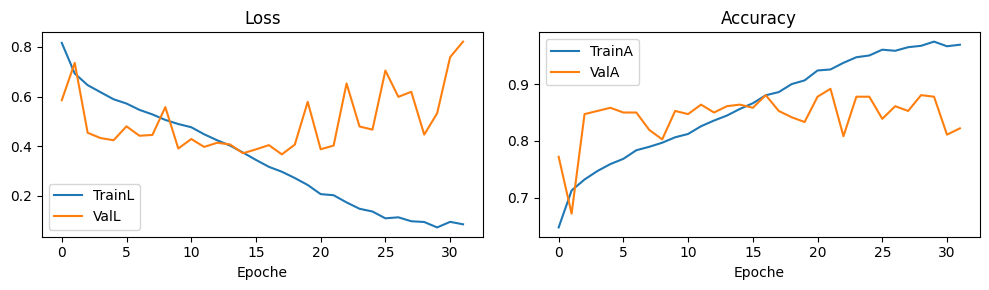


→ Fold 100/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 34, 20, 74, 37, 40] | Test [30]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2356, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 24, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8054 | TrainA 0.651 | ValL 0.9099 | ValA 0.575 | BestA 0.575 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6855 | TrainA 0.716 | ValL 0.6894 | ValA 0.719 | BestA 0.719 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6446 | TrainA 0.736 | ValL 0.8309 | ValA 0.639 | BestA 0.719 |   patience 1/10
Ep 04/40 | TrainL 0.6219 | TrainA 0.749 | ValL 0.5139 | ValA 0.803 | Be

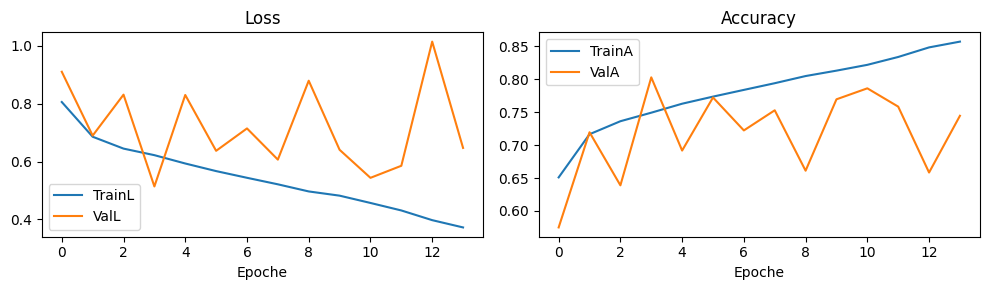


→ Fold 101/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 20, 74, 37, 40] | Test [34]
[DEBUG] Runs [4, 8, 12] | Macro 9367 | Sub 37468 | per class {'L': 2359, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 88 | Sub 352 | per class {'L': 21, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8262 | TrainA 0.635 | ValL 0.7276 | ValA 0.656 | BestA 0.656 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6869 | TrainA 0.715 | ValL 0.6852 | ValA 0.702 | BestA 0.702 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6526 | TrainA 0.733 | ValL 0.6315 | ValA 0.736 | BestA 0.736 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6173 | TrainA 0.746 | ValL 0.6292 | ValA 0.716 | Be

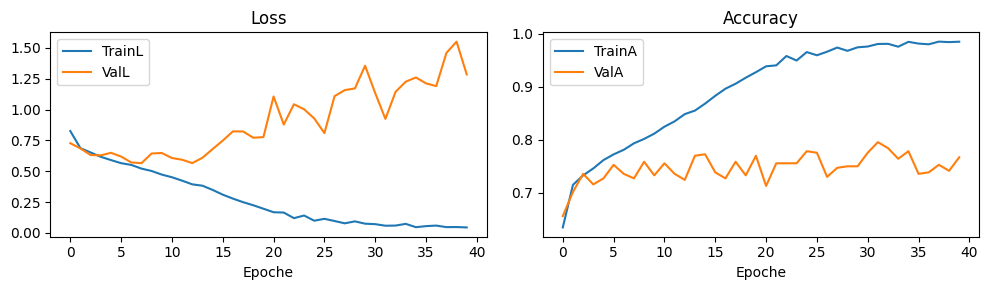


→ Fold 102/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 74, 37, 40] | Test [20]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2357, 'R': 2316, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 23, 'R': 22, '0': 45}
Ep 01/40 | TrainL 0.8096 | TrainA 0.650 | ValL 0.4642 | ValA 0.858 | BestA 0.858 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6918 | TrainA 0.713 | ValL 0.3707 | ValA 0.911 | BestA 0.911 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6520 | TrainA 0.733 | ValL 0.3496 | ValA 0.903 | BestA 0.911 |   patience 1/10
Ep 04/40 | TrainL 0.6233 | TrainA 0.747 | ValL 0.4654 | ValA 0.839 | Be

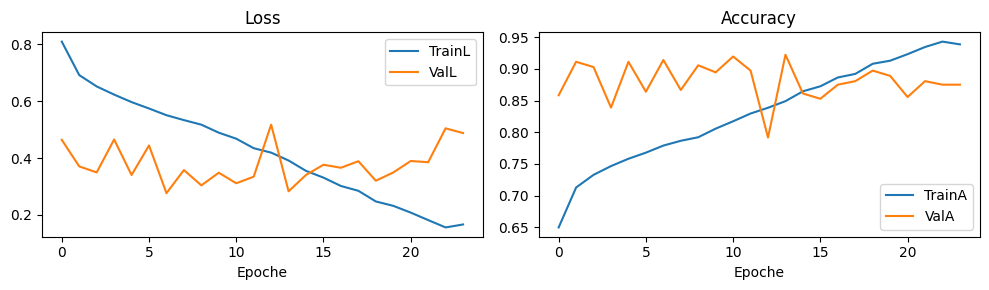


→ Fold 103/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 37, 40] | Test [74]
[DEBUG] Runs [4, 8, 12] | Macro 9367 | Sub 37468 | per class {'L': 2358, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 88 | Sub 352 | per class {'L': 22, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8183 | TrainA 0.644 | ValL 0.7698 | ValA 0.676 | BestA 0.676 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6921 | TrainA 0.716 | ValL 0.7123 | ValA 0.685 | BestA 0.685 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6440 | TrainA 0.735 | ValL 0.7986 | ValA 0.673 | BestA 0.685 |   patience 1/10
Ep 04/40 | TrainL 0.6164 | TrainA 0.748 | ValL 0.6555 | ValA 0.710 | Be

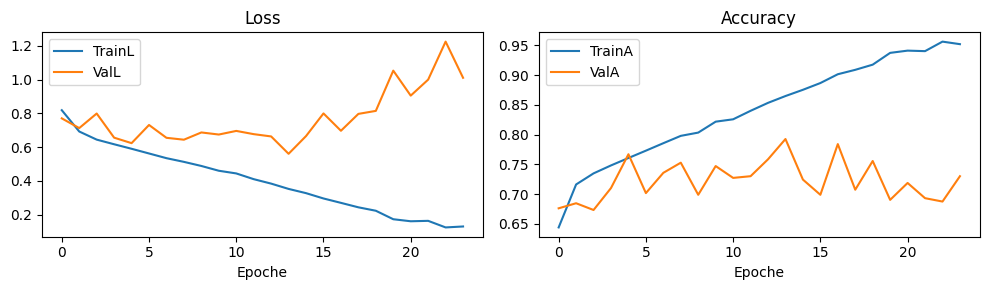


→ Fold 104/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 40] | Test [37]
[DEBUG] Runs [4, 8, 12] | Macro 9367 | Sub 37468 | per class {'L': 2358, 'R': 2317, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 88 | Sub 352 | per class {'L': 22, 'R': 21, '0': 45}
Ep 01/40 | TrainL 0.8072 | TrainA 0.650 | ValL 0.8159 | ValA 0.588 | BestA 0.588 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6848 | TrainA 0.721 | ValL 0.7601 | ValA 0.662 | BestA 0.662 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6361 | TrainA 0.741 | ValL 0.8108 | ValA 0.685 | BestA 0.685 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6080 | TrainA 0.756 | ValL 0.8295 | ValA 0.614 | Be

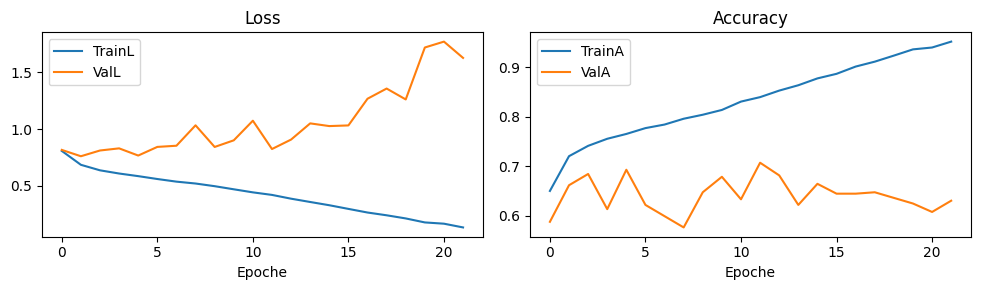


→ Fold 105/105 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37] | Test [40]
[DEBUG] Runs [4, 8, 12] | Macro 9365 | Sub 37460 | per class {'L': 2359, 'R': 2314, '0': 4692}
[DEBUG] Runs [4, 8, 12] | Macro 90 | Sub 360 | per class {'L': 21, 'R': 24, '0': 45}
Ep 01/40 | TrainL 0.8047 | TrainA 0.651 | ValL 0.4776 | ValA 0.831 | BestA 0.831 | ↑ patience 0/10
Ep 02/40 | TrainL 0.6770 | TrainA 0.721 | ValL 0.5924 | ValA 0.706 | BestA 0.831 |   patience 1/10
Ep 03/40 | TrainL 0.6412 | TrainA 0.740 | ValL 0.5042 | ValA 0.786 | BestA 0.831 |   patience 2/10
Ep 04/40 | TrainL 0.6102 | TrainA 0.751 | ValL 0.5226 | ValA 0.758 | Be

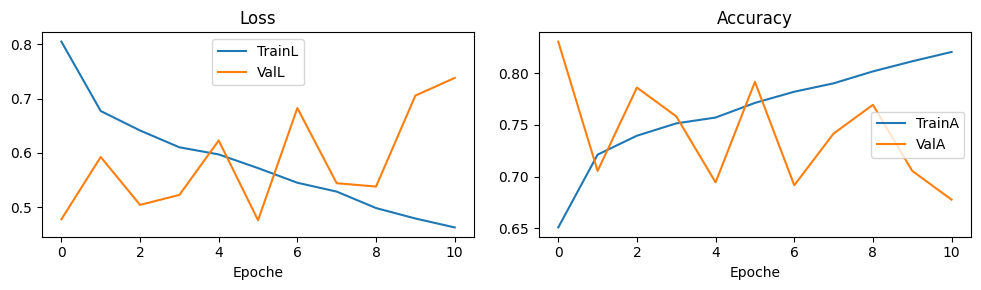


------------------------------------------------------------
exp_LR0_1s_LOSO done | Best per fold [0.9583333333333334, 0.7612359550561798, 0.7222222222222222, 0.7222222222222222, 0.6361111111111111, 0.7333333333333333, 0.6916666666666667, 0.8444444444444444, 0.7722222222222223, 0.7833333333333333, 0.6138888888888889, 0.7305555555555555, 0.7361111111111112, 0.8027777777777778, 0.6083333333333333, 0.7805555555555556, 0.8361111111111111, 0.8638888888888889, 0.9166666666666666, 0.775, 0.9611111111111111, 0.8876404494382022, 0.8555555555555555, 0.6861111111111111, 0.7777777777777778, 0.7833333333333333, 0.7194444444444444, 0.75, 0.8666666666666667, 0.7083333333333334, 0.9833333333333333, 0.7527777777777778, 0.8694444444444445, 0.8083333333333333, 0.8448275862068966, 0.7972222222222223, 0.8166666666666667, 0.8194444444444444, 0.6833333333333333, 0.5666666666666667, 0.9527777777777777, 0.575, 0.8944444444444445, 0.7305555555555555, 0.8416666666666667, 0.7138888888888889, 0.8416666666666667, 

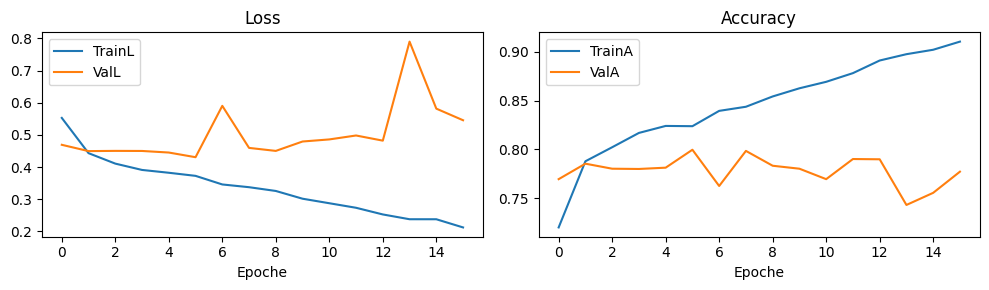


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 8, 12] | Macro 3777 | Sub 30216 | per class {'L': 1908, 'R': 1869}
[DEBUG] Runs [4, 8, 12] | Macro 941 | Sub 7528 | per class {'L': 472, 'R': 469}
Ep 01/40 | TrainL 0.5446 | TrainA 0.717 | ValL 0.4353 | ValA 0.793 | BestA 0.793 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4402 | TrainA 0.789 | ValL 0.4987 | ValA 0.765 | BestA 0.793 |   patience 1/10
Ep 03/40 | TrainL 0.4209 | TrainA 0.799 | ValL 0.4592 | ValA 0.770 | BestA 0.793 |   patience 2/10
Ep 04/40 | TrainL 0.3925 | TrainA 0.815 | ValL 0.4234 | ValA 0.795 | BestA 0.795 | ↑ patien

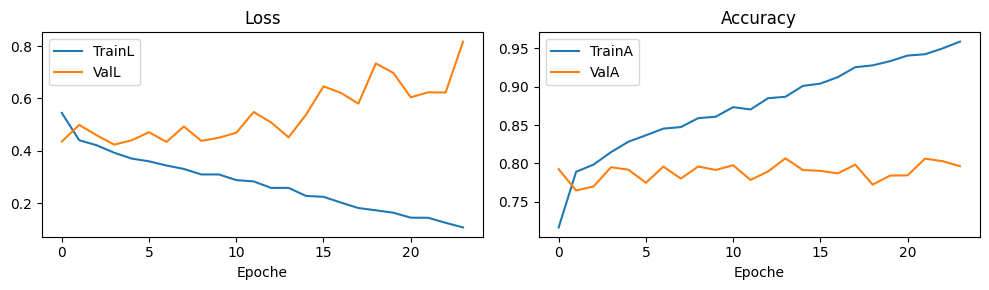


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 8, 12] | Macro 3773 | Sub 30184 | per class {'L': 1898, 'R': 1875}
[DEBUG] Runs [4, 8, 12] | Macro 945 | Sub 7560 | per class {'L': 482, 'R': 463}
Ep 01/40 | TrainL 0.5403 | TrainA 0.730 | ValL 0.4314 | ValA 0.779 | BestA 0.779 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4515 | TrainA 0.785 | ValL 0.4421 | ValA 0.785 | BestA 0.785 | ↑ patience 0/10
Ep 03/40 | TrainL 0.4182 | TrainA 0.802 | ValL 0.4362 | ValA 0.789 | BestA 0.789 | ↑ patience 0/10
Ep 04/40 | TrainL 0.4023 | TrainA 0.813 | ValL 0.4319 | ValA 0.782 | BestA 0.789 |   patien

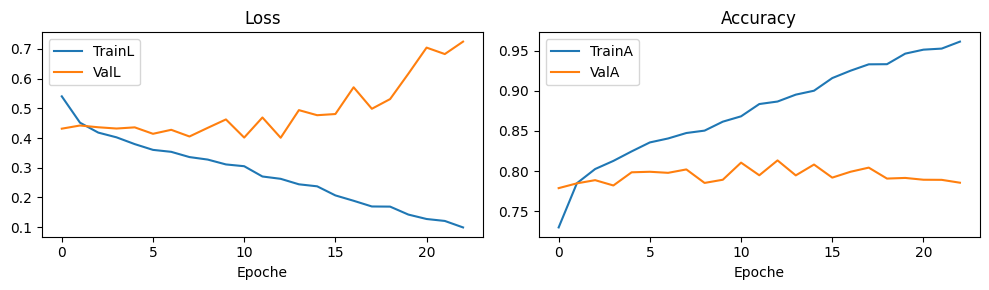


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 8, 12] | Macro 3769 | Sub 30152 | per class {'L': 1901, 'R': 1868}
[DEBUG] Runs [4, 8, 12] | Macro 949 | Sub 7592 | per class {'L': 479, 'R': 470}
Ep 01/40 | TrainL 0.5362 | TrainA 0.725 | ValL 0.4532 | ValA 0.779 | BestA 0.779 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4358 | TrainA 0.795 | ValL 0.4867 | ValA 0.762 | BestA 0.779 |   patience 1/10
Ep 03/40 | TrainL 0.4091 | TrainA 0.807 | ValL 0.4400 | ValA 0.771 | BestA 0.779 |   patience 2/10
Ep 04/40 | TrainL 0.3966 | TrainA 0.820 | ValL 0.4359 | ValA 0.793 | BestA 0.793 | ↑ patien

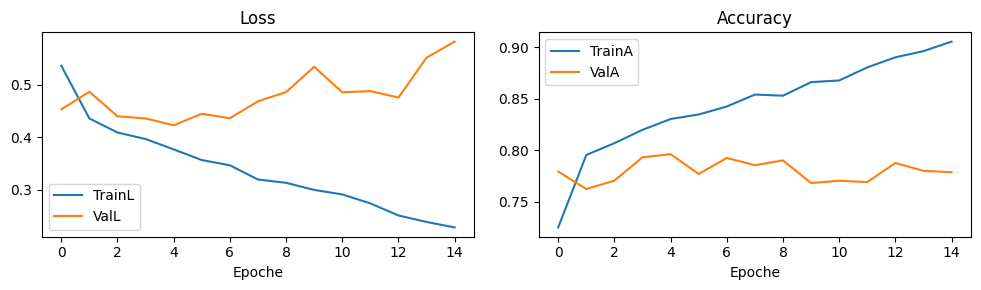


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 8, 12] | Macro 3779 | Sub 30232 | per class {'L': 1907, 'R': 1872}
[DEBUG] Runs [4, 8, 12] | Macro 939 | Sub 7512 | per class {'L': 473, 'R': 466}
Ep 01/40 | TrainL 0.5677 | TrainA 0.705 | ValL 0.4206 | ValA 0.826 | BestA 0.826 | ↑ patience 0/10
Ep 02/40 | TrainL 0.4559 | TrainA 0.778 | ValL 0.3721 | ValA 0.828 | BestA 0.828 | ↑ patience 0/10
Ep 03/40 | TrainL 0.4364 | TrainA 0.793 | ValL 0.3703 | ValA 0.831 | BestA 0.831 | ↑ patience 0/10
Ep 04/40 | TrainL 0.4194 | TrainA 0.806 | ValL 0.3755 | ValA 0.832 | BestA 0.832 | ↑ patien

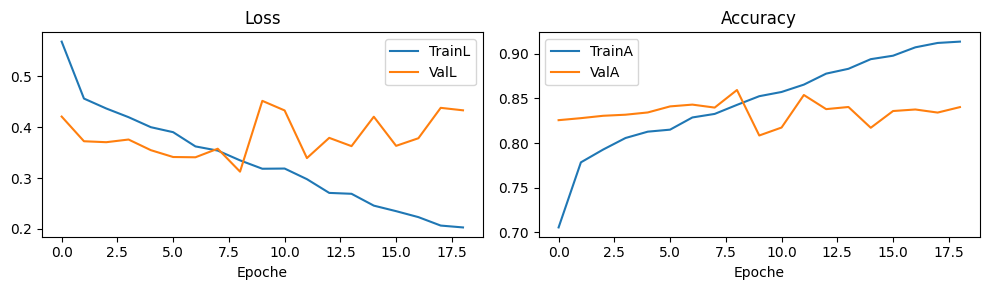


------------------------------------------------------------
exp_LR_05s done | Best per fold [0.799655720338983, 0.8067215727948991, 0.8132275132275132, 0.7962328767123288, 0.8594249201277955]
Media 0.815 ± 0.023
------------------------------------------------------------

 exp_LR0_05s | LABELS=['L', 'R', '0'] | MODE=I | WIN=0.5s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 8, 12] | Macro 7566 | Sub 60528 | per class {'L': 1906, 'R': 1868, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1889 | Sub 15112 | per class {'L': 474, 'R': 470, '0': 945}
Ep 01/40 | TrainL 0.8

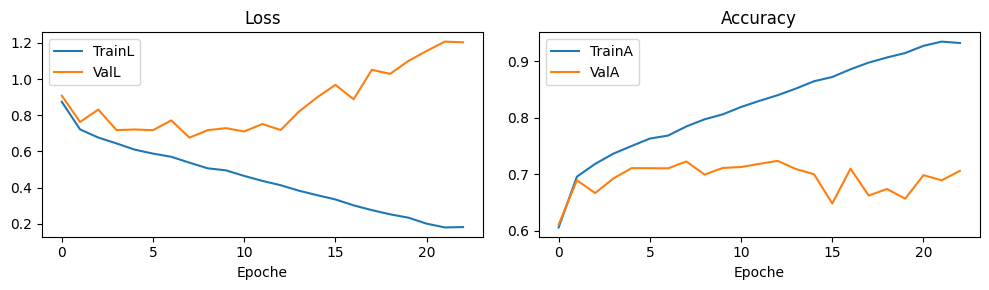


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 8, 12] | Macro 7569 | Sub 60552 | per class {'L': 1908, 'R': 1869, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1886 | Sub 15088 | per class {'L': 472, 'R': 469, '0': 945}
Ep 01/40 | TrainL 0.8943 | TrainA 0.594 | ValL 0.9687 | ValA 0.630 | BestA 0.630 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7368 | TrainA 0.692 | ValL 0.7223 | ValA 0.700 | BestA 0.700 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6876 | TrainA 0.710 | ValL 0.7240 | ValA 0.711 | BestA 0.711 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6503 | TrainA 0.733 | ValL 0.7081 | ValA 0.698 |

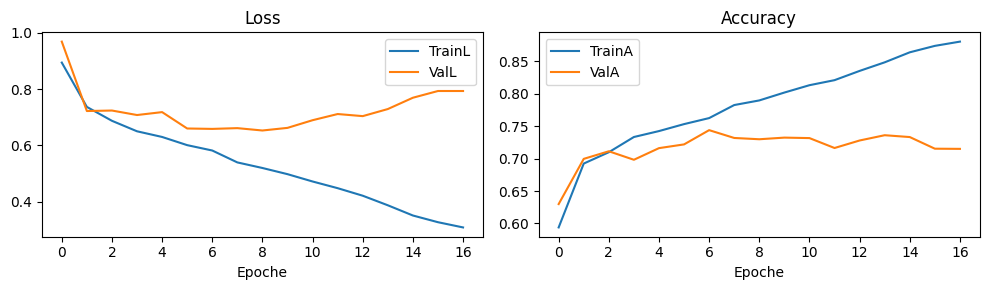


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 8, 12] | Macro 7565 | Sub 60520 | per class {'L': 1898, 'R': 1875, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1890 | Sub 15120 | per class {'L': 482, 'R': 463, '0': 945}
Ep 01/40 | TrainL 0.8862 | TrainA 0.596 | ValL 0.8134 | ValA 0.646 | BestA 0.646 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7424 | TrainA 0.690 | ValL 0.7232 | ValA 0.691 | BestA 0.691 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6850 | TrainA 0.718 | ValL 0.7125 | ValA 0.697 | BestA 0.697 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6472 | TrainA 0.733 | ValL 0.6825 | ValA 0.711 |

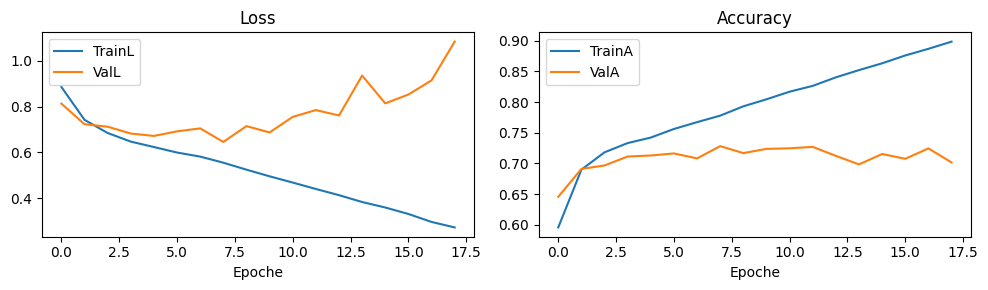


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 8, 12] | Macro 7549 | Sub 60392 | per class {'L': 1901, 'R': 1868, '0': 3780}
[DEBUG] Runs [4, 8, 12] | Macro 1906 | Sub 15248 | per class {'L': 479, 'R': 470, '0': 957}
Ep 01/40 | TrainL 0.8708 | TrainA 0.605 | ValL 0.8542 | ValA 0.628 | BestA 0.628 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7118 | TrainA 0.706 | ValL 0.7555 | ValA 0.681 | BestA 0.681 | ↑ patience 0/10
Ep 03/40 | TrainL 0.6549 | TrainA 0.734 | ValL 0.7448 | ValA 0.693 | BestA 0.693 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6336 | TrainA 0.739 | ValL 0.7861 | ValA 0.681 |

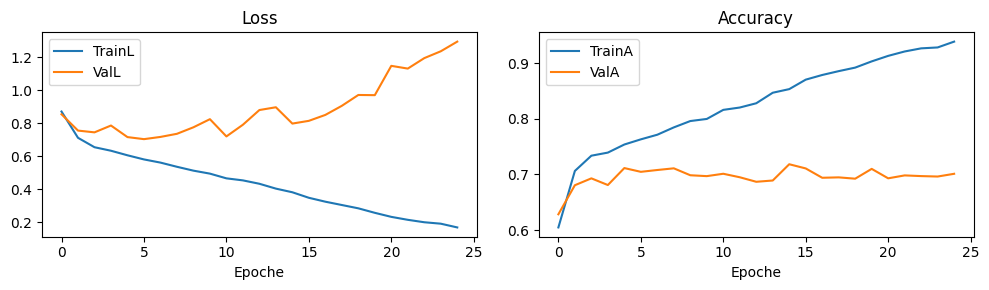


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 8, 12] | Macro 7571 | Sub 60568 | per class {'L': 1907, 'R': 1872, '0': 3792}
[DEBUG] Runs [4, 8, 12] | Macro 1884 | Sub 15072 | per class {'L': 473, 'R': 466, '0': 945}
Ep 01/40 | TrainL 0.9026 | TrainA 0.592 | ValL 0.7276 | ValA 0.694 | BestA 0.694 | ↑ patience 0/10
Ep 02/40 | TrainL 0.7501 | TrainA 0.688 | ValL 0.6557 | ValA 0.722 | BestA 0.722 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7014 | TrainA 0.707 | ValL 0.6069 | ValA 0.744 | BestA 0.744 | ↑ patience 0/10
Ep 04/40 | TrainL 0.6713 | TrainA 0.724 | ValL 0.6327 | ValA 0.731 |

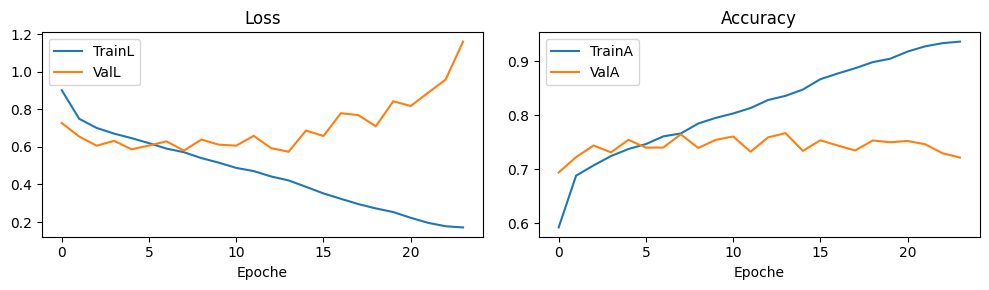


------------------------------------------------------------
exp_LR0_05s done | Best per fold [0.7232662784542085, 0.7439687168610817, 0.7281746031746031, 0.7183237145855194, 0.7668524416135881]
Media 0.736 ± 0.018
------------------------------------------------------------

 exp_LR0F_05s | LABELS=['L', 'R', '0', 'F'] | MODE=I | WIN=0.5s | FOLDS=5

→ Fold 1/5 | Train [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13243 | Sub 105944 | per class {'L': 1906, 'R': 1868, '0': 7584, 'F': 1885}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3305 | Sub 26440 | per class {'L': 474

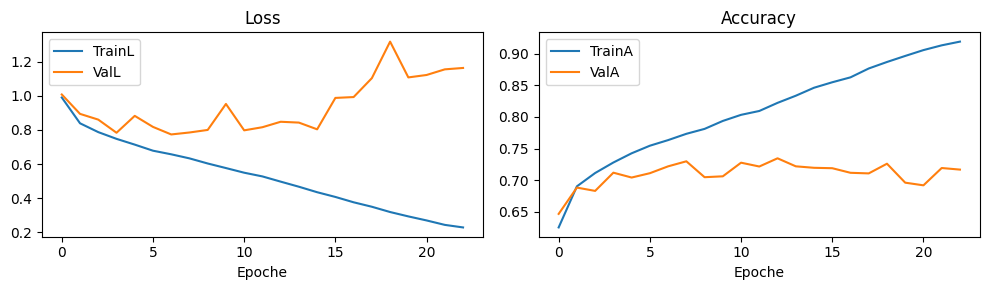


→ Fold 2/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13241 | Sub 105928 | per class {'L': 1908, 'R': 1869, '0': 7584, 'F': 1880}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3307 | Sub 26456 | per class {'L': 472, 'R': 469, '0': 1890, 'F': 476}
Ep 01/40 | TrainL 0.9796 | TrainA 0.625 | ValL 0.8954 | ValA 0.670 | BestA 0.670 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8330 | TrainA 0.688 | ValL 0.8006 | ValA 0.703 | BestA 0.703 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7817 | TrainA 0.714 | ValL 0.8704 | ValA 0.686 | BestA 0.703 |   patience 1/10
Ep 04/40 | TrainL 0.74

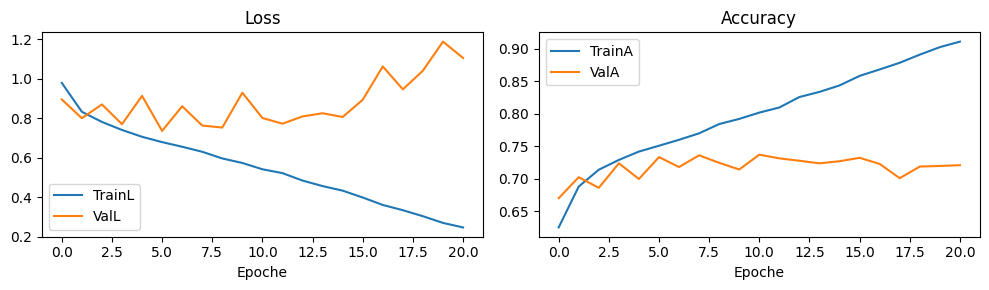


→ Fold 3/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13244 | Sub 105952 | per class {'L': 1898, 'R': 1875, '0': 7584, 'F': 1887}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3304 | Sub 26432 | per class {'L': 482, 'R': 463, '0': 1890, 'F': 469}
Ep 01/40 | TrainL 0.9749 | TrainA 0.628 | ValL 1.2386 | ValA 0.600 | BestA 0.600 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8222 | TrainA 0.700 | ValL 0.9471 | ValA 0.665 | BestA 0.665 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7729 | TrainA 0.719 | ValL 0.8823 | ValA 0.690 | BestA 0.690 | ↑ patience 0/10
Ep 04/40 | TrainL 0.73

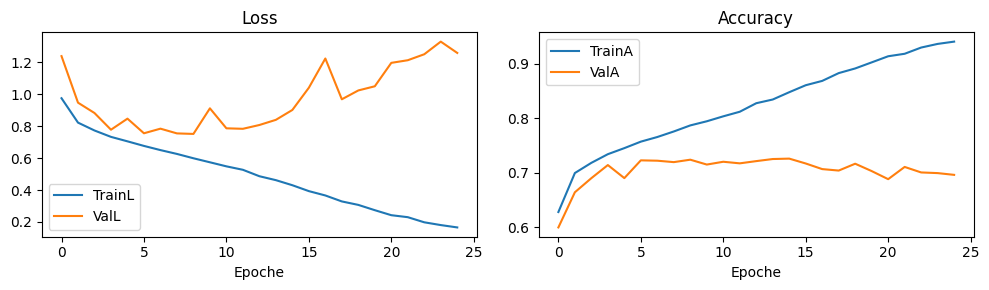


→ Fold 4/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40] | Test [69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13212 | Sub 105696 | per class {'L': 1901, 'R': 1868, '0': 7560, 'F': 1883}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3336 | Sub 26688 | per class {'L': 479, 'R': 470, '0': 1914, 'F': 473}
Ep 01/40 | TrainL 0.9628 | TrainA 0.632 | ValL 0.9057 | ValA 0.661 | BestA 0.661 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8052 | TrainA 0.703 | ValL 0.8869 | ValA 0.656 | BestA 0.661 |   patience 1/10
Ep 03/40 | TrainL 0.7646 | TrainA 0.719 | ValL 1.0065 | ValA 0.669 | BestA 0.669 | ↑ patience 0/10
Ep 04/40 | TrainL 0.72

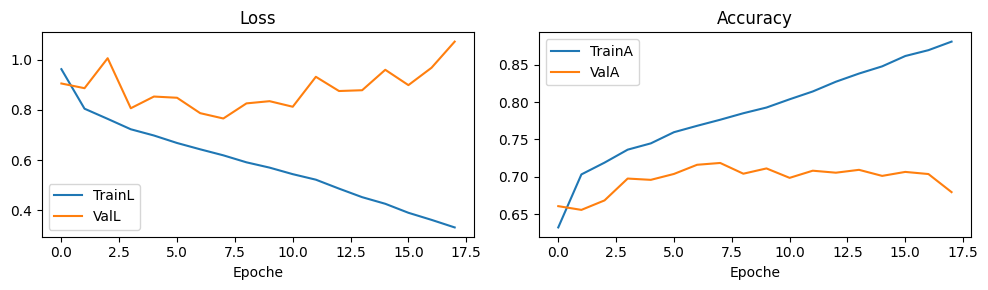


→ Fold 5/5 | Train [57, 64, 10, 51, 78, 5, 67, 56, 71, 44, 99, 4, 83, 85, 16, 63, 48, 1, 55, 19, 101, 41, 15, 26, 28, 11, 108, 103, 27, 23, 18, 93, 35, 49, 102, 97, 96, 45, 79, 87, 70, 75, 52, 105, 91, 25, 95, 32, 21, 33, 8, 42, 68, 13, 59, 47, 107, 54, 61, 84, 58, 46, 65, 69, 9, 36, 90, 38, 29, 3, 88, 39, 14, 73, 7, 76, 72, 77, 66, 94, 81, 80, 109, 17] | Test [22, 53, 2, 82, 31, 98, 50, 106, 24, 86, 12, 6, 43, 60, 62, 30, 34, 20, 74, 37, 40]
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 13252 | Sub 106016 | per class {'L': 1907, 'R': 1872, '0': 7584, 'F': 1889}
[DEBUG] Runs [4, 6, 8, 10, 12, 14] | Macro 3296 | Sub 26368 | per class {'L': 473, 'R': 466, '0': 1890, 'F': 467}
Ep 01/40 | TrainL 0.9881 | TrainA 0.624 | ValL 0.8259 | ValA 0.702 | BestA 0.702 | ↑ patience 0/10
Ep 02/40 | TrainL 0.8404 | TrainA 0.688 | ValL 0.7745 | ValA 0.703 | BestA 0.703 | ↑ patience 0/10
Ep 03/40 | TrainL 0.7933 | TrainA 0.707 | ValL 0.7429 | ValA 0.728 | BestA 0.728 | ↑ patience 0/10
Ep 04/40 | TrainL 0.75

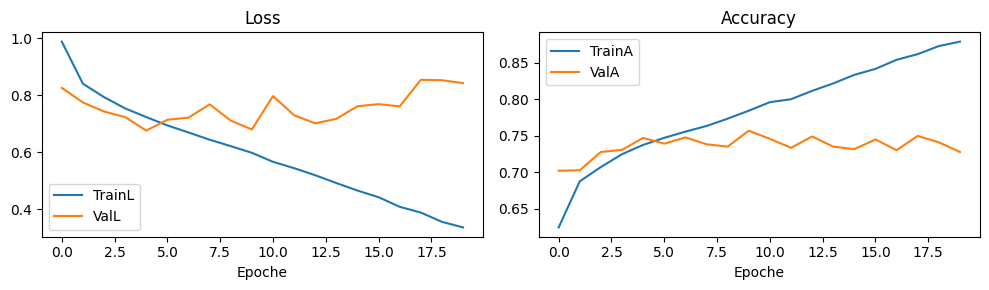


------------------------------------------------------------
exp_LR0F_05s done | Best per fold [0.73464447806354, 0.7372618687632295, 0.7262409200968523, 0.7186001199040767, 0.7567506067961165]
Media 0.735 ± 0.013
------------------------------------------------------------


In [ ]:
# ================================================================
# 8) LANCIO
# ================================================================
for name, labels, mode, win, folds in EXPERIMENTS:
    set_seeds()                     # reset RNG
    Experiment(name, labels, mode, win, folds).run(ALL_SUBJECTS)


In [ ]:
df

,experiment,acc_mean,acc_std,fold_1,fold_2,fold_3,fold_4,fold_5,fold_6,fold_7,...,fold_96,fold_97,fold_98,fold_99,fold_100,fold_101,fold_102,fold_103,fold_104,fold_105
13,exp_BF0_1s_I,0.702,0.021,0.712659,0.715024,0.691402,0.666010,0.726077,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,exp_BF_1s_I,0.739,0.018,0.732503,0.762473,0.733862,0.711498,0.755876,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17,exp_LR0FB_1s_B,0.690,0.015,0.687243,0.696393,0.671362,0.680423,0.713757,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,exp_LR0FB_1s_I,0.676,0.015,0.680831,0.687053,0.670304,0.649829,0.692231,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21,exp_LR0FB_1s_R,0.672,0.019,0.657444,0.684050,0.651587,0.662336,0.703142,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,exp_LR0FB_2s,0.678,0.015,0.696585,0.677047,0.675529,0.651666,0.689509,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,exp_LR0FB_4s,0.670,0.025,0.689171,0.675325,0.655820,0.629494,0.697742,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25,exp_LR0F_05s,0.735,0.013,0.734644,0.737262,0.726241,0.718600,0.756751,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16,exp_LR0F_1s_B,0.749,0.014,0.749659,0.752045,0.734887,0.737335,0.772921,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,exp_LR0F_1s_I,0.738,0.017,0.743268,0.742516,0.723593,0.715528,0.763122,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df

,Soggetti,Classi,Compito (I/R),Tipo classi,Validation,Finestre,Accuracy
0,103,2,I,L/R,cross 5 fold,4.0s,83.40% ± 2.10%
1,103,3,I,L/R/0,cross 5 fold,4.0s,75.80% ± 2.30%
2,103,4,I,L/R/0/F,cross 5 fold,4.0s,74.40% ± 1.50%
3,103,5,I,L/R/0/F/B,cross 5 fold,4.0s,67.00% ± 2.50%
4,103,2,I,L/R,cross 5 fold,2.0s,83.30% ± 2.30%
5,103,3,I,L/R/0,cross 5 fold,2.0s,75.50% ± 2.00%
6,103,4,I,L/R/0/F,cross 5 fold,2.0s,74.20% ± 1.90%
7,103,5,I,L/R/0/F/B,cross 5 fold,2.0s,67.80% ± 1.50%
8,103,2,I,L/R,cross 5 fold,1.0s,82.80% ± 2.20%
9,103,3,I,L/R/0,cross 5 fold,1.0s,75.10% ± 1.90%
